# Bank Customer Churn

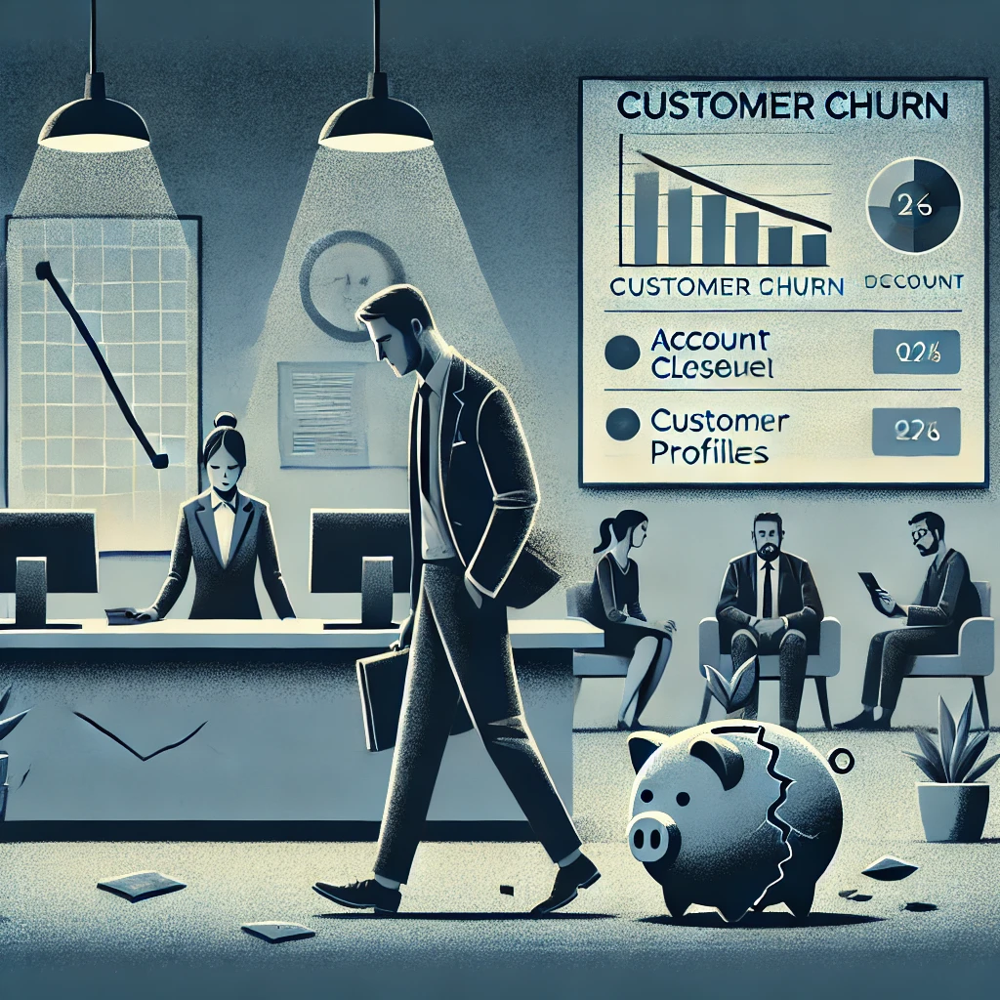

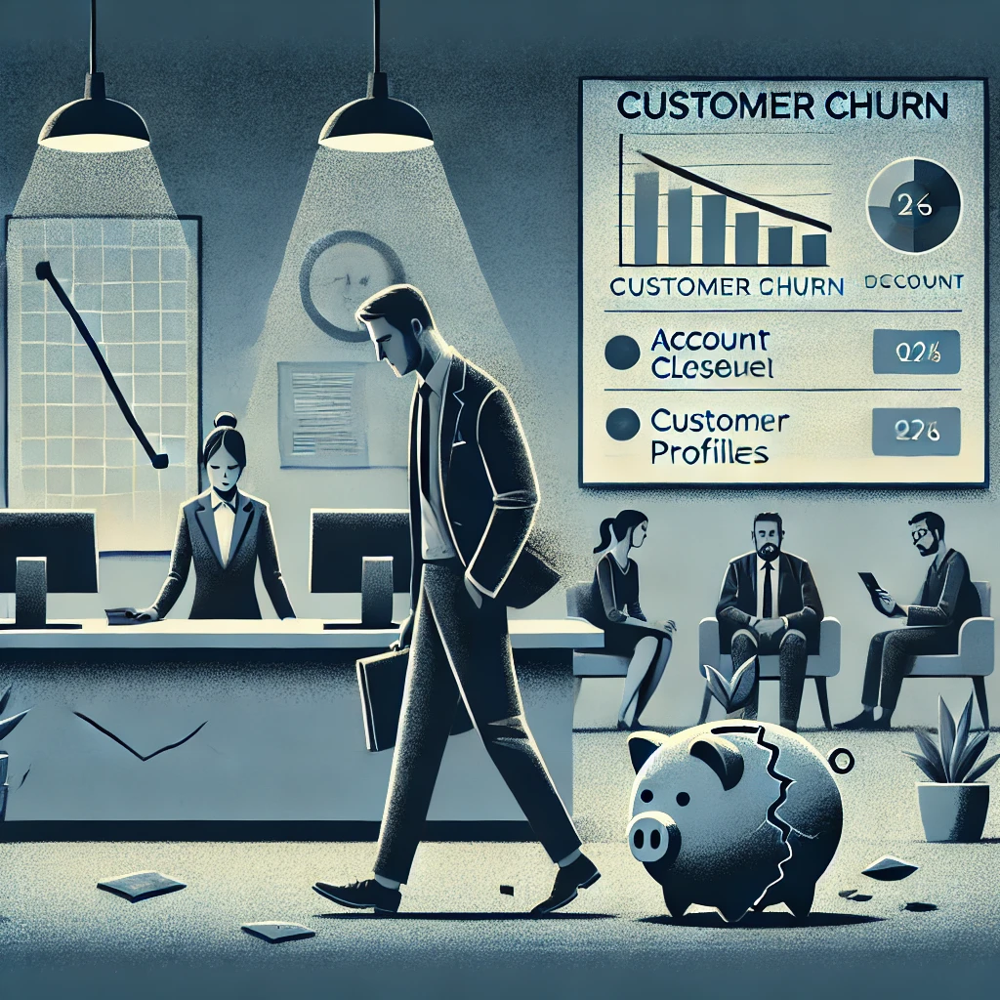
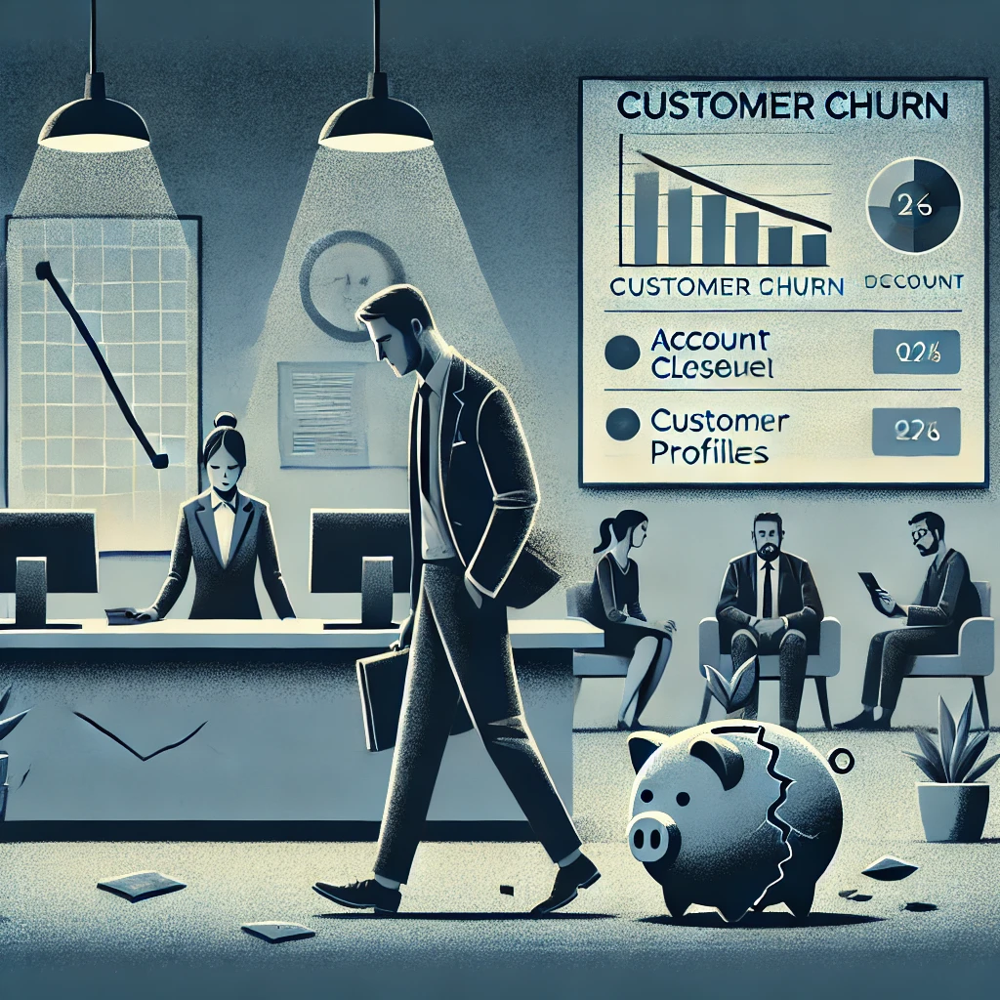
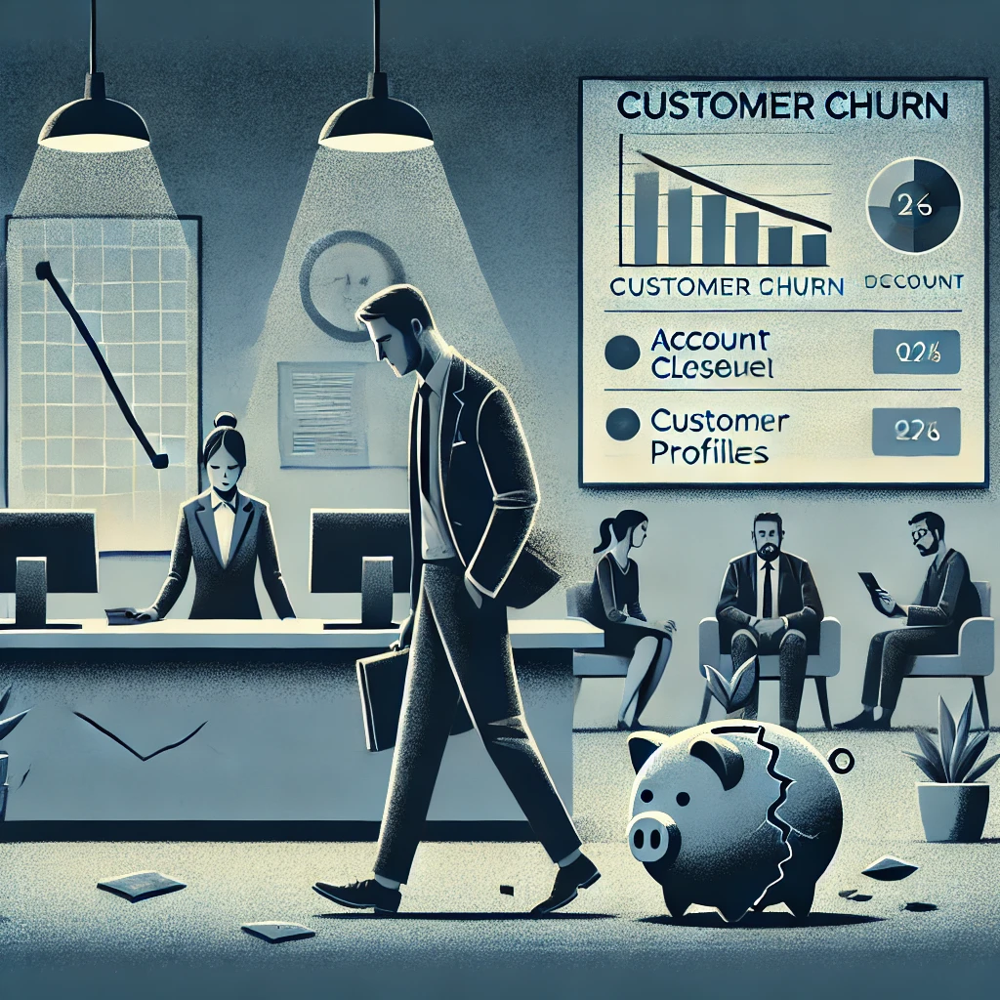
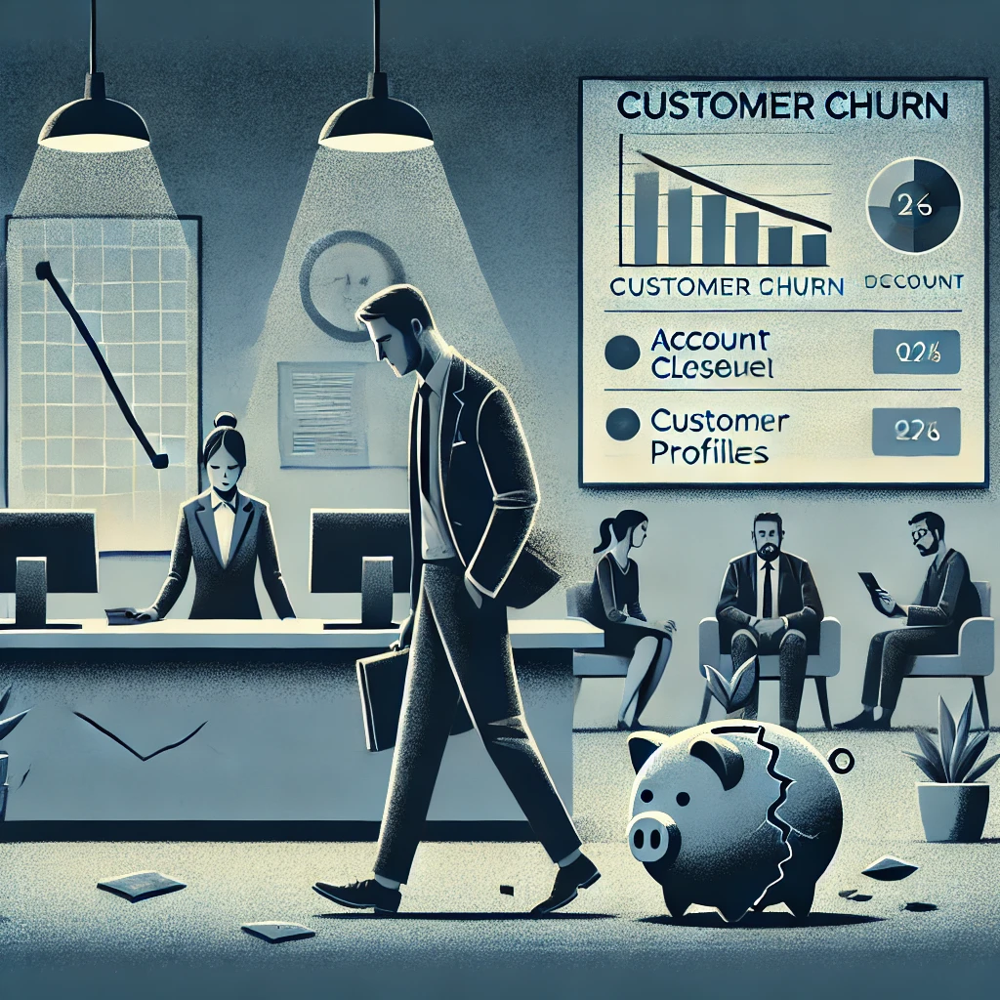
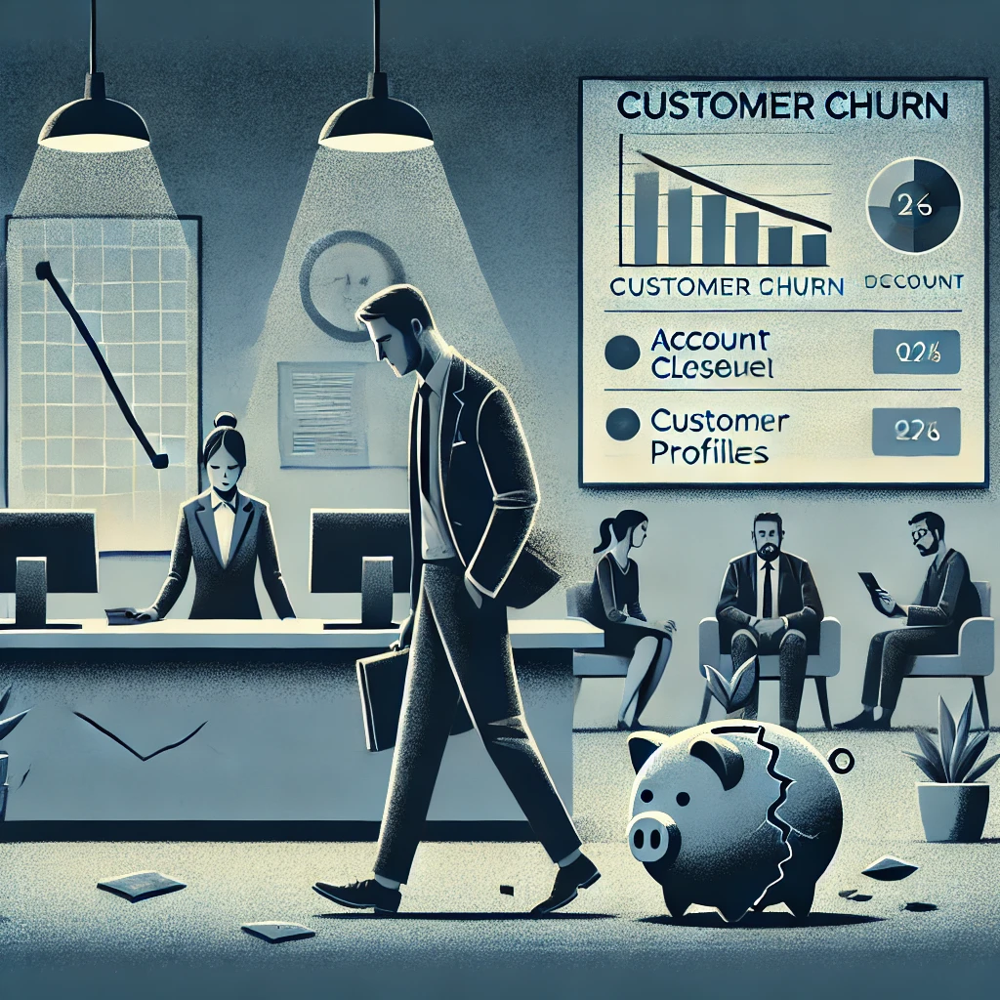

# Importando Bibliotecas 


In [34]:
import numpy as np
import pandas as pd
import scipy.stats as ss
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_predict, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (roc_auc_score, confusion_matrix, precision_score, recall_score, 
                             f1_score, accuracy_score, roc_curve, auc, make_scorer)
from imblearn.under_sampling import RandomUnderSampler
import xgboost as xgb
from catboost import CatBoostClassifier
from sklearn.inspection import permutation_importance
import matplotlib.cm as cm
import optuna
import warnings
import os
from datetime import datetime, timedelta
import time




import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/customer-churn-records/Customer-Churn-Records.csv


# Dicinário de Dados 


| **Variável**         | **Tipo**   | **Descrição**                                                                                                                                     |
|-----------------------|------------|---------------------------------------------------------------------------------------------------------------------------------------------------|
| RowNumber            | int64      | Número do registro (linhas), sem efeito na construção de modelos.                                                                                |
| CustomerId           | int64      | ID do cliente, sem efeito sobre o estudo.                                                                                                       |
| Surname              | object     | Sobrenome do cliente, sem impacto na análise.                                                                                                   |
| CreditScore          | int64      | Pontuação de crédito, pode indicar tendência de permanência de clientes com pontuação alta.                                                     |
| Geography            | object     | Localização do cliente, pode influenciar a decisão de evasão.                                                                                   |
| Gender               | object     | Gênero do cliente, possível influência na evasão.                                                                                               |
| Age                  | int64      | Idade do cliente, clientes mais velhos tendem a permanecer.                                                                                     |
| Tenure               | int64      | Anos que o cliente está no banco, clientes novos têm maior chance de evasão.                                                                    |
| Balance              | float64    | Saldo na conta, pessoas com saldos altos são menos propensas a sair.                                                                            |
| NumOfProducts        | int64      | Número de produtos adquiridos pelo cliente.                                                                                                    |
| HasCrCard            | int64      | Indica se o cliente tem cartão de crédito, clientes com cartão são menos propensos à evasão.                                                    |
| IsActiveMember       | int64      | Clientes ativos têm menor chance de evasão.                                                                                                    |
| EstimatedSalary      | float64    | Salário estimado, clientes com salários mais altos tendem a permanecer.                                                                         |
| Exited               | int64      | Indica se o cliente saiu ou não do banco, variável de predição (“churn”).                                                                       |
| Complain             | int64      | Indica se o cliente fez reclamação.                                                                                                             |
| Satisfaction Score   | int64      | Pontuação de satisfação com a resolução de reclamação.                                                                                          |
| Card Type            | object     | Tipo de cartão que o cliente possui.                                                                                                            |
| Points Earned        | int64      | Pontos ganhos pelo cliente.                                                                                                                     |


# Análise Exploratória (EDA) & Data Wrangling 


In [35]:
# base de dados
base_original = pd.read_csv('/kaggle/input/customer-churn-records/Customer-Churn-Records.csv', sep=',')

#primeiras linhas 
primeiras_linahs = base_original.head()
print(primeiras_linahs)

   RowNumber  CustomerId   Surname  CreditScore Geography  Gender  Age  \
0          1    15634602  Hargrave          619    France  Female   42   
1          2    15647311      Hill          608     Spain  Female   41   
2          3    15619304      Onio          502    France  Female   42   
3          4    15701354      Boni          699    France  Female   39   
4          5    15737888  Mitchell          850     Spain  Female   43   

   Tenure    Balance  NumOfProducts  HasCrCard  IsActiveMember  \
0       2       0.00              1          1               1   
1       1   83807.86              1          0               1   
2       8  159660.80              3          1               0   
3       1       0.00              2          0               0   
4       2  125510.82              1          1               1   

   EstimatedSalary  Exited  Complain  Satisfaction Score Card Type  \
0        101348.88       1         1                   2   DIAMOND   
1        112542.58

Analisando primeiras impressões da base de dados


In [36]:
#Dimensões da base de dados
print("Numero de linhas:", base_original.shape[0]) #10.000 linhas originais.
print("Numero de colunas:", base_original.shape[1])# 18 Colunas (variaveis) originais.


Numero de linhas: 10000
Numero de colunas: 18


In [37]:
#Verificando nome das colunas e tipos

tipos = base_original.dtypes
print(tipos)

RowNumber               int64
CustomerId              int64
Surname                object
CreditScore             int64
Geography              object
Gender                 object
Age                     int64
Tenure                  int64
Balance               float64
NumOfProducts           int64
HasCrCard               int64
IsActiveMember          int64
EstimatedSalary       float64
Exited                  int64
Complain                int64
Satisfaction Score      int64
Card Type              object
Point Earned            int64
dtype: object


In [38]:
#checando se há valores nulos 

tem_null=base_original.isnull().sum()  #como podemos ver não há valores nulos em nenhuma das variáveis

print(tem_null)



RowNumber             0
CustomerId            0
Surname               0
CreditScore           0
Geography             0
Gender                0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
HasCrCard             0
IsActiveMember        0
EstimatedSalary       0
Exited                0
Complain              0
Satisfaction Score    0
Card Type             0
Point Earned          0
dtype: int64


In [39]:
# Resumo estatistico da base original
describe_original = base_original.describe()
print(describe_original)

         RowNumber    CustomerId   CreditScore           Age        Tenure  \
count  10000.00000  1.000000e+04  10000.000000  10000.000000  10000.000000   
mean    5000.50000  1.569094e+07    650.528800     38.921800      5.012800   
std     2886.89568  7.193619e+04     96.653299     10.487806      2.892174   
min        1.00000  1.556570e+07    350.000000     18.000000      0.000000   
25%     2500.75000  1.562853e+07    584.000000     32.000000      3.000000   
50%     5000.50000  1.569074e+07    652.000000     37.000000      5.000000   
75%     7500.25000  1.575323e+07    718.000000     44.000000      7.000000   
max    10000.00000  1.581569e+07    850.000000     92.000000     10.000000   

             Balance  NumOfProducts    HasCrCard  IsActiveMember  \
count   10000.000000   10000.000000  10000.00000    10000.000000   
mean    76485.889288       1.530200      0.70550        0.515100   
std     62397.405202       0.581654      0.45584        0.499797   
min         0.000000     

In [40]:
# Limpando variavéis que não tem interferencia na analise 

df = base_original[['CreditScore','Gender','Geography','Age','Tenure','Balance',
                   'NumOfProducts','HasCrCard','IsActiveMember',
                   'EstimatedSalary','Complain','Satisfaction Score',
                   'Card Type','Point Earned','Exited'
                   ]]


In [41]:
#Resumo estatistico das varaiveis Quanti

#quanti 
quanti = df[['EstimatedSalary', 'Balance', 'CreditScore','Age', 'Tenure','Point Earned']]

resumo_estati_quant=quanti.describe() 
# Aplicar formatação para ter 1 casa decimal e separador de milhar (invertendo ponto e vírgula)
resumo_estati_quant_formatado = resumo_estati_quant.applymap(lambda x: f'{x:,.1f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))

print(resumo_estati_quant_formatado)


      EstimatedSalary    Balance CreditScore       Age    Tenure Point Earned
count        10.000,0   10.000,0    10.000,0  10.000,0  10.000,0     10.000,0
mean        100.090,2   76.485,9       650,5      38,9       5,0        606,5
std          57.510,5   62.397,4        96,7      10,5       2,9        225,9
min              11,6        0,0       350,0      18,0       0,0        119,0
25%          51.002,1        0,0       584,0      32,0       3,0        410,0
50%         100.193,9   97.198,5       652,0      37,0       5,0        605,0
75%         149.388,2  127.644,2       718,0      44,0       7,0        801,0
max         199.992,5  250.898,1       850,0      92,0      10,0      1.000,0


In [42]:
#%% Resumo estatistico das varaiveis Quali (tabelas de frequencias)
quali = df[['HasCrCard', 'IsActiveMember', 'Geography','Gender'
            ,'Complain','Exited','Card Type']]
quali = quali.astype('object')

print(quali['HasCrCard'].value_counts())
print(" ")
print(quali['IsActiveMember'].value_counts())
print(" ")
print(quali['Geography'].value_counts())
print(" ")
print(quali['Gender'].value_counts())
print(" ")
print(quali['Complain'].value_counts())
print(" ")
print(quali['Card Type'].value_counts())
print(" ")
print(quali['Exited'].value_counts())

HasCrCard
1    7055
0    2945
Name: count, dtype: int64
 
IsActiveMember
1    5151
0    4849
Name: count, dtype: int64
 
Geography
France     5014
Germany    2509
Spain      2477
Name: count, dtype: int64
 
Gender
Male      5457
Female    4543
Name: count, dtype: int64
 
Complain
0    7956
1    2044
Name: count, dtype: int64
 
Card Type
DIAMOND     2507
GOLD        2502
SILVER      2496
PLATINUM    2495
Name: count, dtype: int64
 
Exited
0    7962
1    2038
Name: count, dtype: int64


In [43]:
# Verificando tipos das variaveis quali
quali.dtypes

HasCrCard         object
IsActiveMember    object
Geography         object
Gender            object
Complain          object
Exited            object
Card Type         object
dtype: object

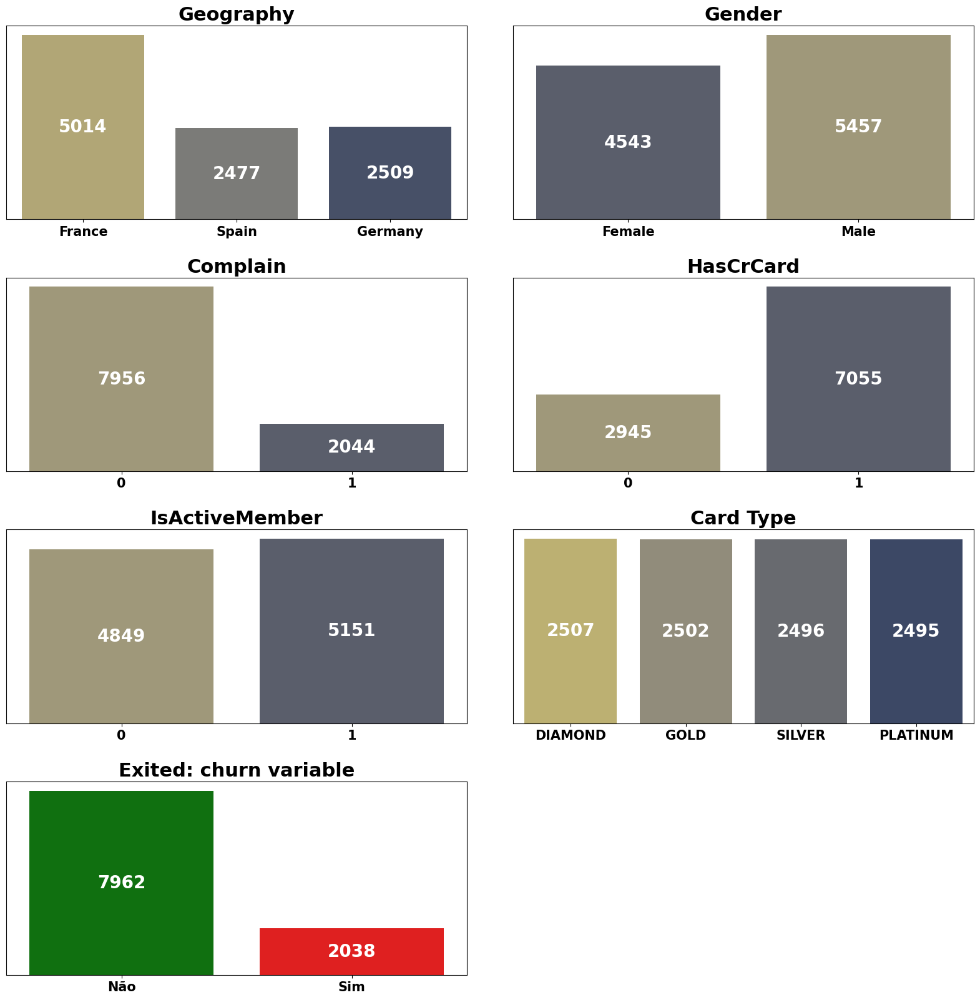

In [44]:
#%%Analises gráficas: variaveis Categóricas 


def add_value_labels(ax):#funcao que adc rótulos de dados com fundo arredondado nas barras do gráfico
    for p in ax.patches:
        height = p.get_height()
        color = p.get_facecolor()  # Obtém a cor da barra
        # rótulo no centro da barra com fundo da mesma cor da barra e bordas arredondadas
        ax.text(p.get_x() + p.get_width() / 2., height / 2.,
                f'{int(height)}',  # Formata o valor para int
                ha='center', va='center', fontsize=20, color='white', fontweight='bold',
                bbox=dict(facecolor=color, edgecolor='none', alpha=0.7,
                          boxstyle='round,pad=0.4', linewidth=1))

plt.figure(figsize=(20, 25))


#plt.suptitle('Frequência absoluta\n das variaveis qualitativas', fontsize=45)

# Geography
plt.subplot(5, 2, 1)
ax1 = plt.gca()
ax1.set_title('Geography', fontsize=22, fontweight='bold')
sns.countplot(x='Geography', palette='cividis_r', data=base_original, ax=ax1)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax1)

# Gender
plt.subplot(5, 2, 2)
ax2 = plt.gca()
ax2.set_title('Gender', fontsize=22, fontweight='bold')
sns.countplot(x='Gender', palette='cividis', data=base_original, ax=ax2)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax2)
# Complain
plt.subplot(5, 2, 3)
ax10 = plt.gca()
ax10.set_title('Complain', fontsize=22, fontweight='bold')
sns.countplot(x='Complain', palette='cividis_r', data=base_original, ax=ax10)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax10)

# HasCrCard
plt.subplot(5, 2, 4)
ax5 = plt.gca()
ax5.set_title('HasCrCard', fontsize=22, fontweight='bold')
sns.countplot(x='HasCrCard', palette='cividis_r', data=base_original, ax=ax5)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax5)

# IsActiveMember
plt.subplot(5, 2, 5)
ax6 = plt.gca()
ax6.set_title('IsActiveMember', fontsize=22, fontweight='bold')
sns.countplot(x='IsActiveMember', palette='cividis_r', data=base_original, ax=ax6)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax6)

# Card Type
plt.subplot(5, 2, 6)
ax10 = plt.gca()
ax10.set_title('Card Type', fontsize=22, fontweight='bold')
sns.countplot(x='Card Type', palette='cividis_r', data=base_original, ax=ax10)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax10)

# Exited
plt.subplot(5, 2, 7)
ax7 = plt.gca()
ax7.set_title('Exited: churn variable', fontsize=22, fontweight='bold')
custom_palette = ['green', 'red']
sns.countplot(x='Exited', palette=custom_palette, data=base_original, ax=ax7)
plt.xlabel('') 
plt.ylabel('') 
plt.xticks(fontsize=15, rotation=0,fontweight='bold')
plt.yticks([])
add_value_labels(ax7)


ax7.set_xticks([0, 1])  # Define os ticks manualmente
ax7.set_xticklabels(['Não', 'Sim'], fontsize=15, fontweight='bold')  # Rótulos personalizados
add_value_labels(ax7)


# ajusta a distância entre os gráficos
plt.subplots_adjust(hspace=0.3, wspace=0.1)




# ANÁLISES DE FREQUENCIAS

# - Maioria dos clientes é da França 

# - Os clientes são bem distribuídos entre os generos masculino e feminino 

# - a maioria dos clientes tem de 1 a 9 anos, aparentemente clientes com mais de 9 anos não permanecem (isso deve ser investigado pela quantidade de churn por Tenure)
#   e tem poucos clientes com menos de 1 ano, oque pode ser poucos novos clientes ou um churn elevado nos clientes com menos de 1 ano  (isso deve ser investigado pela quantidade de churn por Tenure)

# - Clientes tem em grande maioria entre 1 e 2 produtos, mantendo um equilibrio entre essas duas categorias. 

# - A maioria dos clientes tem cartão de crédito (70,55%)

# - Clientes ativos e não ativos estão bem distribuídos 

# - Nossa variavel de estudo está desbalanceada, como o objetivo é prever
#  principalmente quem churn é verdadeiro (embora vamos avaliar a capacidade de prever o não churn tbm para obtermos um bom modelo)
#  OBS: PESQUISAR SOBRE APLICAR MODELAGEM PRABABILISTICA E SE TEM COMO APLICAR AS DUAS (BINÁRIA E PROBABILISTICA JUNTAS) PORQUE AOS INVES DE SIM OU NAO A PROBABILISTICA RETORNA UM % DE CHANCE DE CHURN, ISSO PODE SER UTIL DIVIDIR AS ACOES E OS RECURSOS EM CASOS PRATICOS 
 
# - A maioria dos clientes não tem reclamação ( provavelmente quem reclamou churneou, isso explica a correlacao absoluta entre essa variavel e a variavel alvo)

# - a pontuacoa de resolucao de reclamacoes é bem distribuida 

# - Os clientes por perfil de cartao de credito também são bem distrbuídos. 
 
 



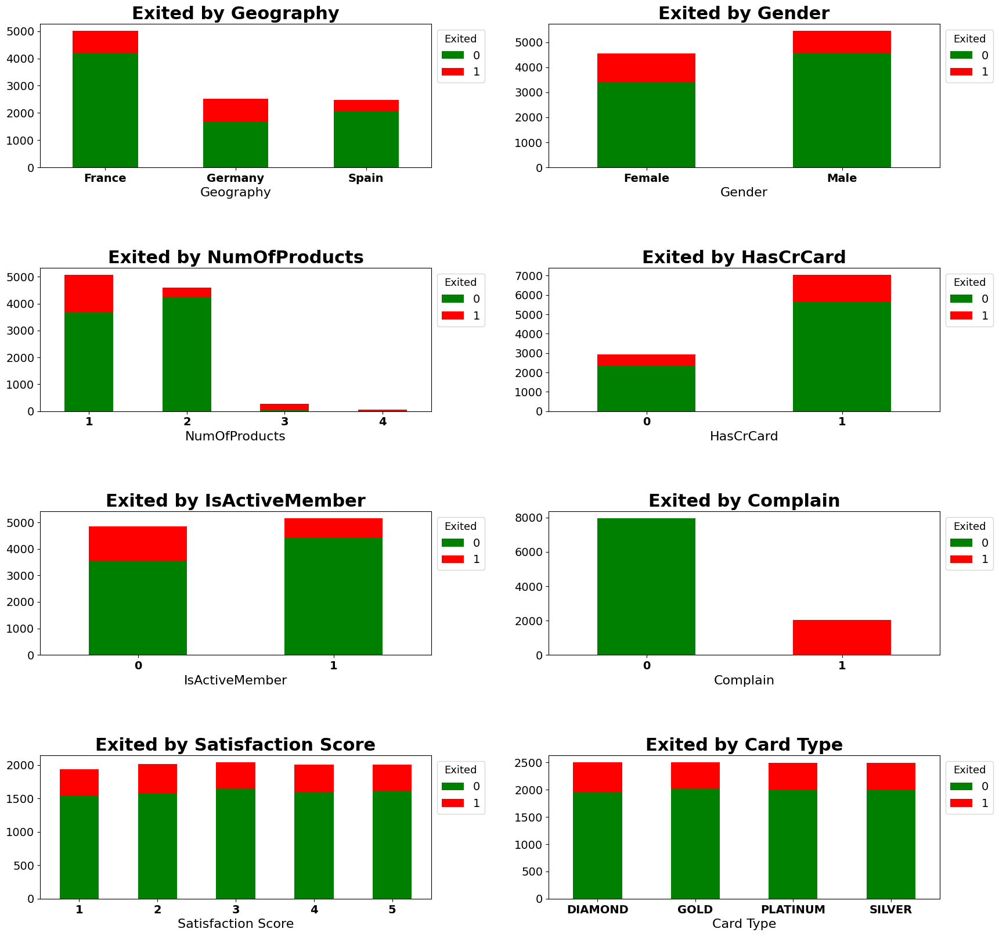

In [45]:
#%% Analisando relaçoes entre aa variavel alvo e as demais variaveis explicativas 
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 25))

def add_legend(ax):
    """Adiciona a legenda no canto superior direito e garante que os rótulos sejam exibidos"""
    handles, labels = ax.get_legend_handles_labels()
    if not handles:
        # Se não houver handles, adicione manualmente
        handles = [plt.Rectangle((0,0),1,1, color=c) for c in ['green', 'red']]
        labels = ['Not Exited', 'Exited']
    # Adiciona a legenda fora da área das barras
    ax.legend(handles, labels, loc='upper left', fontsize=14, title='Exited', title_fontsize='13',
              bbox_to_anchor=(1.0, 1))  # Ajusta a posição da legenda para fora das barras

# Geography
plt.subplot(5, 2, 1)
counts = base_original.groupby(['Geography', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by Geography', fontsize=22, fontweight='bold')
plt.xlabel('Geography', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# Gender
plt.subplot(5, 2, 2)
counts = base_original.groupby(['Gender', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by Gender', fontsize=22, fontweight='bold')
plt.xlabel('Gender', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# NumOfProducts
plt.subplot(5, 2, 3)
counts = base_original.groupby(['NumOfProducts', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by NumOfProducts', fontsize=22, fontweight='bold')
plt.xlabel('NumOfProducts', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# HasCrCard
plt.subplot(5, 2, 4)
counts = base_original.groupby(['HasCrCard', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by HasCrCard', fontsize=22, fontweight='bold')
plt.xlabel('HasCrCard', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# IsActiveMember
plt.subplot(5, 2, 5)
counts = base_original.groupby(['IsActiveMember', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by IsActiveMember', fontsize=22, fontweight='bold')
plt.xlabel('IsActiveMember', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# Complain
plt.subplot(5, 2, 6)
counts = base_original.groupby(['Complain', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by Complain', fontsize=22, fontweight='bold')
plt.xlabel('Complain', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# Satisfaction Score
plt.subplot(5, 2, 7)
counts = base_original.groupby(['Satisfaction Score', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by Satisfaction Score', fontsize=22, fontweight='bold')
plt.xlabel('Satisfaction Score', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# Card Type
plt.subplot(5, 2, 8)
counts = base_original.groupby(['Card Type', 'Exited']).size().unstack().fillna(0)
ax = counts.plot(kind='bar', stacked=True, color=['green', 'red'], ax=plt.gca())  # Cores invertidas
plt.title('Exited by Card Type', fontsize=22, fontweight='bold')
plt.xlabel('Card Type', fontsize=16)
plt.ylabel('', fontsize=16)
plt.xticks(fontsize=14, rotation=0,fontweight='bold')
plt.yticks(fontsize=14)
add_legend(ax)

# Ajustar a distância entre os gráficos
plt.subplots_adjust(hspace=0.7, wspace=0.3)

# Separação Treino e Teste

In [46]:
# Dumizando

# Transformando colunas específicas em tipo object
cols_to_transform = ['HasCrCard', 'IsActiveMember', 'Geography', 'Gender',
                     'Exited', 'Card Type']

df[cols_to_transform] = df[cols_to_transform].astype('object')

# Removendo a coluna 'Complain'
df_dummies = df.drop(columns=['Complain'])

df_dummies.dtypes

df_dummies = pd.get_dummies(df,
                           columns=['HasCrCard',
                                    'IsActiveMember', 
                                    'Geography',
                                    'Gender',
                                    'Card Type'],
                           dtype=int,
                           drop_first=False)

#apresentaram correlacao alta, para evitar multicolinearidade foram removidas 
df_dummies = df_dummies.drop(columns=['HasCrCard_0','IsActiveMember_0','Gender_Female'])

#verificando tipos gerados
df_dummies.dtypes


CreditScore             int64
Age                     int64
Tenure                  int64
Balance               float64
NumOfProducts           int64
EstimatedSalary       float64
Complain                int64
Satisfaction Score      int64
Point Earned            int64
Exited                 object
HasCrCard_1             int64
IsActiveMember_1        int64
Geography_France        int64
Geography_Germany       int64
Geography_Spain         int64
Gender_Male             int64
Card Type_DIAMOND       int64
Card Type_GOLD          int64
Card Type_PLATINUM      int64
Card Type_SILVER        int64
dtype: object

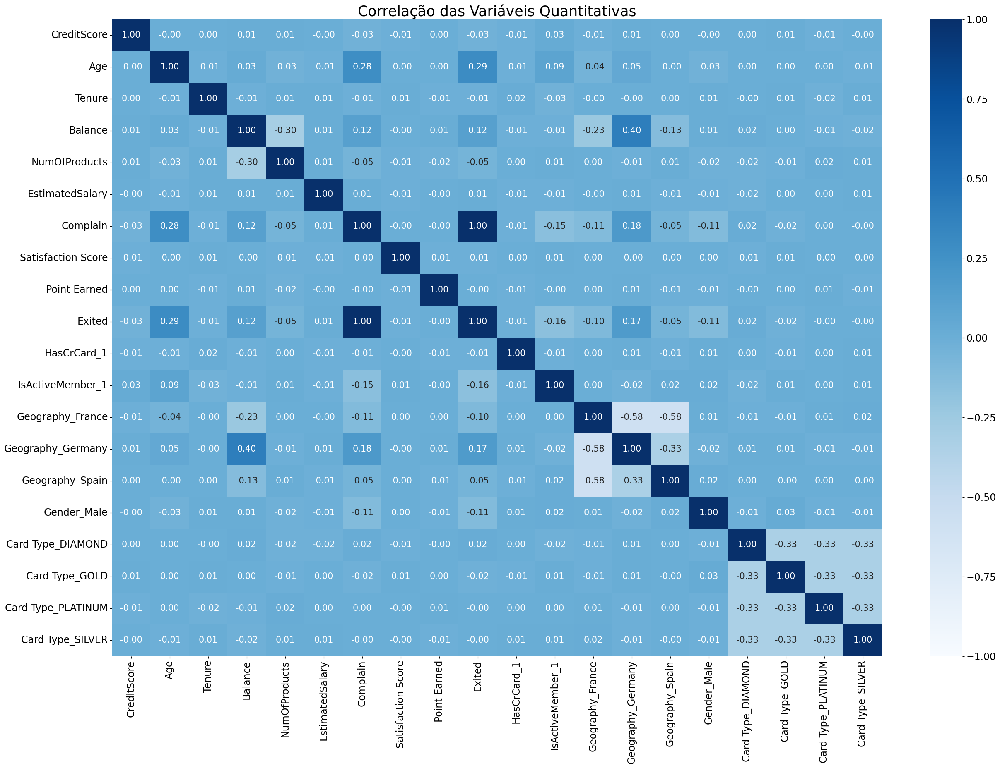

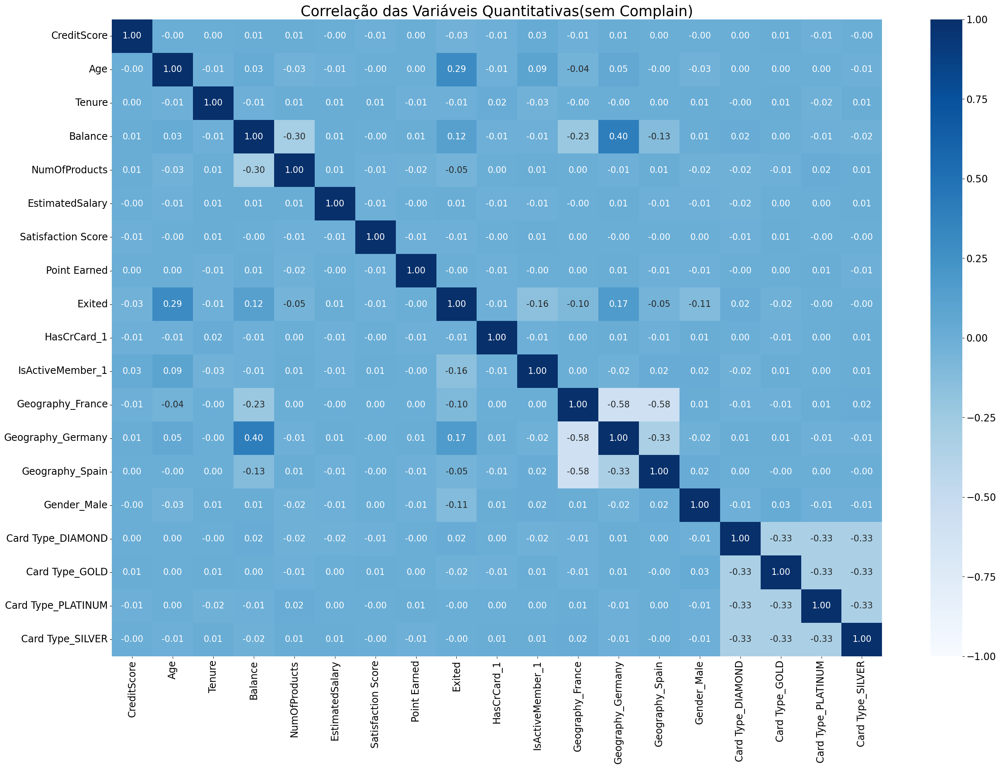

In [47]:
#%%Analises gráficas: correlação das variaveis Numéricas 

correlation_matrix = df_dummies.corr().round(2)
correlation_matrix

# Mapa de calor das variaveis quanti
plt.figure(figsize=(30, 20))
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt=".2f",
                      cmap=plt.cm.Blues,
                      annot_kws={'size': 15}, vmin=-1, vmax=1)
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=17)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=17)
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=17)
plt.title('Correlação das Variáveis Quantitativas', fontsize=25)
plt.show()


#PALETAS ALTERNATIVAS 
# '_r' NO FINAL INVERTE AS CORES
# viridis - paleta boa para apresentar para pesssoas com problemas como daltonismo
# inferno
# magma
# cividis
# coolwarm
# Blues
# Greens
# Reds


#IMPORTANTE: variavel 'complain' apresentou correlação total (1) com avariavel alvo 'Exited' 
#vamos remove-la do modelo por enquanto mas ela sera preservada na base opriginal caso seja necessario


quali = quali.drop('Complain', axis=1)
df_dummies = df_dummies.drop('Complain', axis=1)


correlation_matrix2 = df_dummies.corr().round(2)
correlation_matrix2

# Mapa de calor das variaveis quanti (SEM COMPLAIN)
plt.figure(figsize=(30, 20))
heatmap = sns.heatmap(correlation_matrix2, annot=True, fmt=".2f",
                      cmap=plt.cm.Blues,
                      annot_kws={'size': 15}, vmin=-1, vmax=1)
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=17)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=17)
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=17)
plt.title('Correlação das Variáveis Quantitativas(sem Complain)',fontsize=25)
plt.show()



In [48]:
#Separando as bases de Treino e Teste


df_dummies.dtypes

df_dummies['Exited'] = df_dummies['Exited'].astype('int64')


X = df_dummies .drop('Exited', axis=1)

y =  df_dummies['Exited']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



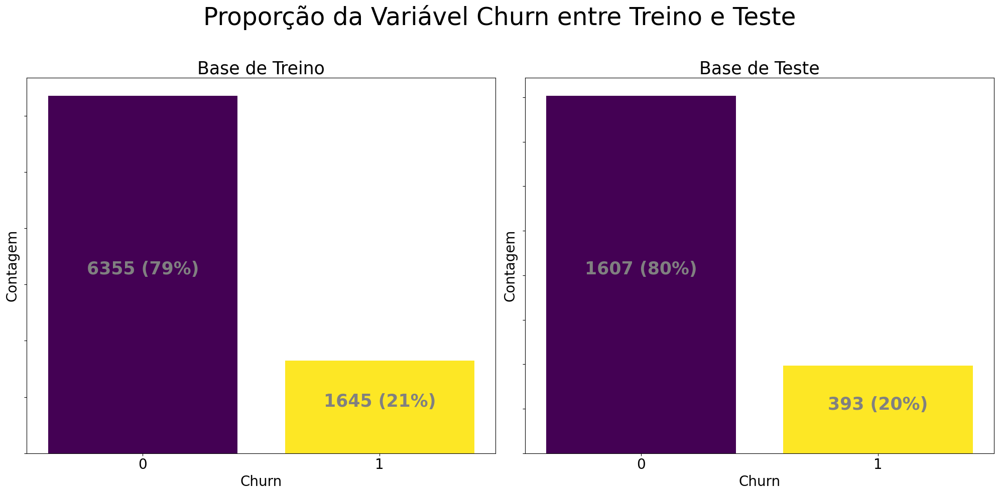

In [49]:
#verificando a proporcao de churn nas bases de treino e teste depois de separadas 
# Contando os valores 0 e 1 diretamente nas Series

churn_counts_train = y_train.value_counts()
churn_counts_test = y_test.value_counts()

# Criando o plot com subplots lado a lado e título principal
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Adicionando título geral ao plot
fig.suptitle('Proporção da Variável Churn entre Treino e Teste', fontsize=35)
cmap = cm.get_cmap('viridis', 2)
# Gráfico da base de treino
bars_train = axs[0].bar(churn_counts_train.index, churn_counts_train.values, color=cmap(range(2)))
axs[0].set_title('Base de Treino', fontsize=25)
axs[0].set_xlabel('Churn', fontsize=20)
axs[0].set_ylabel('Contagem', fontsize=20)
axs[0].set_xticks([0, 1])
axs[0].set_xticklabels(['0', '1'], fontsize=20)

# Ocultando os valores do eixo y
axs[0].set_yticklabels([])

# Adicionando rótulos de dados nas barras da base de treino com valor absoluto e percentual
total_train = churn_counts_train.sum()
for bar in bars_train:
    count = int(bar.get_height())
    percentage = round(count / total_train * 100)  # Arredonda a porcentagem
    label = f'{count} ({percentage}%)'  # Exibe o valor absoluto e o percentual
    axs[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, 
                label, ha='center', color='gray', fontsize=25, weight='bold')
    
# Gráfico da base de teste
bars_test = axs[1].bar(churn_counts_test.index, churn_counts_test.values, color=cmap(range(2)))
axs[1].set_title('Base de Teste', fontsize=25)
axs[1].set_xlabel('Churn', fontsize=20)
axs[1].set_ylabel('Contagem', fontsize=20)
axs[1].set_xticks([0, 1])
axs[1].set_xticklabels(['0', '1'], fontsize=20)

# Ocultando os valores do eixo y
axs[1].set_yticklabels([])

# Adicionando rótulos de dados nas barras da base de teste com valor absoluto e percentual
total_test = churn_counts_test.sum()
for bar in bars_test:
    count = int(bar.get_height())
    percentage = round(count / total_test * 100)  # Arredonda a porcentagem
    label = f'{count} ({percentage}%)'  # Exibe o valor absoluto e o percentual
    axs[1].text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, 
                label, ha='center', color='gray', fontsize=25, weight='bold')
# Ajustar o layout para evitar sobreposição
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Deixa espaço para o título principal
plt.show()


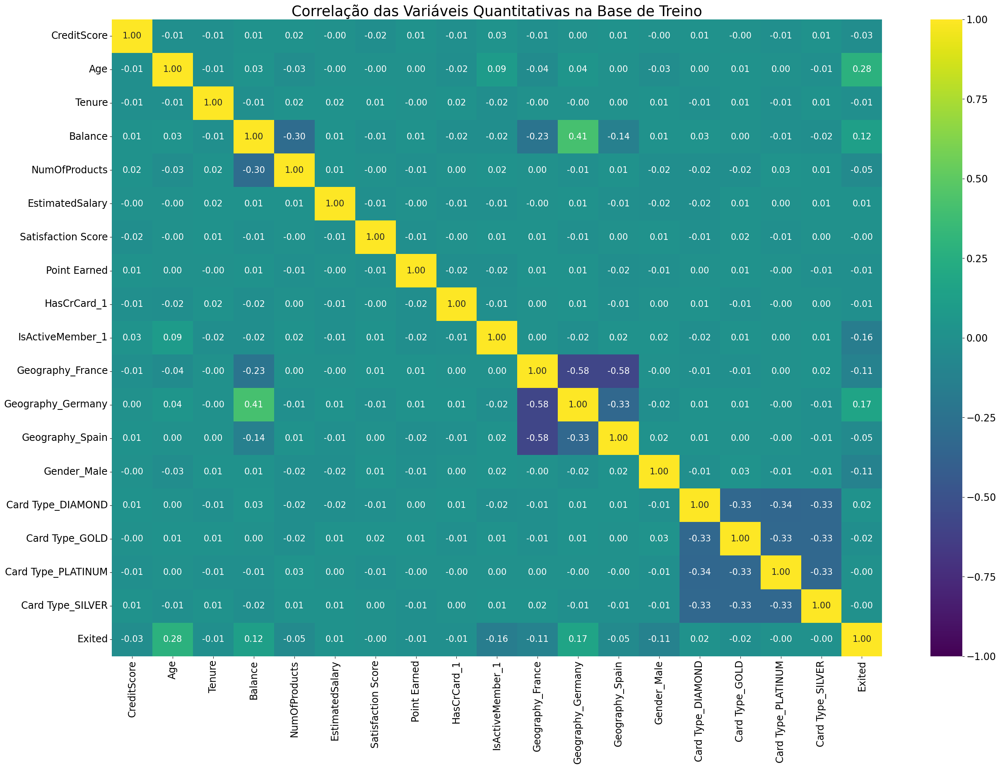

In [50]:
#%% Testando Multicolinearidade na base de treino


teste_multco_treino = pd.concat([X_train,y_train], axis = 1)


correlation_matrix_treino = teste_multco_treino.corr().round(2)
correlation_matrix_treino

# Mapa de calor das variaveis quanti (SEM COMPLAIN)
plt.figure(figsize=(30, 20))
heatmap = sns.heatmap(correlation_matrix_treino, annot=True, fmt=".2f",
                      cmap=plt.cm.viridis,
                      annot_kws={'size': 15}, vmin=-1, vmax=1)
heatmap.set_xticklabels(heatmap.get_xticklabels(), fontsize=17)
heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=17)
plt.title('Correlação das Variáveis Quantitativas na Base de Treino',fontsize=25)
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=17)
plt.show()

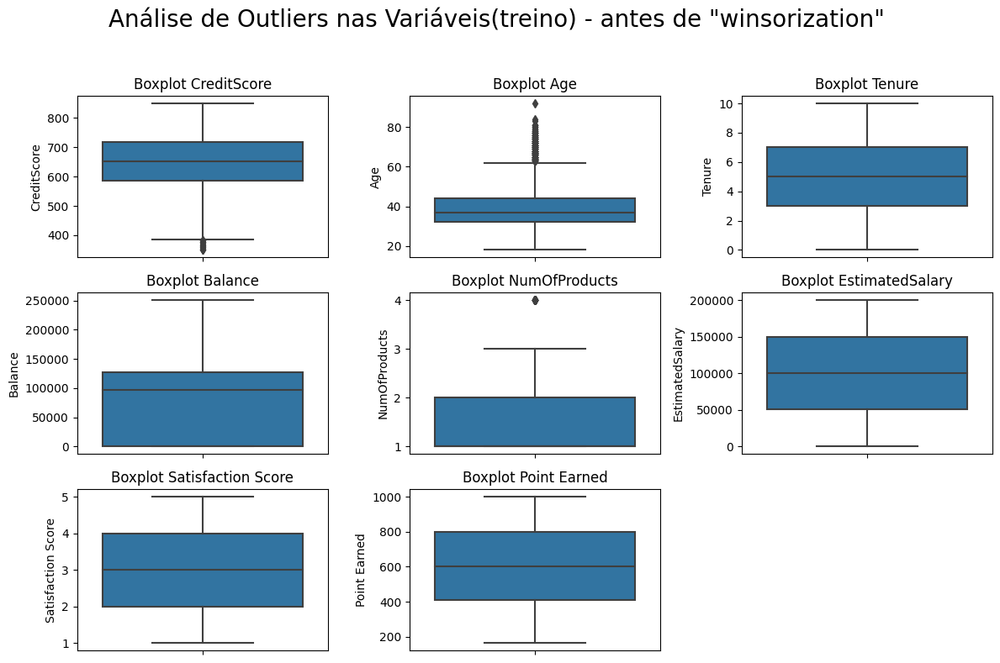

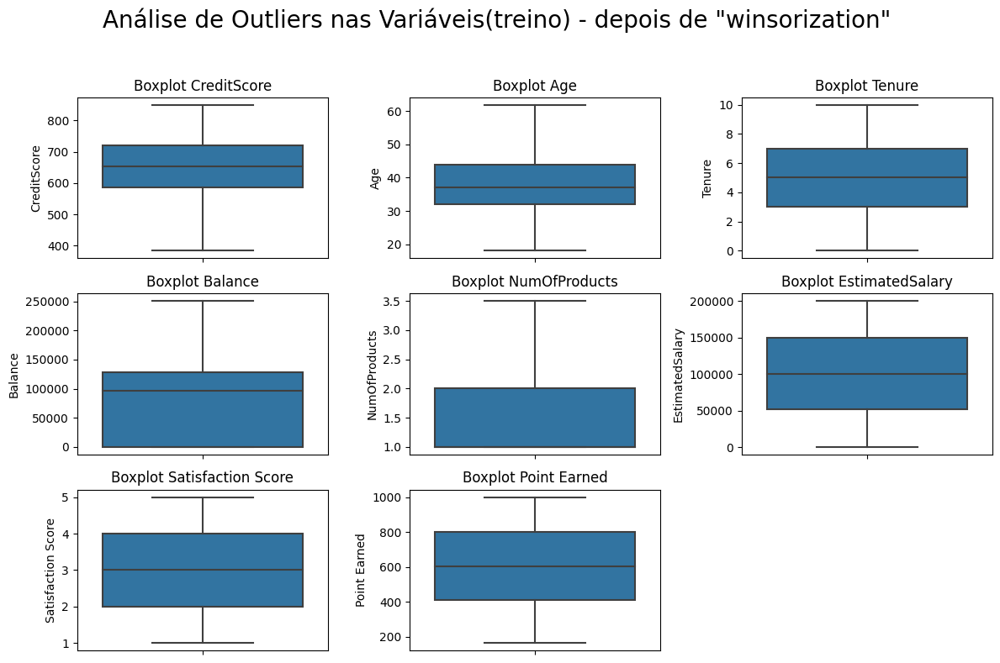

In [51]:
#%% analise de outliers das variaveis na base de treino 


# Criar uma lista com as variáveis de interesse
variaveis = [
    'CreditScore',
    'Age',
    'Tenure',
    'Balance',
    'NumOfProducts',
    'EstimatedSalary',
    'Satisfaction Score',
    'Point Earned'
]

# Criar um subplot
plt.figure(figsize=(12, 8))

# Criar boxplots separados para cada variável
for i, var in enumerate(variaveis):
    plt.subplot(3, 3, i + 1)  # 3 linhas e 3 colunas
    sns.boxplot(y=teste_multco_treino[var])  # Usar o nome da variável diretamente
    plt.title(f'Boxplot {var}', fontsize=12)


# Adicionar título geral
plt.suptitle('Análise de Outliers nas Variáveis(treino) - antes de "winsorization" ', fontsize=20)

# Ajustar layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Ajusta o layout sem sobrepor o título
plt.show()




#aplicando procedimento de truncamento ou winsorization nos outliers
# ---> substitui os outliers pelos valores dos limites inferior e superior dos dados

# Função para tratar outliers
def tratar_outliers(df, coluna):
    Q1 = df[coluna].quantile(0.25)
    Q3 = df[coluna].quantile(0.75)
    IQR = Q3 - Q1
    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR
    
    # Substituir outliers pelo limite
    df[coluna] = np.where(df[coluna] < limite_inferior, limite_inferior, df[coluna])
    df[coluna] = np.where(df[coluna] > limite_superior, limite_superior, df[coluna])

# Aplicando a função nas variáveis desejadas
variaveis_para_tratar = ['Age', 'CreditScore', 'NumOfProducts']

for variavel in variaveis_para_tratar:
    tratar_outliers(teste_multco_treino, variavel)
# Criar um subplot
plt.figure(figsize=(12, 8))

# Criar boxplots separados para cada variável
for i, var in enumerate(variaveis):
    plt.subplot(3, 3, i + 1)  # 3 linhas e 3 colunas
    sns.boxplot(y=teste_multco_treino[var])  # Usar o nome da variável diretamente
    plt.title(f'Boxplot {var}', fontsize=12)

# Adicionar título geral
plt.suptitle('Análise de Outliers nas Variáveis(treino) - depois de "winsorization" ', fontsize=20)

# Ajustar layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Ajusta o layout sem sobrepor o título
plt.show()



In [52]:
#%% Separando novamente as bases de treino e teste depois de tratar os outliers APENAS na base de TREINO  
#treino

X_train=teste_multco_treino.drop('Exited', axis=1)
y_train=teste_multco_treino['Exited']

#teste

base_corrige_teste = pd.concat([X_test,y_test], axis = 1)
X_test=base_corrige_teste.drop('Exited', axis=1)
y_test=base_corrige_teste['Exited']

print('---------------------------------------')
print(X_train.isnull().sum())
print('---------------------------------------')
print(X_train.dtypes)
print('---------------------------------------')
print(y_train.value_counts())
print('---------------------------------------')

---------------------------------------
CreditScore           0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
EstimatedSalary       0
Satisfaction Score    0
Point Earned          0
HasCrCard_1           0
IsActiveMember_1      0
Geography_France      0
Geography_Germany     0
Geography_Spain       0
Gender_Male           0
Card Type_DIAMOND     0
Card Type_GOLD        0
Card Type_PLATINUM    0
Card Type_SILVER      0
dtype: int64
---------------------------------------
CreditScore           float64
Age                   float64
Tenure                  int64
Balance               float64
NumOfProducts         float64
EstimatedSalary       float64
Satisfaction Score      int64
Point Earned            int64
HasCrCard_1             int64
IsActiveMember_1        int64
Geography_France        int64
Geography_Germany       int64
Geography_Spain         int64
Gender_Male             int64
Card Type_DIAMOND       int64
Card Type_GOLD          i

# Modelagem 

* Foram utilizados os modelos Regrassão Logistica, CATboost e XGboost. 

* Foram utilizadas técnicas de cross-validation, undersampling e normalização z-score nos dados. Além de uma separação em 3 cenários de modelos.

* Cenário 1: Modelos com as configurações padrão de hiperparametros;

* Cenário 2: utilizacao do Optuna para encontrar melhores hiperparametros

* Cenário 3: teste de permutation importance para identificar as variaveis mais importantes nos modelos (ja com os hiperparametros encontrados no cenário 2);

* A base de dados foi dividia em seis grupos, onde pode ser formado uma espécie de comissão
de modelos. Foram gerados seis modelos onde cada modelo recebeu uma das partes das
bases divididas (uma para treino e validação e outra para teste), de forma que realizou o
treinamento em 5 e o validação em 1. Logo em seguida o foi realizado o teste na base dedados para teste recebida. 


* A média das probabilidades geradas pelos seis grupos foi considerada como a predição final da
classe de modelo aplicada. A imagem a baixo descreve isso.        |


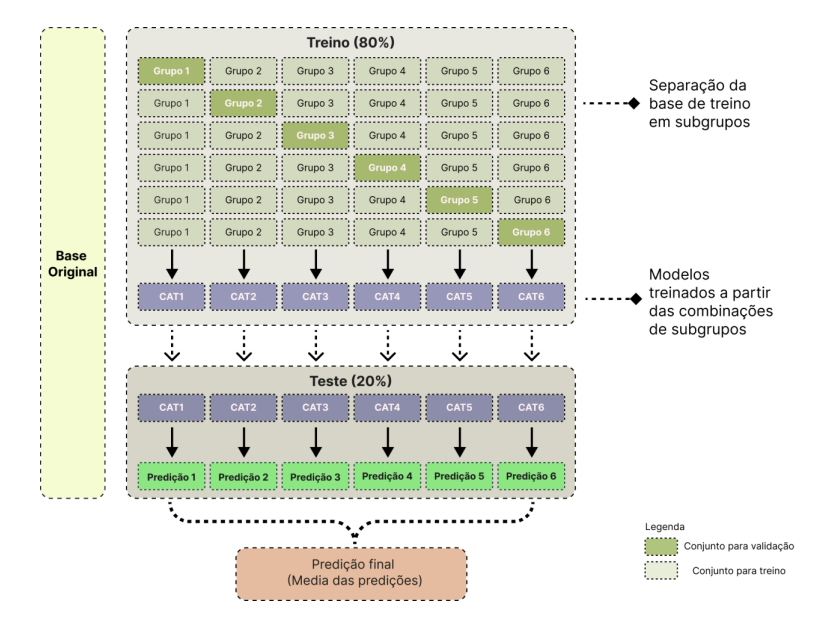

# Cenário 1: Logistico 


Cenário 1:Modelo Logistico
Tempo de Início: 2024-12-16 10:42:25.358534
Métricas OOF para o Modelo Logistico:
ROC AUC: 0.7742
Precisão: 0.7129
Revocação: 0.7003
F1-Score: 0.7065
Acurácia: 0.7091


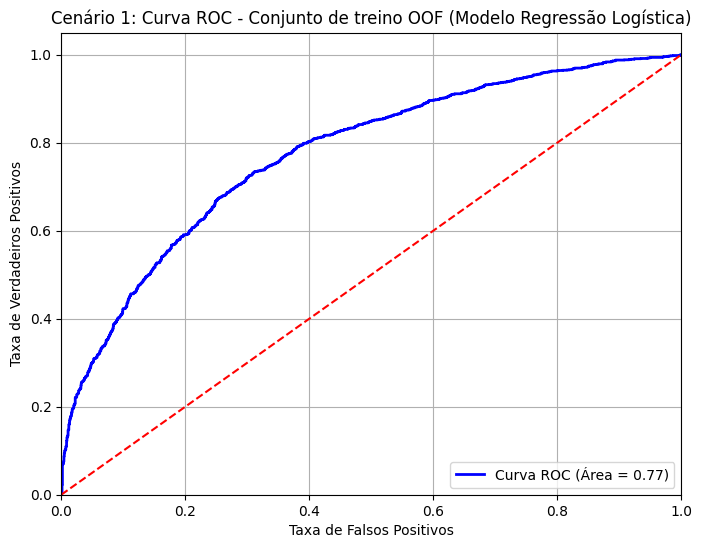


Métricas do Conjunto de Teste para o Modelo Logístico (Cenário 1):
ROC AUC: 0.7821
Precisão: 0.3814
Revocação: 0.7201
F1-Score: 0.4987
Acurácia: 0.7155


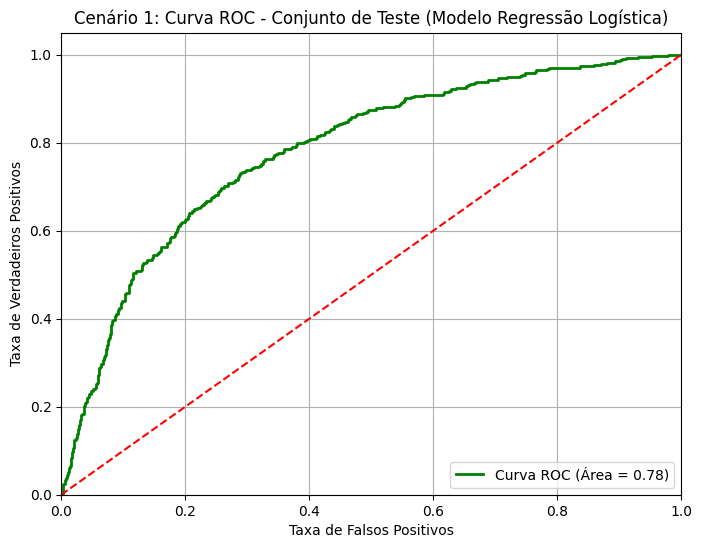

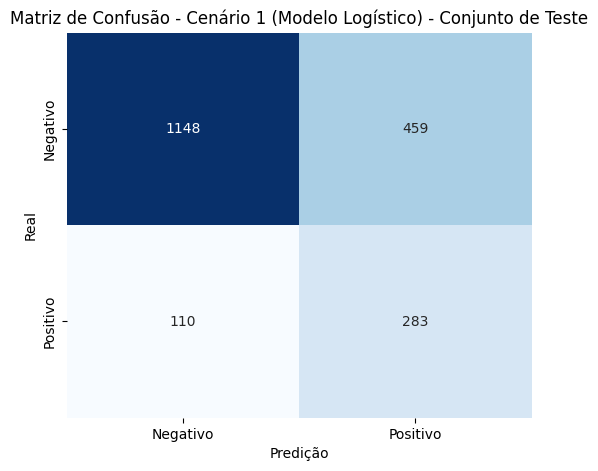

Tempo de Início : 2024-12-16 07:42:25.358534
Tempo de Término: 2024-12-16 07:42:26.195359
Diferença: 00:00


In [65]:
##CENÁRIO 1 - MODELOS COM HIPERPARAMETROS PADRAO 

#%% Modelo logístico binário 
print("Cenário 1:Modelo Logistico")

# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)


# Passo 1: Balancear os Dados com Undersampling
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

# Passo 2: Normalizar os Dados de Treinamento
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Passo 3: Rodar a Validação Cruzada e obter predições OOF
log_reg = LogisticRegression(n_jobs=-1)
kf = StratifiedKFold(n_splits=6, shuffle=True)

# Passo 4: Realizar a validação cruzada para acurácia
cv_results = cross_val_score(log_reg, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')


# Obter as predições OOF
y_pred_oof = cross_val_predict(log_reg, X_balanced_scaled, y_balanced, cv=kf, method='predict_proba')[:, 1]

# Cálculo das métricas no OOF
roc_auc_oof = roc_auc_score(y_balanced, y_pred_oof)
precision_oof = precision_score(y_balanced, (y_pred_oof > 0.5).astype(int))
recall_oof = recall_score(y_balanced, (y_pred_oof > 0.5).astype(int))
f1_oof = f1_score(y_balanced, (y_pred_oof > 0.5).astype(int))
accuracy_oof = accuracy_score(y_balanced, (y_pred_oof > 0.5).astype(int))

# Exibir as métricas OOF
print("Métricas OOF para o Modelo Logistico:")
print(f"ROC AUC: {roc_auc_oof:.4f}")
print(f"Precisão: {precision_oof:.4f}")
print(f"Revocação: {recall_oof:.4f}")
print(f"F1-Score: {f1_oof:.4f}")
print(f"Acurácia: {accuracy_oof:.4f}")


# Calcular e plotar a curva ROC usando o conjunto treino OOF 
fpr_oof_logit_cenario1, tpr_oof_logit_cenario1, thresholds_test_logit_cenario1 = roc_curve(y_balanced, y_pred_oof)
roc_auc_OOF_logit_cenario1 = auc(fpr_oof_logit_cenario1, tpr_oof_logit_cenario1)

# Plotar a curva ROC OOF 
plt.figure(figsize=(8, 6))
plt.plot(fpr_oof_logit_cenario1, tpr_oof_logit_cenario1, color='blue', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_OOF_logit_cenario1))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 1: Curva ROC - Conjunto de treino OOF (Modelo Regressão Logística)')
plt.legend(loc='lower right')
plt.grid()
plt.show()




# Passo 6: Treinar o modelo com os dados balanceados
log_reg.fit(X_balanced_scaled, y_balanced)

# Passo 7: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test = log_reg.predict_proba(X_test_scaled)[:, 1]


# Cálculo das métricas no conjunto de teste
roc_auc_test_cenario1_logit = roc_auc_score(y_test, y_pred_test)
precision_test_cenario1_logit = precision_score(y_test, (y_pred_test > 0.5).astype(int))
recall_test_cenario1_logit = recall_score(y_test, (y_pred_test > 0.5).astype(int))
f1_test_cenario1_logit = f1_score(y_test, (y_pred_test > 0.5).astype(int))
accuracy_test_cenario1_logit = accuracy_score(y_test, (y_pred_test > 0.5).astype(int))

# Exibir as métricas do conjunto de teste
print("\nMétricas do Conjunto de Teste para o Modelo Logístico (Cenário 1):")
print(f"ROC AUC: {roc_auc_test_cenario1_logit:.4f}")
print(f"Precisão: {precision_test_cenario1_logit:.4f}")
print(f"Revocação: {recall_test_cenario1_logit:.4f}")
print(f"F1-Score: {f1_test_cenario1_logit:.4f}")
print(f"Acurácia: {accuracy_test_cenario1_logit:.4f}")

# Cálculo da Matriz de Confusão
conf_matrix_test = confusion_matrix(y_test, (y_pred_test > 0.5).astype(int))


# Passo 8: Calcular e plotar a curva ROC usando o conjunto de teste
fpr_test_logit_cenario1, tpr_test_logit_cenario1, thresholds_test_logit_cenario1 = roc_curve(y_test, y_pred_test)
roc_auc_test_logit_cenario1 = auc(fpr_test_logit_cenario1, tpr_test_logit_cenario1)

# Passo 9: Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_logit_cenario1, tpr_test_logit_cenario1, color='green', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_test_logit_cenario1))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 1: Curva ROC - Conjunto de Teste (Modelo Regressão Logística)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 1 (Modelo Logístico) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()




#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

# Cenário 1: XGboost

Cenário 1:Modelo XGboost
Tempo de Início: 2024-12-16 10:42:26.216123
Métricas OOF para o Modelo XGBoost:
ROC AUC: 0.8411
Precisão: 0.7699
Revocação: 0.7526
F1-Score: 0.7611
Acurácia: 0.7638


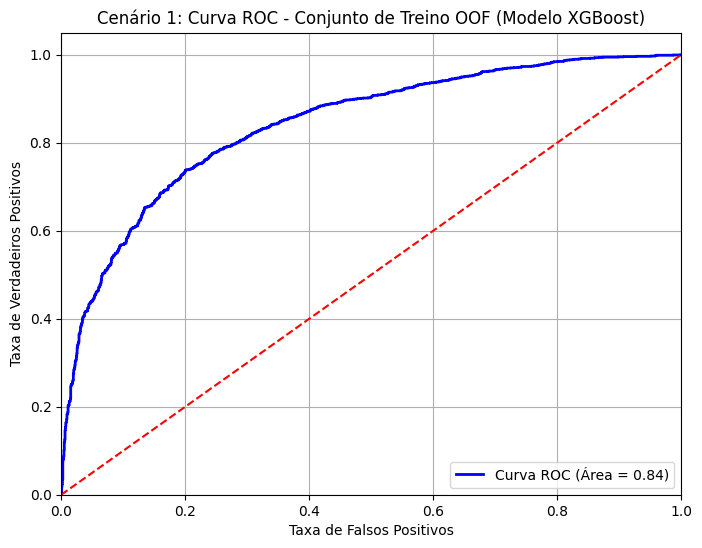


Métricas do Conjunto de Teste para o Modelo XGBoost (Cenário 1):
ROC AUC: 0.8394
Precisão: 0.4618
Revocação: 0.7684
F1-Score: 0.5769
Acurácia: 0.7785


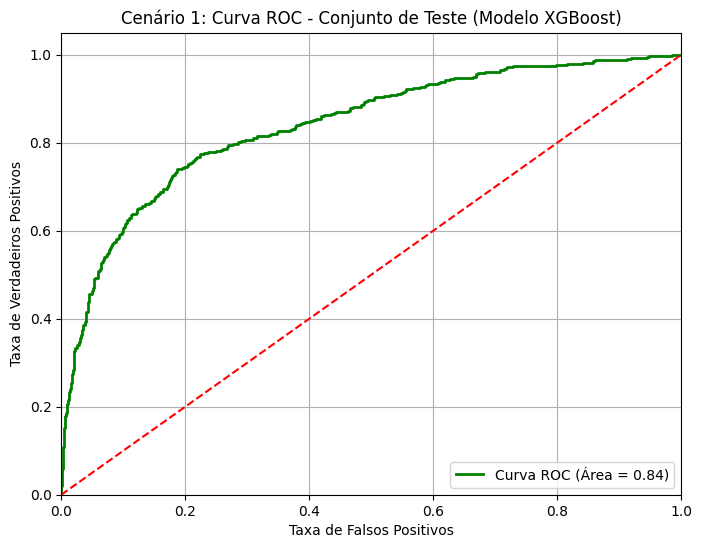

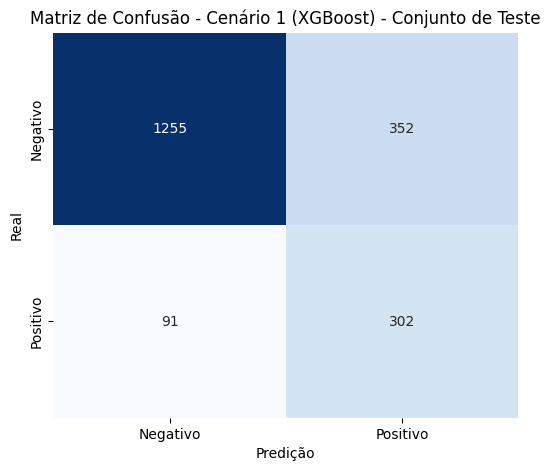

Tempo de Início : 2024-12-16 07:42:26.216123
Tempo de Término: 2024-12-16 07:42:29.254029
Diferença: 00:00


In [66]:
#%% Modelo XGBoost 
print("Cenário 1:Modelo XGboost")
# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)



# Passo 1: Balancear os Dados com Undersampling
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

# Passo 2: Normalizar os Dados de Treinamento
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Passo 3: Rodar a Validação Cruzada e obter predições OOF para o modelo XGBoost
xgb_model = xgb.XGBClassifier(eval_metric='logloss',tree_method='hist',device='cuda',n_jobs=-1)  # Inicializa o modelo XGBoost
kf = StratifiedKFold(n_splits=6, shuffle=True)

# Passo 4: Realizar a validação cruzada para acurácia do modelo XGBoost
cv_results_xgb = cross_val_score(xgb_model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')

# Obter as predições OOF
y_pred_oof_xgb = cross_val_predict(xgb_model, X_balanced_scaled, y_balanced, cv=kf, method='predict_proba')[:, 1]

# Cálculo das métricas no OOF para o modelo XGBoost
roc_auc_oof_xgb = roc_auc_score(y_balanced, y_pred_oof_xgb)
precision_oof_xgb = precision_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
recall_oof_xgb = recall_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
f1_oof_xgb = f1_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
accuracy_oof_xgb = accuracy_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))

# Exibir as métricas OOF para o modelo XGBoost
print("Métricas OOF para o Modelo XGBoost:")
print(f"ROC AUC: {roc_auc_oof_xgb:.4f}")
print(f"Precisão: {precision_oof_xgb:.4f}")
print(f"Revocação: {recall_oof_xgb:.4f}")
print(f"F1-Score: {f1_oof_xgb:.4f}")
print(f"Acurácia: {accuracy_oof_xgb:.4f}")


# Calcular e plotar a curva ROC usando o conjunto de Treino OOF para o modelo XGBoost
fpr_OOF_xgb_cenario1, tpr_OOF_xgb_cenario1, thresholds_test_xgb_cenario1 = roc_curve(y_balanced, y_pred_oof_xgb)
roc_auc_OOF_xgb_cenario1 = auc(fpr_OOF_xgb_cenario1, tpr_OOF_xgb_cenario1)

# Plotar a curva ROC para o modelo XGBoost na base de treino OOF
plt.figure(figsize=(8, 6))
plt.plot(fpr_OOF_xgb_cenario1, tpr_OOF_xgb_cenario1, color='blue', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_OOF_xgb_cenario1))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 1: Curva ROC - Conjunto de Treino OOF (Modelo XGBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Passo 6: Treinar o modelo XGBoost com os dados balanceados
xgb_model.fit(X_balanced_scaled, y_balanced)

# Passo 7: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test_xgb = xgb_model.predict_proba(X_test_scaled)[:, 1]

# Cálculo das métricas no conjunto de teste para o modelo XGBoost
roc_auc_test_cenario1_xgb = roc_auc_score(y_test, y_pred_test_xgb)
precision_test_cenario1_xgb = precision_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
recall_test_cenario1_xgb = recall_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
f1_test_cenario1_xgb = f1_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
accuracy_test_cenario1_xgb = accuracy_score(y_test, (y_pred_test_xgb > 0.5).astype(int))

# Exibir as métricas do conjunto de teste para o modelo XGBoost
print("\nMétricas do Conjunto de Teste para o Modelo XGBoost (Cenário 1):")
print(f"ROC AUC: {roc_auc_test_cenario1_xgb:.4f}")
print(f"Precisão: {precision_test_cenario1_xgb:.4f}")
print(f"Revocação: {recall_test_cenario1_xgb:.4f}")
print(f"F1-Score: {f1_test_cenario1_xgb:.4f}")
print(f"Acurácia: {accuracy_test_cenario1_xgb:.4f}")

# Cálculo da Matriz de Confusão
conf_matrix_test_xgb = confusion_matrix(y_test, (y_pred_test_xgb > 0.5).astype(int))


# Passo 8: Calcular e plotar a curva ROC usando o conjunto de teste para o modelo XGBoost
fpr_test_xgb_cenario1, tpr_test_xgb_cenario1, thresholds_test_xgb_cenario1 = roc_curve(y_test, y_pred_test_xgb)
roc_auc_test_xgb_cenario1 = auc(fpr_test_xgb_cenario1, tpr_test_xgb_cenario1)

# Passo 9: Plotar a curva ROC para o modelo XGBoost
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_xgb_cenario1, tpr_test_xgb_cenario1, color='green', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_test_xgb_cenario1))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 1: Curva ROC - Conjunto de Teste (Modelo XGBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_xgb, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 1 (XGBoost) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()




#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Calculando horas e minutos
total_minutes = divmod(time_difference.total_seconds(), 60)
hours, minutes = divmod(total_minutes[0], 60)

# Exibindo no formato horas:minutos
print(f"Diferença: {int(hours):02}:{int(minutes):02}")

# Cenário 1: Catboost


Cenário 1:Modelo CATboost
Tempo de Início: 2024-12-16 10:42:29.278059
Métricas OOF para o Modelo CatBoost:
ROC AUC: 0.8656
Precisão: 0.7883
Revocação: 0.7605
F1-Score: 0.7741
Acurácia: 0.7781


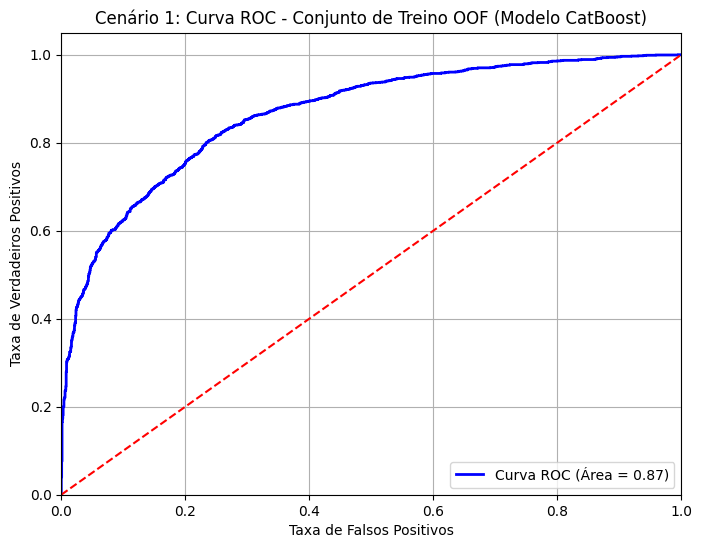


Métricas do Conjunto de Teste para o Modelo CatBoost (Cenário 1):
ROC AUC: 0.8664
Precisão: 0.4960
Revocação: 0.7913
F1-Score: 0.6098
Acurácia: 0.8010


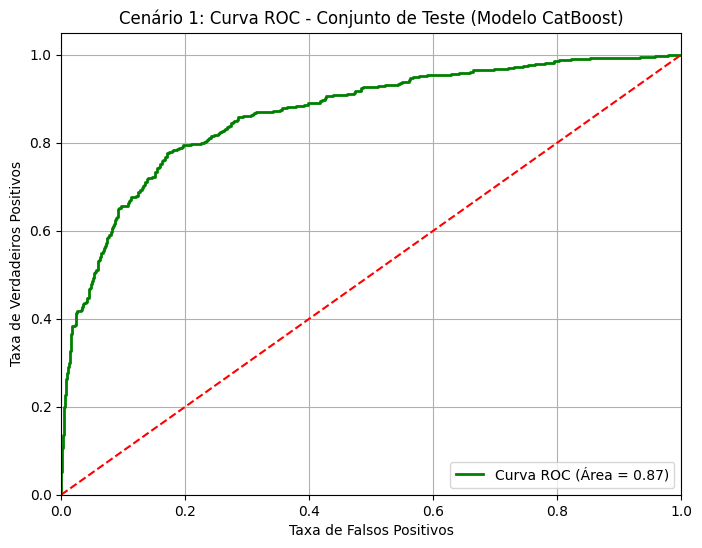

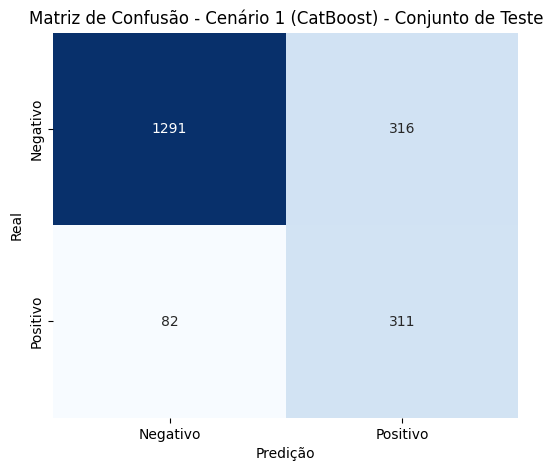

Tempo de Início : 2024-12-16 07:42:29.278059
Tempo de Término: 2024-12-16 07:48:05.905784
Diferença: 00:05


In [67]:
#%% Modelo CatBoost
print("Cenário 1:Modelo CATboost")

# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)



# Passo 1: Balancear os Dados com Undersampling
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

# Passo 2: Normalizar os Dados de Treinamento
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Passo 3: Rodar a Validação Cruzada e obter predições OOF para o modelo CatBoost
catboost_model = CatBoostClassifier(verbose=0,task_type='GPU',thread_count=-1)  # Inicializa o modelo CatBoost
kf = StratifiedKFold(n_splits=6, shuffle=True)

# Passo 4: Realizar a validação cruzada para acurácia do modelo CatBoost
cv_results_catboost = cross_val_score(catboost_model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')

# Obter as predições OOF
y_pred_oof_catboost = cross_val_predict(catboost_model, X_balanced_scaled, y_balanced, cv=kf, method='predict_proba')[:, 1]

# Cálculo das métricas no OOF para o modelo CatBoost
roc_auc_oof_catboost = roc_auc_score(y_balanced, y_pred_oof_catboost)
precision_oof_catboost = precision_score(y_balanced, (y_pred_oof_catboost > 0.5).astype(int))
recall_oof_catboost = recall_score(y_balanced, (y_pred_oof_catboost > 0.5).astype(int))
f1_oof_catboost = f1_score(y_balanced, (y_pred_oof_catboost > 0.5).astype(int))
accuracy_oof_catboost = accuracy_score(y_balanced, (y_pred_oof_catboost > 0.5).astype(int))

# Exibir as métricas OOF para o modelo CatBoost
print("Métricas OOF para o Modelo CatBoost:")
print(f"ROC AUC: {roc_auc_oof_catboost:.4f}")
print(f"Precisão: {precision_oof_catboost:.4f}")
print(f"Revocação: {recall_oof_catboost:.4f}")
print(f"F1-Score: {f1_oof_catboost:.4f}")
print(f"Acurácia: {accuracy_oof_catboost:.4f}")


# Calcular e plotar a curva ROC usando o conjunto de treino OOF para o modelo CatBoost
fpr_OOF_catboost_cenario1, tpr_OOF_catboost_cenario1, thresholds_OOF_catboost_cenario1 = roc_curve(y_balanced, y_pred_oof_catboost)
roc_auc_OOF_catboos_cenario1 = auc(fpr_OOF_catboost_cenario1, tpr_OOF_catboost_cenario1)

#Plotar a curva ROC para o modelo CatBoost na base de treino OOF 
plt.figure(figsize=(8, 6))
plt.plot(fpr_OOF_catboost_cenario1, tpr_OOF_catboost_cenario1, color='blue', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_OOF_catboos_cenario1))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 1: Curva ROC - Conjunto de Treino OOF (Modelo CatBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()






# Passo 6: Treinar o modelo CatBoost com os dados balanceados
catboost_model.fit(X_balanced_scaled, y_balanced)

# Passo 7: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test_catboost = catboost_model.predict_proba(X_test_scaled)[:, 1]

# Cálculo das métricas no conjunto de teste para o modelo CatBoost
roc_auc_test_cenario1_cat = roc_auc_score(y_test, y_pred_test_catboost)
precision_test_cenario1_cat = precision_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
recall_test_cenario1_cat = recall_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
f1_test_cenario1_cat = f1_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
accuracy_test_cenario1_cat = accuracy_score(y_test, (y_pred_test_catboost > 0.5).astype(int))

# Exibir as métricas do conjunto de teste para o modelo CatBoost
print("\nMétricas do Conjunto de Teste para o Modelo CatBoost (Cenário 1):")
print(f"ROC AUC: {roc_auc_test_cenario1_cat:.4f}")
print(f"Precisão: {precision_test_cenario1_cat:.4f}")
print(f"Revocação: {recall_test_cenario1_cat:.4f}")
print(f"F1-Score: {f1_test_cenario1_cat:.4f}")
print(f"Acurácia: {accuracy_test_cenario1_cat:.4f}")

# Cálculo da Matriz de Confusão
conf_matrix_test_cat = confusion_matrix(y_test, (y_pred_test_catboost > 0.5).astype(int))

# Passo 8: Calcular e plotar a curva ROC usando o conjunto de teste para o modelo CatBoost
fpr_test_catboost_cenario1, tpr_test_catboost_cenario1, thresholds_test_catboost_cenario1 = roc_curve(y_test, y_pred_test_catboost)
roc_auc_test_catboost_cenario1 = auc(fpr_test_catboost_cenario1, tpr_test_catboost_cenario1)

# Passo 9: Plotar a curva ROC para o modelo CatBoost
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_catboost_cenario1, tpr_test_catboost_cenario1, color='green', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_test_catboost_cenario1))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 1: Curva ROC - Conjunto de Teste (Modelo CatBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cat, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 1 (CatBoost) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()



#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

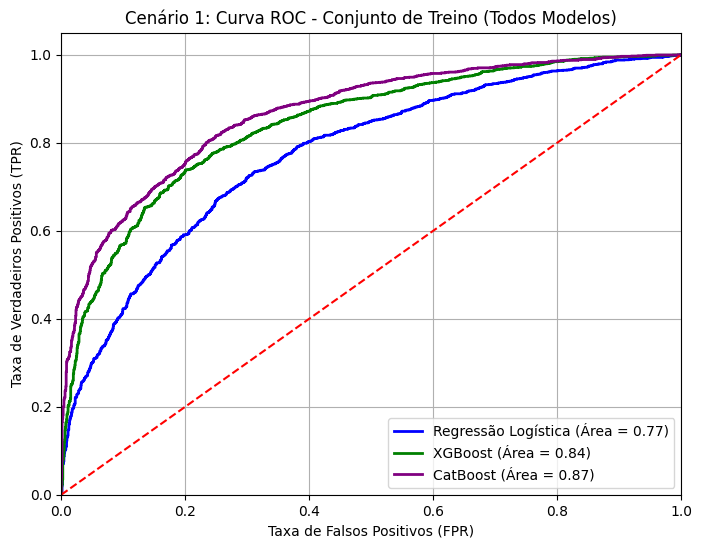

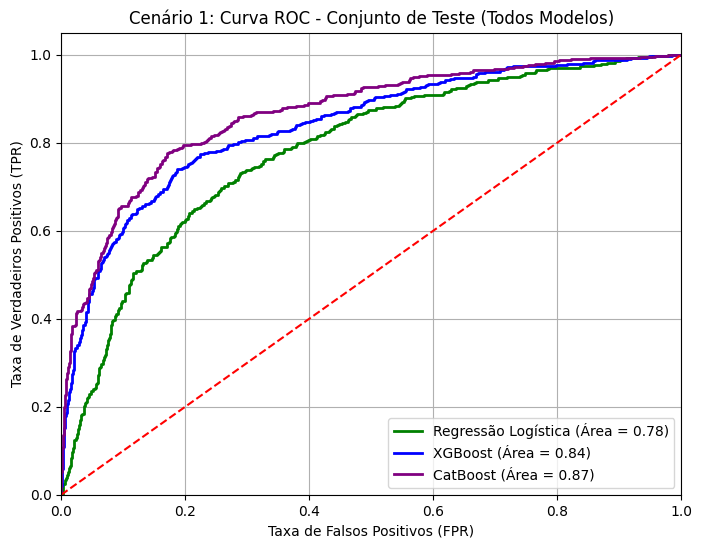

In [68]:
#%% graficos do cenario 1 
# Plotar as curvas ROC de TREINO  dos modelos 

plt.figure(figsize=(8, 6))

# Curva ROC para Regressão Logística
plt.plot(fpr_oof_logit_cenario1, tpr_oof_logit_cenario1, color='blue', lw=2, label='Regressão Logística (Área = {:.2f})'.format(roc_auc_OOF_logit_cenario1))

# Curva ROC para XGBoost
plt.plot(fpr_OOF_xgb_cenario1, tpr_OOF_xgb_cenario1, color='green', lw=2, label='XGBoost (Área = {:.2f})'.format(roc_auc_OOF_xgb_cenario1))

# Curva ROC para CatBoost
plt.plot(fpr_OOF_catboost_cenario1, tpr_OOF_catboost_cenario1, color='purple', lw=2, label='CatBoost (Área = {:.2f})'.format(roc_auc_OOF_catboos_cenario1))

# Linha diagonal (linha de aleatoriedade)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  

# Configurações do gráfico
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos (FPR)')  # FPR = False Positive Rate
plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')  # TPR = True Positive Rate
plt.title('Cenário 1: Curva ROC - Conjunto de Treino (Todos Modelos)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Plotar as curvas ROC de TESTE dos modelos 

plt.figure(figsize=(8, 6))

# Curva ROC para Regressão Logística
plt.plot(fpr_test_logit_cenario1, tpr_test_logit_cenario1, color='green', lw=2, label='Regressão Logística (Área = {:.2f})'.format(roc_auc_test_logit_cenario1))

# Curva ROC para XGBoost
plt.plot(fpr_test_xgb_cenario1, tpr_test_xgb_cenario1, color='blue', lw=2, label='XGBoost (Área = {:.2f})'.format(roc_auc_test_xgb_cenario1))

# Curva ROC para CatBoost
plt.plot(fpr_test_catboost_cenario1, tpr_test_catboost_cenario1, color='purple', lw=2, label='CatBoost (Área = {:.2f})'.format(roc_auc_test_catboost_cenario1))

# Linha diagonal (desempenho aleatório)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')

# Ajustes de eixos
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

# Labels e título
plt.xlabel('Taxa de Falsos Positivos (FPR)')  # FPR = False Positive Rate
plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')  # TPR = True Positive Rate
plt.title('Cenário 1: Curva ROC - Conjunto de Teste (Todos Modelos)')

# Legenda
plt.legend(loc='lower right')

# Grid
plt.grid()

# Mostrar o gráfico
plt.show()

# Cenário 2: Logistico

Cenário 2:Modelo Logistico
Tempo de Início: 2024-12-16 16:34:27.975403
Melhores parâmetros encontrados: {'C': 0.27986311066258024, 'penalty': None, 'solver': 'saga'}

AUC por fold: [0.69402985 0.6953271  0.70143885 0.68022181 0.7443609  0.70780399]
Média da AUC: 0.7039

Métricas do Conjunto de Treino (validação cruzada) para o Modelo Logístico:
ROC AUC: 0.7802
Acurácia: 0.7128
Precisão: 0.7160
Recall: 0.7052
F1 Score: 0.7106
Matriz de Confusão:
[[1185  460]
 [ 485 1160]]

Métricas do Conjunto de Teste para o Modelo Logístico (Cenário 2):
ROC AUC: 0.7823
Acurácia: 0.7240
Precisão: 0.3918
Recall: 0.7328
F1 Score: 0.5106
Matriz de Confusão:
[[1160  447]
 [ 105  288]]


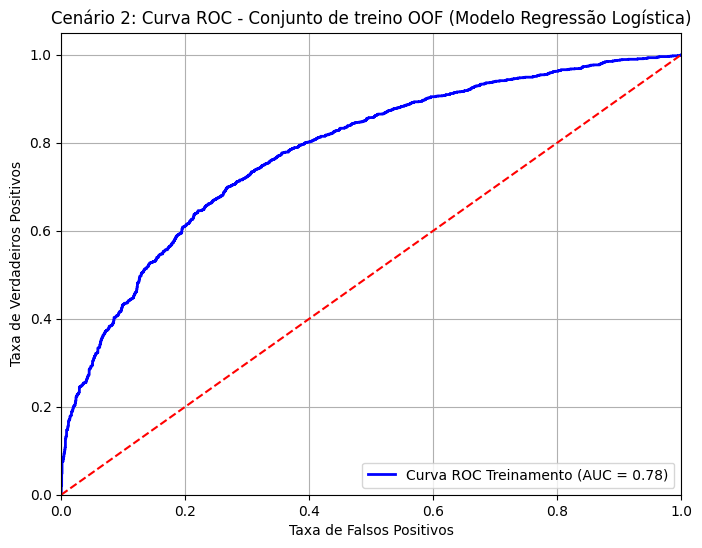

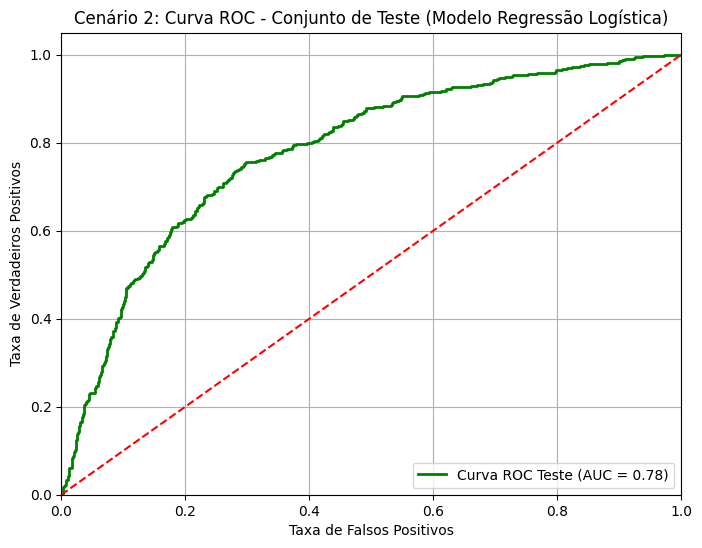

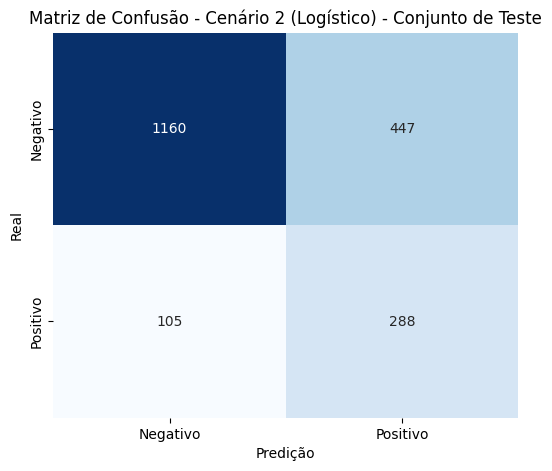

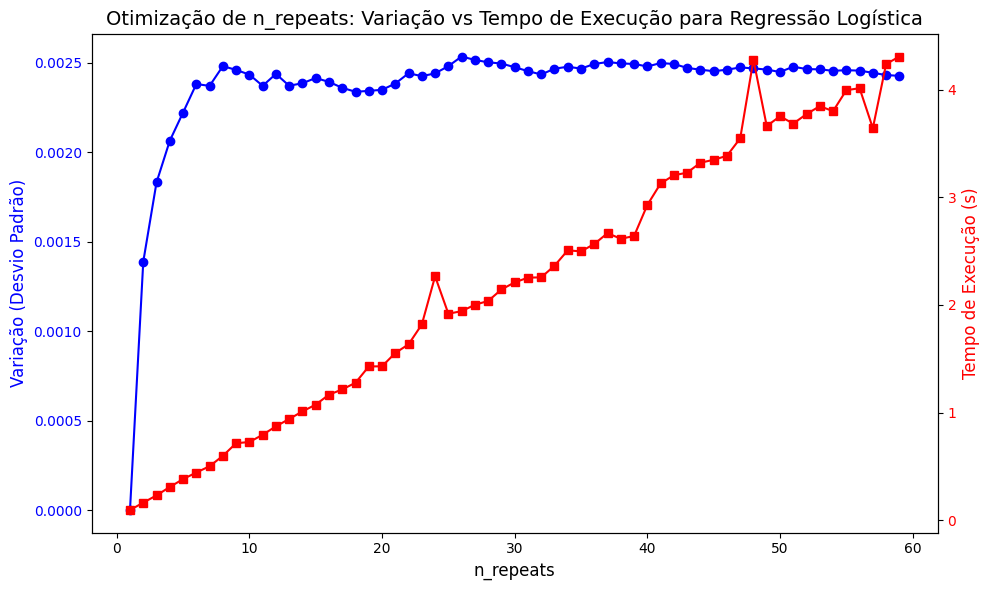

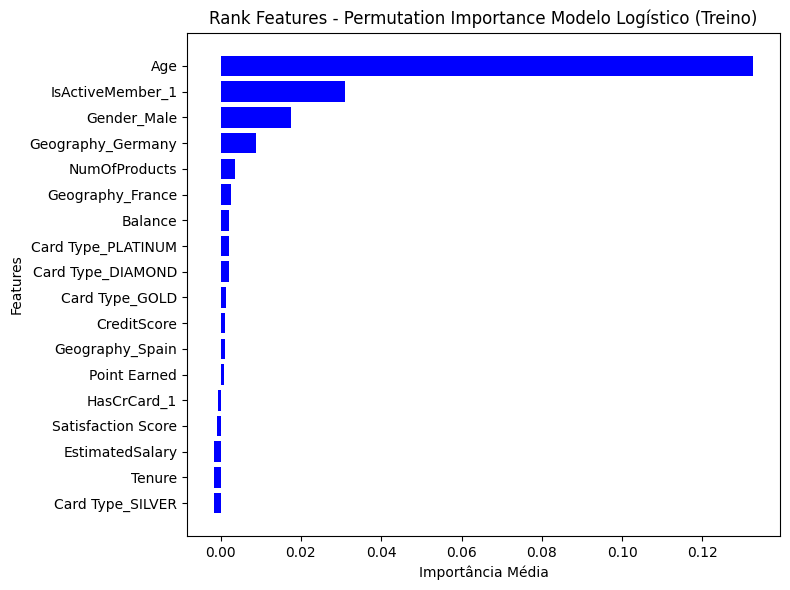

Importância das Features no Conjunto de Teste:
[ 0.00131495  0.16279226  0.00140985  0.01441374  0.01015119  0.00370355
  0.00115825  0.00213597  0.00237321  0.03529034  0.01039723  0.016821
  0.00708299  0.02536585  0.00478225 -0.00274217  0.00269074  0.00158834]


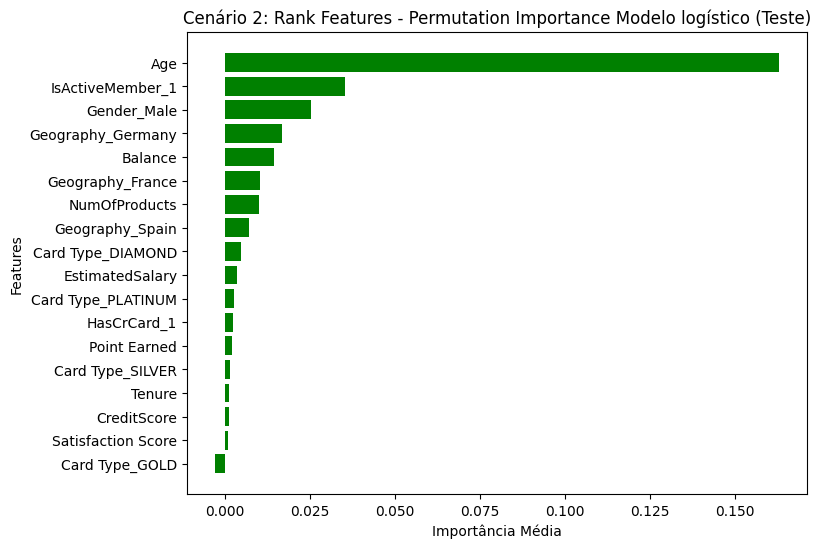

Tempo de Início : 2024-12-16 13:34:27.975403
Tempo de Término: 2024-12-16 13:37:00.792911
Diferença: 00:02


In [24]:
##CENÁRIO 2 - MODELOS COM HIPERPARAMETROS MAXIMIZADOS PELO OPTUNA

# === Configurações de log do Optuna ===
# Use apenas uma das opções abaixo, descomentando a desejada:

# 1. Mostrar apenas mensagens críticas (mensagens essenciais como erros graves)
optuna.logging.set_verbosity(optuna.logging.CRITICAL)

# 2. Mostrar apenas erros
# optuna.logging.set_verbosity(optuna.logging.ERROR)

# 3. Mostrar apenas avisos (oculta mensagens informativas)
# optuna.logging.set_verbosity(optuna.logging.WARNING)

# 4. Mostrar todas as mensagens informativas (comportamento padrão)
# optuna.logging.set_verbosity(optuna.logging.INFO)

# 5. Mostrar mensagens detalhadas para depuração
# optuna.logging.set_verbosity(optuna.logging.DEBUG)

# === Suprimir todos os warnings === (isso é para deixar o notebook mais limpo, vale tirar quando desejar 
                                    #fazer qualquer diagnostico, aqui sei que esta tudo ok por enquanto ])
warnings.filterwarnings("ignore")

# === Redirecionar saída padrão e erros para evitar mensagens adicionais ===
f = open(os.devnull, 'w')
os.dup2(f.fileno(), 1)  # Redireciona stdout (saída padrão)
os.dup2(f.fileno(), 2)  # Redireciona stderr (saída de erros)



#%% Modelo logístico binário 
print("Cenário 2:Modelo Logistico")

# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)


# Função de objetivo para otimizar os parâmetros da regressão logística
def objective(trial):
    max_attempts = 10  # Número máximo de tentativas
    attempt = 0  # Contador de tentativas

    while attempt < max_attempts:
        try:
            # Passo 1: Balancear os Dados com Undersampling
            undersampler = RandomUnderSampler()
            X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

            # Passo 2: Normalizar os Dados de Treinamento
            scaler = StandardScaler()
            X_balanced_scaled = scaler.fit_transform(X_balanced)

            # Passo 3: Definir os parâmetros a serem otimizados
            C = trial.suggest_loguniform('C', 1e-5, 1e2)  # Regularização
            penalty = trial.suggest_categorical('penalty', ['l1', 'l2', 'elasticnet', None])  # Penalização
            solver = trial.suggest_categorical('solver', ['liblinear', 'saga', 'lbfgs'])  # Solver

            # Ajustar o solver caso a penalização seja 'elasticnet'
            if penalty == 'elasticnet':
                solver = 'saga'  # Forçar o uso do solver 'saga' se a penalização for 'elasticnet'

            # Ajustar para o caso do solver 'liblinear' (não permite penalty=None)
            if solver == 'liblinear' and penalty is None:
                penalty = 'l2'  # Forçar penalização L2 se for 'liblinear'

            # Ajustar para o caso do solver 'lbfgs' (não permite penalty='l1')
            if solver == 'lbfgs' and penalty == 'l1':
                penalty = 'l2'  # Forçar penalização L2 se for 'lbfgs'

            # Definir o valor de l1_ratio para elasticnet
            if penalty == 'elasticnet':
                l1_ratio = trial.suggest_uniform('l1_ratio', 0, 1)  # Novo parâmetro l1_ratio
            else:
                l1_ratio = None  # Não é necessário para L1 ou L2

            # Configurar o modelo com os parâmetros sugeridos
            log_reg = LogisticRegression(C=C, penalty=penalty, solver=solver, l1_ratio=l1_ratio,n_jobs=-1)

            # Validar o modelo usando validação cruzada estratificada
            kf = StratifiedKFold(n_splits=6, shuffle=True)
            cv_results = cross_val_score(log_reg, X_balanced_scaled, y_balanced, cv=kf, scoring='f1', error_score='raise')

            return cv_results.mean()  # Maximizar o AUC

        except Exception as e:
            attempt += 1  # Incrementa o contador de tentativas
            print(f"Erro durante a execução da tentativa: {e}")
            print(f"Tentativa {attempt}/{max_attempts} com os seguintes parâmetros:")
            print(f"Solver: {solver}, Penalty: {penalty}, C: {C}, l1_ratio: {l1_ratio}")

            # Se atingiu o máximo de tentativas, levantar erro e interromper
            if attempt == max_attempts:
                raise RuntimeError(f"Tentativas máximas alcançadas para o modelo: Logistic Regression")

            # Caso contrário, continuar tentando

    # Se não houver erro após o loop, significa que o modelo foi treinado com sucesso
    print(f"Modelo treinado com sucesso após {attempt} tentativas.")




# Passo 4: Criar o estudo Optuna e otimizar os hiperparâmetros
study = optuna.create_study(direction='maximize')  # Maximizar AUC
study.optimize(objective, n_trials=50)  # Executar 20 tentativas

# Exibir os melhores parâmetros
best_params = study.best_params
print(f"Melhores parâmetros encontrados: {best_params}")

# Passo 5: Treinar o modelo final com os melhores parâmetros
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Criar o modelo com os melhores parâmetros obtidos
log_reg = LogisticRegression(C=best_params['C'], penalty=best_params['penalty'], solver=best_params['solver'],n_jobs=-1,
                             l1_ratio=best_params.get('l1_ratio', None))

# Passo 6: Validar o modelo com os dados balanceados usando AUC
kf = StratifiedKFold(n_splits=6, shuffle=True)
cv_results = cross_val_score(log_reg, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')

# Exibir os resultados da validação cruzada (AUC)
print(f'\nAUC por fold: {cv_results}')
print(f'Média da AUC: {cv_results.mean():.4f}')

# Passo 7: Treinar o modelo com os dados balanceados e melhores parâmetros
log_reg.fit(X_balanced_scaled, y_balanced)

# Passo 8: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test = log_reg.predict_proba(X_test_scaled)[:, 1]

# Passo 9: Calcular as métricas no conjunto de treino (validação cruzada OOF)
y_pred_train_oof = log_reg.predict_proba(X_balanced_scaled)[:, 1]
roc_auc_train = roc_auc_score(y_balanced, y_pred_train_oof)
accuracy_train = accuracy_score(y_balanced, log_reg.predict(X_balanced_scaled))
precision_train = precision_score(y_balanced, log_reg.predict(X_balanced_scaled))
recall_train = recall_score(y_balanced, log_reg.predict(X_balanced_scaled))
f1_train = f1_score(y_balanced, log_reg.predict(X_balanced_scaled))
conf_matrix_train = confusion_matrix(y_balanced, log_reg.predict(X_balanced_scaled))

# Exibir as métricas no conjunto de treino (validação cruzada OOF)
print("\nMétricas do Conjunto de Treino (validação cruzada) para o Modelo Logístico:")
print(f"ROC AUC: {roc_auc_train:.4f}")
print(f"Acurácia: {accuracy_train:.4f}")
print(f"Precisão: {precision_train:.4f}")
print(f"Recall: {recall_train:.4f}")
print(f"F1 Score: {f1_train:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_train)

# Passo 10: Calcular as métricas no conjunto de teste
roc_auc_test_cenario2_logit = roc_auc_score(y_test, y_pred_test)
accuracy_test_cenario2_logit = accuracy_score(y_test, log_reg.predict(X_test_scaled))
precision_test_cenario2_logit = precision_score(y_test, log_reg.predict(X_test_scaled))
recall_test_cenario2_logit = recall_score(y_test, log_reg.predict(X_test_scaled))
f1_test_cenario2_logit = f1_score(y_test, log_reg.predict(X_test_scaled))
conf_matrix_test_cenario2_logit = confusion_matrix(y_test, log_reg.predict(X_test_scaled))

# Exibir as métricas no conjunto de teste
print("\nMétricas do Conjunto de Teste para o Modelo Logístico (Cenário 2):")
print(f"ROC AUC: {roc_auc_test_cenario2_logit:.4f}")
print(f"Acurácia: {accuracy_test_cenario2_logit:.4f}")
print(f"Precisão: {precision_test_cenario2_logit:.4f}")
print(f"Recall: {recall_test_cenario2_logit:.4f}")
print(f"F1 Score: {f1_test_cenario2_logit:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_test_cenario2_logit)



# Passo 11: Calcular a curva ROC para o treinamento (validação cruzada OOF)
fpr_train, tpr_train, _ = roc_curve(y_balanced, y_pred_train_oof)
roc_auc_train = auc(fpr_train, tpr_train)

# Passo 12: Calcular a curva ROC para o teste
fpr_test_cenario2_logit, tpr_test_cenario2_logit, _ = roc_curve(y_test, y_pred_test)
roc_auc_test_cenario2_logit = auc(fpr_test_cenario2_logit, tpr_test_cenario2_logit)

# Passo 13: Plotar a curva ROC para o treinamento (OOF)
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Curva ROC Treinamento (AUC = {:.2f})'.format(roc_auc_train))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 2: Curva ROC - Conjunto de treino OOF (Modelo Regressão Logística)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Passo 14: Plotar a curva ROC para o teste
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_cenario2_logit, tpr_test_cenario2_logit, color='green', lw=2, label='Curva ROC Teste (AUC = {:.2f})'.format(roc_auc_test_cenario2_logit))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 2: Curva ROC - Conjunto de Teste (Modelo Regressão Logística)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cenario2_logit, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 2 (Logístico) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()  # Exibir o gráfico sem salvar a imagem




#######PERMUTATION IMPORTANCE#####################

# Permutation Importance no Conjunto de Treino

#permutation_train = permutation_importance(log_reg, X_balanced_scaled, y_balanced, n_repeats=500, random_state=42, scoring=make_scorer(f1_score))
#importances_train = permutation_train.importances_mean
#print("Importância das Features no Conjunto de Treino:")
#print(importances_train)

# Obter as 5 features mais importantes no treino
#sorted_idx_train = np.argsort(importances_train)[-20:]
#top_features_train = X_test.columns[sorted_idx_train]

# Plotar o gráfico de barra lateral para o conjunto de treino
#plt.figure(figsize=(8, 6))
#plt.barh(top_features_train, importances_train[sorted_idx_train], color='blue')
#plt.xlabel("Importância Média")
#plt.ylabel("Features")
#plt.title("Cenário 2: Rank Features - Permutation Importance Modelo logístico (Treino)")
#plt.show()







# Permutation Importance no Conjunto de Treino com grafico para escolha do melhor numero de repeticoes

# Lista de valores de n_repeats a serem testados
n_repeats_list = range(1, 60, 1)  # Testar de 1 a 60 em passos de 1
variations = []  # Para armazenar a variação (desvio padrão das importâncias)
time_taken = []  # Para armazenar o tempo de execução

# Loop para calcular a estabilidade e o tempo de execução
for n_repeats in n_repeats_list:
    start_time = time.time()
    result = permutation_importance(
        log_reg,
        X_balanced_scaled,
        y_balanced,
        n_repeats=n_repeats,
        random_state=42,
        scoring=make_scorer(f1_score),
    )
    time_taken.append(time.time() - start_time)  # Tempo de execução
    variation = np.std(result.importances, axis=1).mean()  # Desvio padrão das importâncias
    variations.append(variation)

# Criar um gráfico com dois eixos y (dual-axis)
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotar a variação das importâncias
ax1.plot(n_repeats_list, variations, color='blue', marker='o', label='Variação das Importâncias')
ax1.set_xlabel('n_repeats', fontsize=12)
ax1.set_ylabel('Variação (Desvio Padrão)', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Adicionar o segundo eixo y para o tempo de execução
ax2 = ax1.twinx()
ax2.plot(n_repeats_list, time_taken, color='red', marker='s', label='Tempo de Execução')
ax2.set_ylabel('Tempo de Execução (s)', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# Título e ajuste do layout
plt.title('Otimização de n_repeats: Variação vs Tempo de Execução para Regressão Logística', fontsize=14)
fig.tight_layout()
plt.show()

# --- Cálculo da Permutation Importance com n_repeats otimizado (se necessário)
# Com base no gráfico gerado, um número estável foi 50 n_repeats (ajuste conforme necessário)
optimal_n_repeats = 30
permutation_train_log_reg = permutation_importance(
    log_reg,
    X_balanced_scaled,
    y_balanced,
    n_repeats=optimal_n_repeats,
    random_state=42,
    scoring=make_scorer(f1_score),
)
importances_train_log_reg = permutation_train_log_reg.importances_mean

# Se X_balanced_scaled for um numpy.ndarray, reconverta para DataFrame
X_balanced_scaled_df = pd.DataFrame(X_balanced_scaled, columns=X_train.columns)

# Obter as 20 features mais importantes no treino
sorted_idx_train_log_reg = np.argsort(importances_train_log_reg)[-20:]
top_features_train_log_reg = X_balanced_scaled_df.columns[sorted_idx_train_log_reg]

# Plotar o gráfico de barra lateral para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.barh(top_features_train_log_reg, importances_train_log_reg[sorted_idx_train_log_reg], color='blue')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Rank Features - Permutation Importance Modelo Logístico (Treino)")
plt.tight_layout()
plt.show()








# Permutation Importance no Conjunto de Teste
permutation_test = permutation_importance(log_reg, X_test_scaled, y_test, n_repeats=30, random_state=42, scoring=make_scorer(f1_score))
importances_test = permutation_test.importances_mean
print("Importância das Features no Conjunto de Teste:")
print(importances_test)

# Obter as 5 features mais importantes no teste
sorted_idx_test = np.argsort(importances_test)[-20:]
top_features_test = X_test.columns[sorted_idx_test]

# Plotar o gráfico de barra lateral para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.barh(top_features_test, importances_test[sorted_idx_test], color='green')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Cenário 2: Rank Features - Permutation Importance Modelo logístico (Teste)")
plt.show()





#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

# Cenário 2: XGboost

Cenário 2:Modelo XGboost
Tempo de Início: 2024-12-16 16:38:07.337153
Melhores parâmetros encontrados: {'learning_rate': 0.09992907896040046, 'max_depth': 5, 'n_estimators': 214, 'subsample': 0.7543251570136519, 'colsample_bytree': 0.7728327338046961, 'gamma': 0.4014893583711599, 'lambda': 8.300502328160732, 'min_child_weight': 2, 'scale_pos_weight': 2.255472100637071}

Acurácia por fold (Modelo XGBoost): [0.78705281 0.75897436 0.78246206 0.77796327 0.78583474 0.77051926]
Média da acurácia (Modelo XGBoost): 0.7771

Métricas do Conjunto de Treino (OOF) para o Modelo XGBoost:
ROC AUC: 0.9799
Precisão: 0.8513
Revocação: 0.9781
F1-Score: 0.9103
Acurácia: 0.9036
[[1364  281]
 [  36 1609]]

Métricas do Conjunto de Teste para o Modelo XGBoost (Cenário 2):
ROC AUC: 0.8599
Acurácia: 0.6975
Precisão: 0.3795
Revocação: 0.8499
F1-Score: 0.5247
Matriz de Confusão:
[[1061  546]
 [  59  334]]


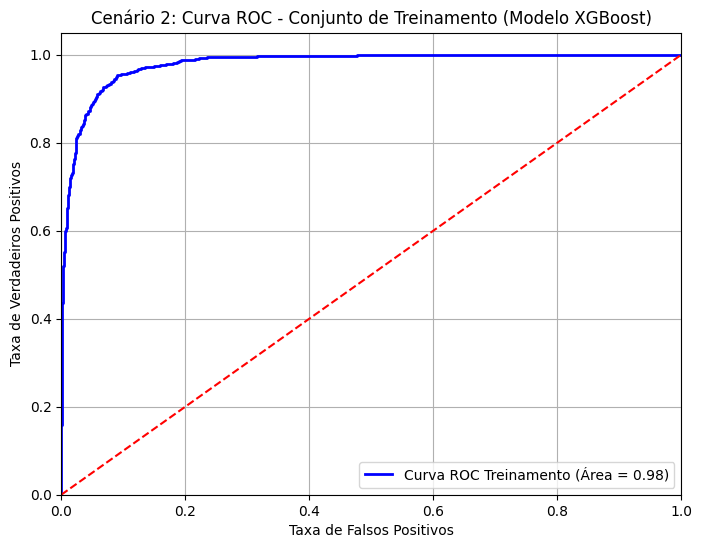

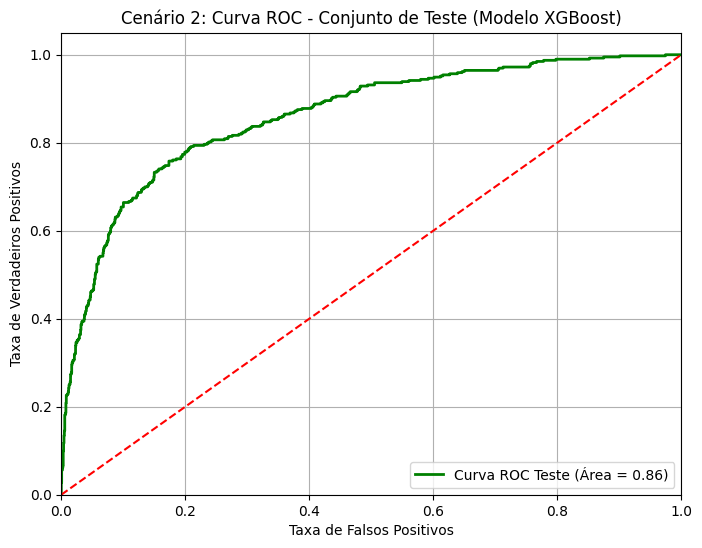

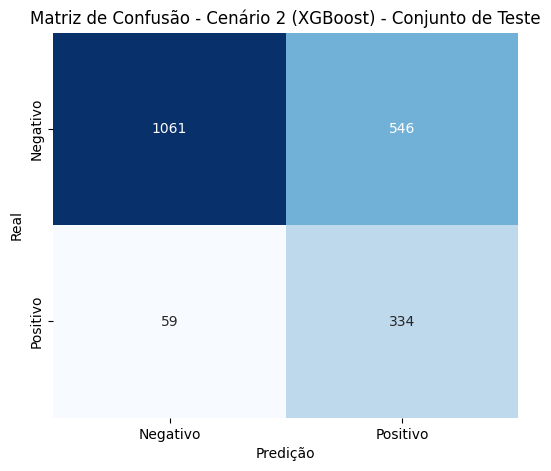

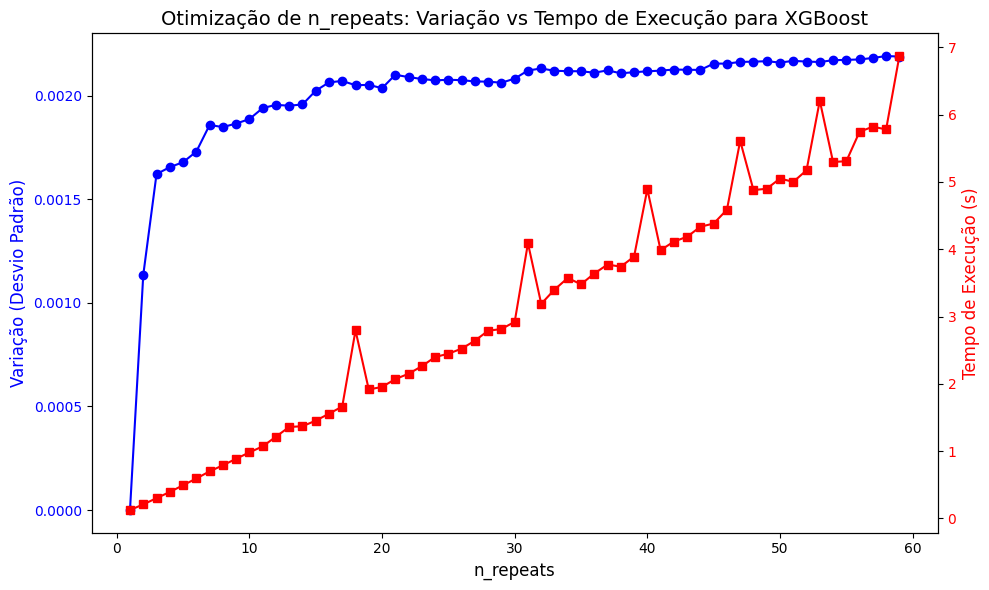

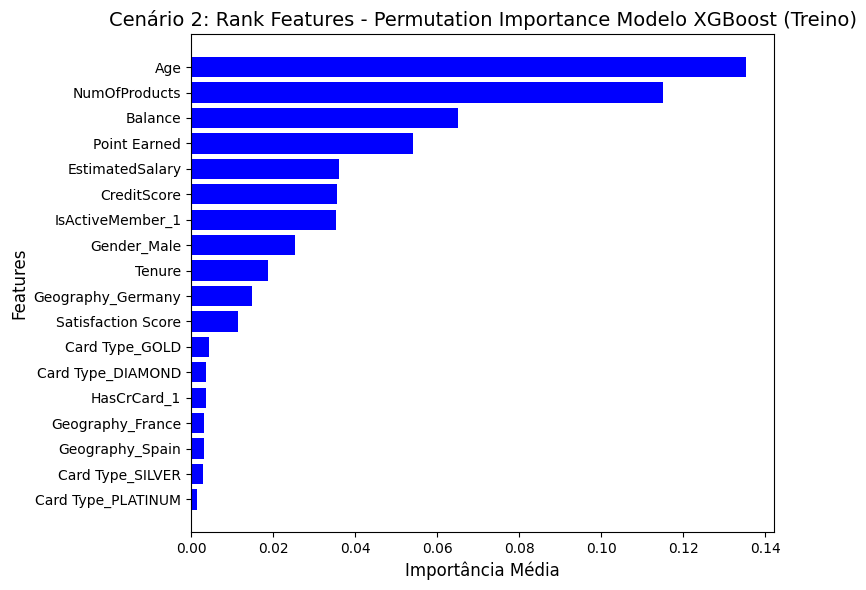

Importância das Features no Conjunto de Teste:
[-0.00047636  0.08680267 -0.00321557  0.03042952  0.08761609 -0.00132859
  0.00022368 -0.00090174 -0.00035561  0.01996344 -0.00056954  0.01262682
  0.00077684  0.00915206 -0.00144958 -0.00312456 -0.00127294  0.00017545]


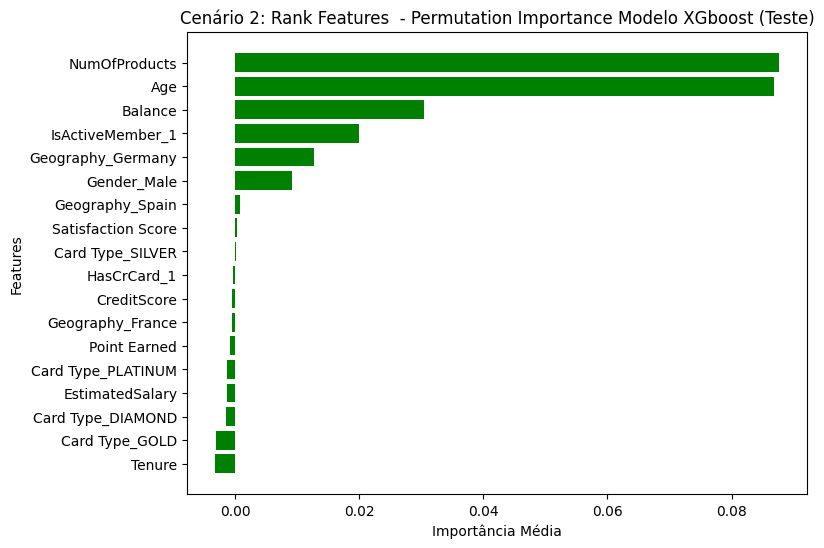

Tempo de Início : 2024-12-16 13:38:07.337153
Tempo de Término: 2024-12-16 13:43:17.241570
Diferença: 00:05


In [26]:
#%% Modelo XGBoost 

# === Configurações de log do Optuna ===
# Use apenas uma das opções abaixo, descomentando a desejada:

# 1. Mostrar apenas mensagens críticas (mensagens essenciais como erros graves)
optuna.logging.set_verbosity(optuna.logging.CRITICAL)

# 2. Mostrar apenas erros
# optuna.logging.set_verbosity(optuna.logging.ERROR)

# 3. Mostrar apenas avisos (oculta mensagens informativas)
# optuna.logging.set_verbosity(optuna.logging.WARNING)

# 4. Mostrar todas as mensagens informativas (comportamento padrão)
# optuna.logging.set_verbosity(optuna.logging.INFO)

# 5. Mostrar mensagens detalhadas para depuração
# optuna.logging.set_verbosity(optuna.logging.DEBUG)

# === Suprimir todos os warnings === (isso é para deixar o notebook mais limpo, vale tirar quando desejar 
                                    #fazer qualquer diagnostico, aqui sei que esta tudo ok por enquanto ])
warnings.filterwarnings("ignore")

# === Redirecionar saída padrão e erros para evitar mensagens adicionais ===
f = open(os.devnull, 'w')
os.dup2(f.fileno(), 1)  # Redireciona stdout (saída padrão)
os.dup2(f.fileno(), 2)  # Redireciona stderr (saída de erros)


print("Cenário 2:Modelo XGboost")

# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)

# Definir o espaço de busca para os hiperparâmetros do XGBoost
def objective(trial):
    # Hiperparâmetros
    params = {
    'objective': 'binary:logistic',  # Modelo de classificação binária
    'eval_metric': 'auc',  # Métrica de avaliação para maximizar AUC ROC
    'learning_rate': trial.suggest_float('learning_rate', 0.05, 0.1),  # Aumentar o learning rate para acelerar
    'max_depth': trial.suggest_int('max_depth', 5, 8),  # Reduzir a profundidade das árvores
    'n_estimators': trial.suggest_int('n_estimators', 50, 500),  # Menos estimadores para reduzir o tempo de treinamento
    'subsample': trial.suggest_float('subsample', 0.7, 0.9),  # Usar menos dados para acelerar
    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),  # Ajustar a amostra de características por árvore
    'gamma': trial.suggest_float('gamma', 0, 0.5),  # Menos regularização (evita overfitting)
    'lambda': trial.suggest_float('lambda', 0.1, 10.0),  # Regularização L2 moderada
    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),  # Tamanho mínimo das folhas
    'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 5),  # Ajuste para classes desbalanceadas
    'tree_method': 'gpu_hist',  # Usar GPU, se disponível, para acelerar o treinamento
    'verbose': 0  # Desativar verbosidade para evitar sobrecarga de logs

    }
    
    # Passo 1: Balancear os Dados com Undersampling
    undersampler = RandomUnderSampler()
    X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

    # Passo 2: Normalizar os Dados de Treinamento
    scaler = StandardScaler()
    X_balanced_scaled = scaler.fit_transform(X_balanced)
    
    # Passo 3: Rodar a Validação Cruzada e obter predições OOF para o modelo XGBoost
    kf = StratifiedKFold(n_splits=6, shuffle=True)
    xgb_model = xgb.XGBClassifier(**params,device='cuda',n_jobs=-1)
    
    # Obter as predições OOF
    y_pred_oof_xgb = cross_val_score(xgb_model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1',error_score='raise').mean()
    
    return y_pred_oof_xgb  # Maximizar o ROC AUC como métrica de desempenho

# Definir o estudo com Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Número de iterações de otimização

# Melhor conjunto de parâmetros encontrado
best_params = study.best_params
print(f"Melhores parâmetros encontrados: {best_params}")

# Passo 4: Rodar o modelo XGBoost com os melhores parâmetros encontrados
xgb_model = xgb.XGBClassifier(**best_params,tree_method='hist',device='cuda',n_jobs=-1)
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Validar com os dados balanceados
kf = StratifiedKFold(n_splits=6, shuffle=True)
cv_results_xgb = cross_val_score(xgb_model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')

# Exibir os resultados da validação cruzada do modelo XGBoost
print(f'\nAcurácia por fold (Modelo XGBoost): {cv_results_xgb}')
print(f'Média da acurácia (Modelo XGBoost): {cv_results_xgb.mean():.4f}')

# Passo 5: Obter as predições no conjunto de treino (OOF)
y_pred_oof_xgb = xgb_model.fit(X_balanced_scaled, y_balanced).predict_proba(X_balanced_scaled)[:, 1]

# Cálculo das métricas no conjunto de treino (OOF) para o modelo XGBoost
roc_auc_oof_xgb = roc_auc_score(y_balanced, y_pred_oof_xgb)
precision_oof_xgb = precision_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
recall_oof_xgb = recall_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
f1_oof_xgb = f1_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
accuracy_oof_xgb = accuracy_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
conf_matrix_train_xgb = confusion_matrix(y_balanced, xgb_model.predict(X_balanced_scaled))

# Exibir as métricas do conjunto de treino (OOF) para o modelo XGBoost
print("\nMétricas do Conjunto de Treino (OOF) para o Modelo XGBoost:")
print(f"ROC AUC: {roc_auc_oof_xgb:.4f}")
print(f"Precisão: {precision_oof_xgb:.4f}")
print(f"Revocação: {recall_oof_xgb:.4f}")
print(f"F1-Score: {f1_oof_xgb:.4f}")
print(f"Acurácia: {accuracy_oof_xgb:.4f}")
print(conf_matrix_train_xgb)

# Passo 6: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test_xgb = xgb_model.predict_proba(X_test_scaled)[:, 1]

# Cálculo das métricas no conjunto de teste para o modelo XGBoost
roc_auc_test_cenario2_xgb = roc_auc_score(y_test, y_pred_test_xgb)
precision_test_cenario2_xgb = precision_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
recall_test_cenario2_xgb = recall_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
f1_test_cenario2_xgb = f1_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
accuracy_test_cenario2_xgb = accuracy_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
conf_matrix_test_cenario2_xgb = confusion_matrix(y_test, xgb_model.predict(X_test_scaled))

# Exibir as métricas do conjunto de teste para o modelo XGBoost
print("\nMétricas do Conjunto de Teste para o Modelo XGBoost (Cenário 2):")
print(f"ROC AUC: {roc_auc_test_cenario2_xgb:.4f}")
print(f"Acurácia: {accuracy_test_cenario2_xgb:.4f}")
print(f"Precisão: {precision_test_cenario2_xgb:.4f}")
print(f"Revocação: {recall_test_cenario2_xgb:.4f}")
print(f"F1-Score: {f1_test_cenario2_xgb:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_test_cenario2_xgb)



# Passo 7: Plotar a curva ROC usando o conjunto de treino (OOF)
fpr_train_xgb, tpr_train_xgb, _ = roc_curve(y_balanced, y_pred_oof_xgb)
roc_auc_train_xgb = auc(fpr_train_xgb, tpr_train_xgb)

# Curva ROC para o conjunto de teste
fpr_test_cenario2_xgb, tpr_test_cenario2_xgb, _ = roc_curve(y_test, y_pred_test_xgb)
roc_auc_test_cenario2_xgb = auc(fpr_test_cenario2_xgb, tpr_test_cenario2_xgb)

# Gráfico da curva ROC para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.plot(fpr_train_xgb, tpr_train_xgb, color='blue', lw=2, label='Curva ROC Treinamento (Área = {:.2f})'.format(roc_auc_train_xgb))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 2: Curva ROC - Conjunto de Treinamento (Modelo XGBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Gráfico da curva ROC para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_cenario2_xgb, tpr_test_cenario2_xgb, color='green', lw=2, label='Curva ROC Teste (Área = {:.2f})'.format(roc_auc_test_cenario2_xgb))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 2: Curva ROC - Conjunto de Teste (Modelo XGBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cenario2_xgb, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 2 (XGBoost) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()  # Exibir o gráfico sem salvar a imagem

#######PERMUTATION IMPORTANCE#####################

# Permutation Importance no Conjunto de Treino

#permutation_train_xg = permutation_importance(xgb_model, X_balanced_scaled, y_balanced, n_repeats=500, random_state=42, scoring=make_scorer(f1_score))
#importances_train_xg = permutation_train_xg.importances_mean
#print("Importância das Features no Conjunto de Treino:")
#print(importances_train_xg)

# Obter as 5 features mais importantes no treino
#sorted_idx_train_xg = np.argsort(importances_train_xg)[-20:]
#top_features_train_xg = X_test.columns[sorted_idx_train_xg]

# Plotar o gráfico de barra lateral para o conjunto de treino
#plt.figure(figsize=(8, 6))
#plt.barh(top_features_train_xg, importances_train_xg[sorted_idx_train_xg], color='blue')
#plt.xlabel("Importância Média")
#plt.ylabel("Features")
#plt.title("Cenário 2: Rank Features - Permutation Importance Modelo XGboost (Treino)")
#plt.show()






# Permutation Importance no Conjunto de Treino com grafico para escolha do melhor numero de repeticoes

# Lista de valores de n_repeats a serem testados
n_repeats_list = range(1, 60, 1)  # Testar de 1 a 60 em passos de 1
variations = []  # Para armazenar a variação (desvio padrão das importâncias)
time_taken = []  # Para armazenar o tempo de execução

# Loop para calcular a estabilidade e o tempo de execução
for n_repeats in n_repeats_list:
    start_time = time.time()
    result = permutation_importance(
        xgb_model,
        X_balanced_scaled,
        y_balanced,
        n_repeats=n_repeats,
        random_state=42,
        scoring=make_scorer(f1_score),
    )
    time_taken.append(time.time() - start_time)  # Tempo de execução
    variation = np.std(result.importances, axis=1).mean()  # Desvio padrão das importâncias
    variations.append(variation)

# Criar um gráfico com dois eixos y (dual-axis)
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotar a variação das importâncias
ax1.plot(n_repeats_list, variations, color='blue', marker='o', label='Variação das Importâncias')
ax1.set_xlabel('n_repeats', fontsize=12)
ax1.set_ylabel('Variação (Desvio Padrão)', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Adicionar o segundo eixo y para o tempo de execução
ax2 = ax1.twinx()
ax2.plot(n_repeats_list, time_taken, color='red', marker='s', label='Tempo de Execução')
ax2.set_ylabel('Tempo de Execução (s)', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# Título e ajuste do layout
plt.title('Otimização de n_repeats: Variação vs Tempo de Execução para XGBoost', fontsize=14)
fig.tight_layout()
plt.show()

# --- Cálculo da Permutation Importance com n_repeats otimizado (se necessário)
# Com base no grafico gerado, um numero estavavel foi 50 n_repeats
optimal_n_repeats = 30
permutation_train_xg = permutation_importance(
    xgb_model,
    X_balanced_scaled,
    y_balanced,
    n_repeats=optimal_n_repeats,
    random_state=42,
    scoring=make_scorer(f1_score),
)
importances_train_xg = permutation_train_xg.importances_mean

# Se X_balanced_scaled for um numpy.ndarray, reconverta para DataFrame
X_balanced_scaled_df = pd.DataFrame(X_balanced_scaled, columns=X_train.columns)

# Obter as 20 features mais importantes no treino
sorted_idx_train_xg = np.argsort(importances_train_xg)[-20:]
top_features_train_xg = X_balanced_scaled_df.columns[sorted_idx_train_xg]

# Plotar o gráfico de barra lateral para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.barh(top_features_train_xg, importances_train_xg[sorted_idx_train_xg], color='blue')
plt.xlabel("Importância Média", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.title("Cenário 2: Rank Features - Permutation Importance Modelo XGBoost (Treino)", fontsize=14)
plt.tight_layout()
plt.show()








# Permutation Importance no Conjunto de Teste
permutation_test_xg = permutation_importance(xgb_model, X_test_scaled, y_test, n_repeats=30, random_state=42, scoring=make_scorer(f1_score))
importances_test_xg = permutation_test_xg.importances_mean
print("Importância das Features no Conjunto de Teste:")
print(importances_test_xg)

# Obter as 5 features mais importantes no teste
sorted_idx_test_xg = np.argsort(importances_test_xg)[-20:]
top_features_test_xg = X_test.columns[sorted_idx_test_xg]

# Plotar o gráfico de barra lateral para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.barh(top_features_test_xg, importances_test_xg[sorted_idx_test_xg], color='green')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Cenário 2: Rank Features  - Permutation Importance Modelo XGboost (Teste)")
plt.show()



#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

# Cenário 2: Catboot

Cenário 2:Modelo CATboost
Tempo de Início: 2024-12-16 14:15:51.234763
Melhores hiperparâmetros encontrados: {'iterations': 763, 'learning_rate': 0.0627718274832561, 'depth': 6, 'scale_pos_weight': 1.6735802052975304, 'l2_leaf_reg': 1.6358418183825414, 'border_count': 100, 'random_strength': 0.2336997285537333, 'bootstrap_type': 'Bernoulli', 'subsample': 0.7144891187713036}

Métricas do Conjunto de Treinamento para o Modelo CatBoost:
ROC AUC: 0.9695
Precisão: 0.8695
Revocação: 0.9520
F1-Score: 0.9089
Acurácia: 0.9046
Matriz de Confusão (Treinamento):
[[1410  235]
 [  79 1566]]

Métricas do Conjunto de Teste para o Modelo CatBoost (Cenário 2):
ROC AUC: 0.8567
Acurácia: 0.7370
Precisão: 0.4135
Revocação: 0.8092
F1-Score: 0.5473
Matriz de Confusão:
[[1156  451]
 [  75  318]]


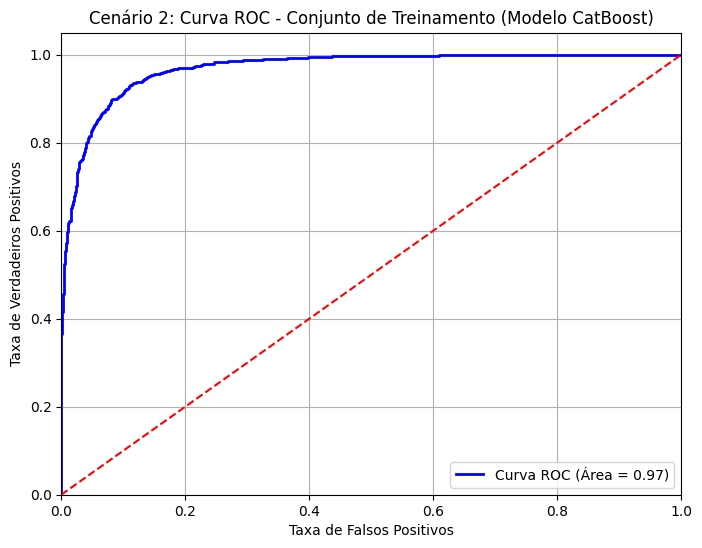

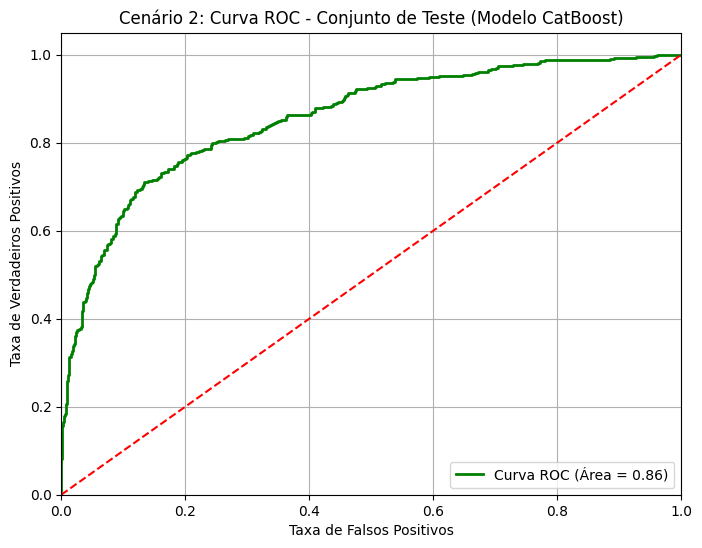

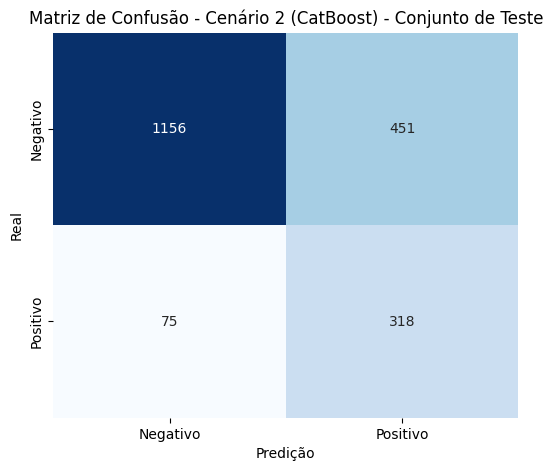

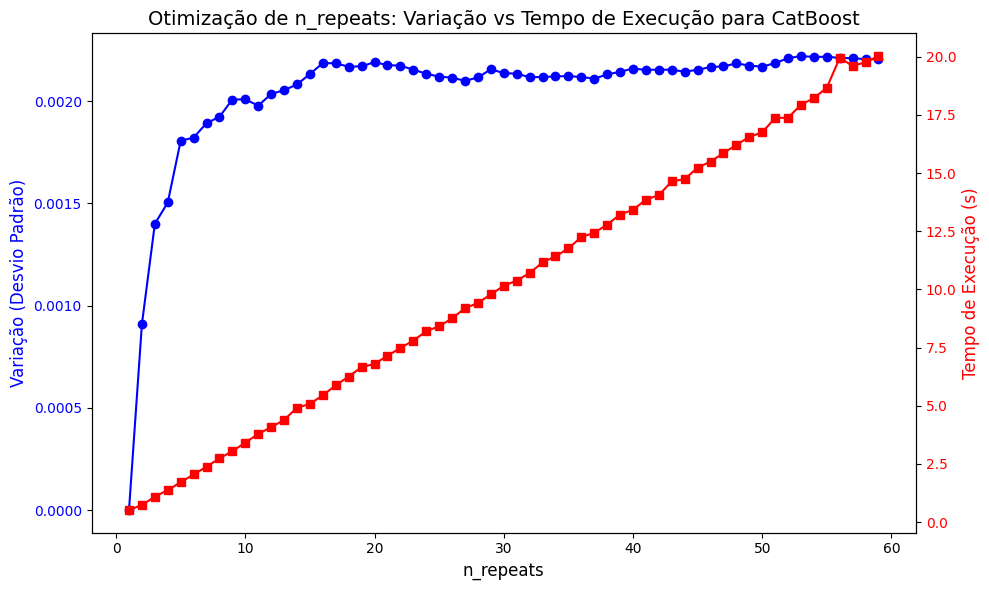

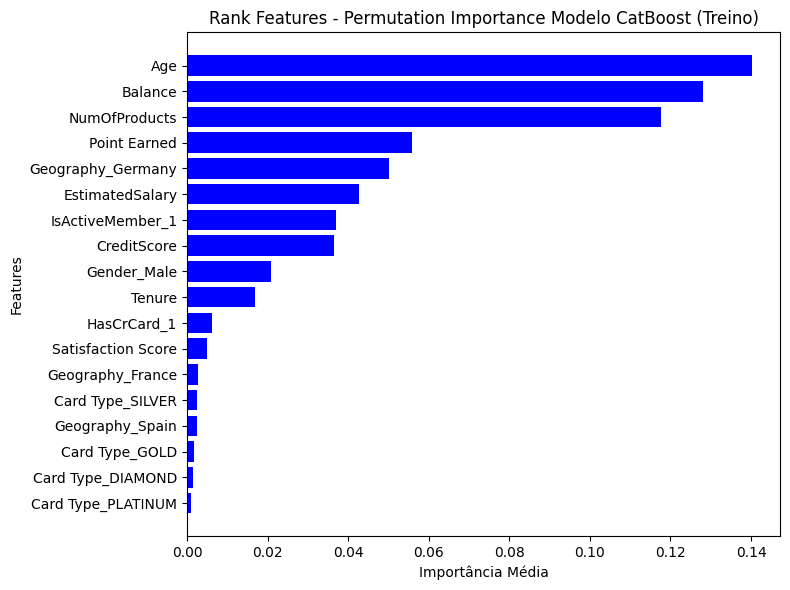

Importância das Features no Conjunto de Teste:
[-2.23879179e-03  1.00787536e-01 -9.40607113e-04  6.90420382e-02
  1.03760679e-01  2.95618670e-05  2.70778085e-03  2.20260280e-03
  1.58935554e-03  2.15859446e-02 -4.21218817e-04  3.98341010e-02
  2.47478322e-03  3.18147528e-03 -1.01318460e-03  1.70073363e-05
  1.24667961e-03 -2.79382464e-03]


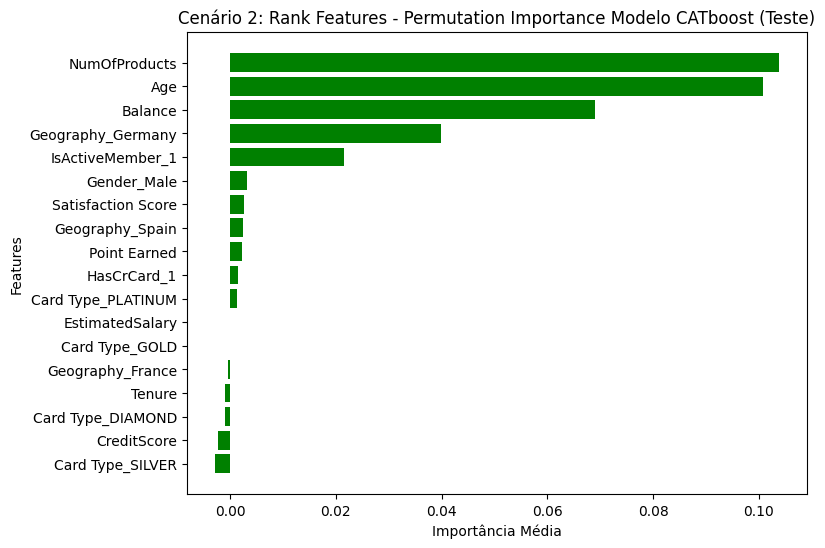

Tempo de Início : 2024-12-16 11:15:51.234763
Tempo de Término: 2024-12-16 13:33:14.542553
Diferença: 02:17


In [22]:
#%% Modelo CatBoost

# === Configurações de log do Optuna ===
# Use apenas uma das opções abaixo, descomentando a desejada:

# 1. Mostrar apenas mensagens críticas (mensagens essenciais como erros graves)
optuna.logging.set_verbosity(optuna.logging.CRITICAL)

# 2. Mostrar apenas erros
# optuna.logging.set_verbosity(optuna.logging.ERROR)

# 3. Mostrar apenas avisos (oculta mensagens informativas)
# optuna.logging.set_verbosity(optuna.logging.WARNING)

# 4. Mostrar todas as mensagens informativas (comportamento padrão)
# optuna.logging.set_verbosity(optuna.logging.INFO)

# 5. Mostrar mensagens detalhadas para depuração
# optuna.logging.set_verbosity(optuna.logging.DEBUG)

# === Suprimir todos os warnings === (isso é para deixar o notebook mais limpo, vale tirar quando desejar 
                                    #fazer qualquer diagnostico, aqui sei que esta tudo ok por enquanto ])
warnings.filterwarnings("ignore")

# === Redirecionar saída padrão e erros para evitar mensagens adicionais ===
f = open(os.devnull, 'w')
os.dup2(f.fileno(), 1)  # Redireciona stdout (saída padrão)
os.dup2(f.fileno(), 2)  # Redireciona stderr (saída de erros)

print("Cenário 2:Modelo CATboost")


# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)

# Passo 1: Balancear os Dados com Undersampling
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

# Passo 2: Normalizar os Dados de Treinamento
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Função de objetivo para otimização com Optuna
def objective(trial):
    # Definindo os hiperparâmetros do modelo CatBoost para a otimização
    params = {
        'iterations': trial.suggest_int('iterations', 500, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.05, 0.1),
        'depth': trial.suggest_int('depth', 5, 8),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'border_count': trial.suggest_int('border_count', 32, 100),
        'random_strength': trial.suggest_float('random_strength', 0.1, 1.0),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bernoulli', 'Poisson']),
        'verbose': 0,
        'early_stopping_rounds': 50,
    }
    
    # Adiciona subsample somente se o bootstrap_type for Bernoulli ou Poisson
    if params['bootstrap_type'] in ['Bernoulli', 'Poisson']:
        params['subsample'] = trial.suggest_float('subsample', 0.7, 0.9)
    
    # Inicializar o modelo CatBoost com os hiperparâmetros sugeridos
    model = CatBoostClassifier(**params, task_type='GPU', thread_count=-1)
    
    # Configurar a validação cruzada
    kf = StratifiedKFold(n_splits=6, shuffle=True, random_state=42)
    cv_results = cross_val_score(model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')
    
    return cv_results.mean()

# Passo 3: Otimização com Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Exibir os melhores hiperparâmetros encontrados
print("Melhores hiperparâmetros encontrados:", study.best_params)

# Passo 4: Treinar o modelo CatBoost com os melhores hiperparâmetros encontrados
best_params = study.best_params
catboost_model = CatBoostClassifier(**best_params, verbose=0, task_type='GPU', thread_count=-1)

# Treinar o modelo com os dados balanceados
catboost_model.fit(X_balanced_scaled, y_balanced)


# Passo 5: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test_catboost = catboost_model.predict_proba(X_test_scaled)[:, 1]
y_pred_train_catboost = catboost_model.predict_proba(X_balanced_scaled)[:, 1]


# Cálculo das métricas no conjunto de treino para o modelo CatBoost
roc_auc_train_catboost = roc_auc_score(y_balanced, y_pred_train_catboost)
precision_train_catboost = precision_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
recall_train_catboost = recall_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
f1_train_catboost = f1_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
accuracy_train_catboost = accuracy_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
conf_matrix_train_cat = confusion_matrix(y_balanced, (y_pred_train_catboost > 0.5).astype(int))

# Exibir as métricas do conjunto de treino para o modelo CatBoost
print("\nMétricas do Conjunto de Treinamento para o Modelo CatBoost:")
print(f"ROC AUC: {roc_auc_train_catboost:.4f}")
print(f"Precisão: {precision_train_catboost:.4f}")
print(f"Revocação: {recall_train_catboost:.4f}")
print(f"F1-Score: {f1_train_catboost:.4f}")
print(f"Acurácia: {accuracy_train_catboost:.4f}")
print("Matriz de Confusão (Treinamento):")
print(conf_matrix_train_cat)



# Cálculo das métricas no conjunto de teste para o modelo CatBoost
roc_auc_test_cenario2_cat = roc_auc_score(y_test, y_pred_test_catboost)
precision_test_cenario2_cat = precision_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
recall_test_cenario2_cat = recall_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
f1_test_cenario2_cat = f1_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
accuracy_test_cenario2_cat = accuracy_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
conf_matrix_test_cenario2_cat = confusion_matrix(y_test, (y_pred_test_catboost > 0.5).astype(int))

# Exibir as métricas do conjunto de teste para o modelo CatBoost
print("\nMétricas do Conjunto de Teste para o Modelo CatBoost (Cenário 2):")
print(f"ROC AUC: {roc_auc_test_cenario2_cat:.4f}")
print(f"Acurácia: {accuracy_test_cenario2_cat:.4f}")
print(f"Precisão: {precision_test_cenario2_cat:.4f}")
print(f"Revocação: {recall_test_cenario2_cat:.4f}")
print(f"F1-Score: {f1_test_cenario2_cat:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_test_cenario2_cat)

# Passo 7: Calcular e plotar a curva ROC usando o conjunto de treino para o modelo CatBoost
fpr_train_catboost, tpr_train_catboost, thresholds_train_catboost = roc_curve(y_balanced, y_pred_train_catboost)
roc_auc_train_catboost = auc(fpr_train_catboost, tpr_train_catboost)

# Passo 6: Calcular e plotar a curva ROC usando o conjunto de teste para o modelo CatBoost
fpr_test_denario2_cat, tpr_test_denario2_cat, thresholds_test_catboost = roc_curve(y_test, y_pred_test_catboost)
roc_auc_test_denario2_cat = auc(fpr_test_denario2_cat, tpr_test_denario2_cat)


# Curva ROC para o Conjunto de Treinamento
plt.figure(figsize=(8, 6))
plt.plot(fpr_train_catboost, tpr_train_catboost, color='blue', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_train_catboost))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 2: Curva ROC - Conjunto de Treinamento (Modelo CatBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Curva ROC para o Conjunto de Teste
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_denario2_cat, tpr_test_denario2_cat, color='green', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_test_denario2_cat))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 2: Curva ROC - Conjunto de Teste (Modelo CatBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cenario2_cat, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 2 (CatBoost) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()  # Exibir o gráfico sem salvar a imagem



#######PERMUTATION IMPORTANCE#####################

# Permutation Importance no Conjunto de Treino

#permutation_train_cat = permutation_importance(catboost_model, X_balanced_scaled, y_balanced, n_repeats=500, random_state=42, scoring=make_scorer(f1_score))
#importances_train_cat = permutation_train_cat.importances_mean
#print("Importância das Features no Conjunto de Treino:")
#print(importances_train_cat)

# Obter as 5 features mais importantes no treino
#sorted_idx_train_cat = np.argsort(importances_train_cat)[-20:]
#top_features_train_cat = X_test.columns[sorted_idx_train_cat]

# Plotar o gráfico de barra lateral para o conjunto de treino
#plt.figure(figsize=(8, 6))
#plt.barh(top_features_train_cat, importances_train_cat[sorted_idx_train_cat], color='blue')
#plt.xlabel("Importância Média")
#plt.ylabel("Features")
#plt.title("Cenário 2: Rank Features - Permutation Importance Modelo CATboost (Treino)")
#plt.show()






# Lista de valores de n_repeats a serem testados
n_repeats_list = range(1, 60, 1)  # Testar de 1 a 60 em passos de 1
variations = []  # Para armazenar a variação (desvio padrão das importâncias)
time_taken = []  # Para armazenar o tempo de execução

# Loop para calcular a estabilidade e o tempo de execução
for n_repeats in n_repeats_list:
    start_time = time.time()
    result = permutation_importance(
        catboost_model,
        X_balanced_scaled,
        y_balanced,
        n_repeats=n_repeats,
        random_state=42,
        scoring=make_scorer(f1_score),
    )
    time_taken.append(time.time() - start_time)  # Tempo de execução
    variation = np.std(result.importances, axis=1).mean()  # Desvio padrão das importâncias
    variations.append(variation)

# Criar um gráfico com dois eixos y (dual-axis)
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotar a variação das importâncias
ax1.plot(n_repeats_list, variations, color='blue', marker='o', label='Variação das Importâncias')
ax1.set_xlabel('n_repeats', fontsize=12)
ax1.set_ylabel('Variação (Desvio Padrão)', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Adicionar o segundo eixo y para o tempo de execução
ax2 = ax1.twinx()
ax2.plot(n_repeats_list, time_taken, color='red', marker='s', label='Tempo de Execução')
ax2.set_ylabel('Tempo de Execução (s)', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# Título e ajuste do layout
plt.title('Otimização de n_repeats: Variação vs Tempo de Execução para CatBoost', fontsize=14)
fig.tight_layout()
plt.show()

# --- Cálculo da Permutation Importance com n_repeats otimizado (se necessário)
# Com base no gráfico gerado, um número estável foi 50 n_repeats (ajuste conforme necessário)
optimal_n_repeats = 30
permutation_train_catboost = permutation_importance(
    catboost_model,
    X_balanced_scaled,
    y_balanced,
    n_repeats=optimal_n_repeats,
    random_state=42,
    scoring=make_scorer(f1_score),
)
importances_train_catboost = permutation_train_catboost.importances_mean

# Se X_balanced_scaled for um numpy.ndarray, reconverta para DataFrame
X_balanced_scaled_df = pd.DataFrame(X_balanced_scaled, columns=X_train.columns)

# Obter as 20 features mais importantes no treino
sorted_idx_train_catboost = np.argsort(importances_train_catboost)[-20:]
top_features_train_catboost = X_balanced_scaled_df.columns[sorted_idx_train_catboost]

# Plotar o gráfico de barra lateral para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.barh(top_features_train_catboost, importances_train_catboost[sorted_idx_train_catboost], color='blue')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Rank Features - Permutation Importance Modelo CatBoost (Treino)")
plt.tight_layout()
plt.show()





# Permutation Importance no Conjunto de Teste
permutation_test_cat = permutation_importance(catboost_model, X_test_scaled, y_test, n_repeats=30, random_state=42, scoring=make_scorer(f1_score))
importances_test_cat = permutation_test_cat.importances_mean
print("Importância das Features no Conjunto de Teste:")
print(importances_test_cat)

# Obter as 5 features mais importantes no teste
sorted_idx_test_cat = np.argsort(importances_test_cat)[-20:]
top_features_test_cat = X_test.columns[sorted_idx_test_cat]

# Plotar o gráfico de barra lateral para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.barh(top_features_test_cat, importances_test_cat[sorted_idx_test_cat], color='green')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Cenário 2: Rank Features - Permutation Importance Modelo CATboost (Teste)")
plt.show()




#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

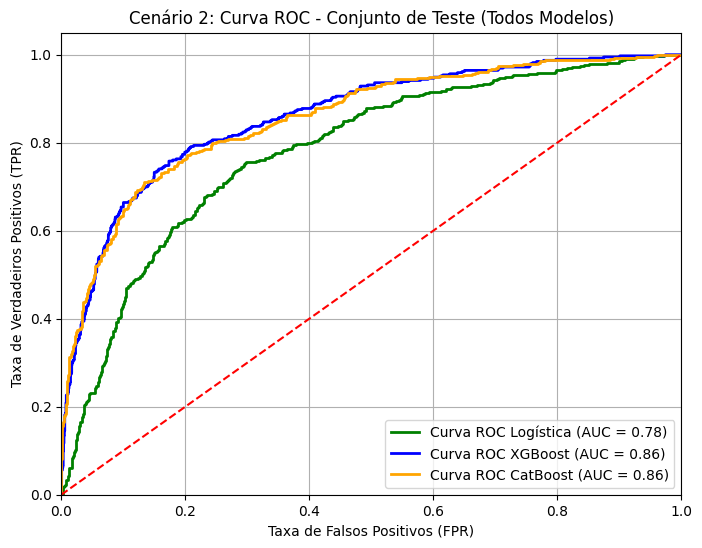

In [27]:
#%% graficos do cenario 2
# Criar uma única figura para as três curvas ROC
plt.figure(figsize=(8, 6))

# Curva ROC para Regressão Logística
plt.plot(fpr_test_cenario2_logit, tpr_test_cenario2_logit, color='green', lw=2, label='Curva ROC Logística (AUC = {:.2f})'.format(roc_auc_test_cenario2_logit))

# Curva ROC para XGBoost
plt.plot(fpr_test_cenario2_xgb, tpr_test_cenario2_xgb, color='blue', lw=2, label='Curva ROC XGBoost (AUC = {:.2f})'.format(roc_auc_test_cenario2_xgb))

# Curva ROC para CatBoost
plt.plot(fpr_test_denario2_cat, tpr_test_denario2_cat, color='orange', lw=2, label='Curva ROC CatBoost (AUC = {:.2f})'.format(roc_auc_test_denario2_cat))

# Linha diagonal (linha de referência)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal

# Ajustar os limites dos eixos
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

# Adicionar rótulos e título
plt.xlabel('Taxa de Falsos Positivos (FPR)')  # FPR = False Positive Rate
plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')  # TPR = True Positive Rate
plt.title('Cenário 2: Curva ROC - Conjunto de Teste (Todos Modelos)')


# Adicionar legenda
plt.legend(loc='lower right')

# Exibir o gráfico
plt.grid()
plt.show()

# Cenário 3: Logistico

CreditScore           0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
EstimatedSalary       0
Satisfaction Score    0
Point Earned          0
HasCrCard_1           0
IsActiveMember_1      0
Geography_France      0
Geography_Germany     0
Geography_Spain       0
Gender_Male           0
Card Type_DIAMOND     0
Card Type_GOLD        0
Card Type_PLATINUM    0
Card Type_SILVER      0
dtype: int64
CreditScore             int64
Age                     int64
Tenure                  int64
Balance               float64
NumOfProducts           int64
EstimatedSalary       float64
Satisfaction Score      int64
Point Earned            int64
HasCrCard_1             int64
IsActiveMember_1        int64
Geography_France        int64
Geography_Germany       int64
Geography_Spain         int64
Gender_Male             int64
Card Type_DIAMOND       int64
Card Type_GOLD          int64
Card Type_PLATINUM      int64
Card Type_SILVER        int64
dtype: object
E

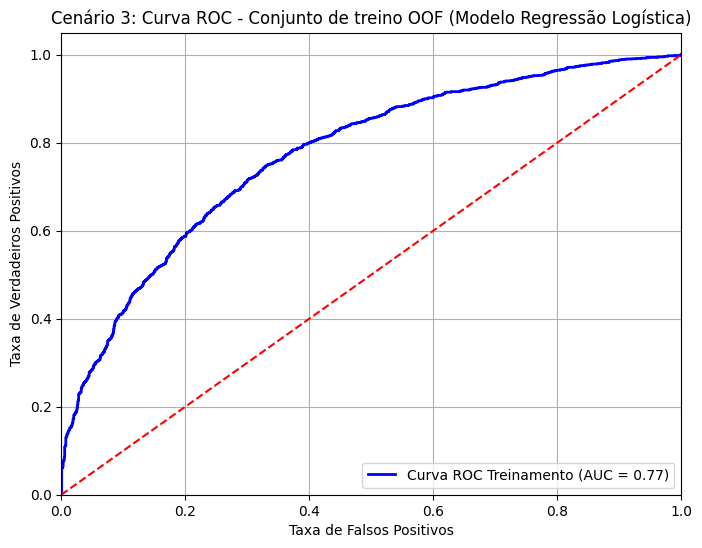

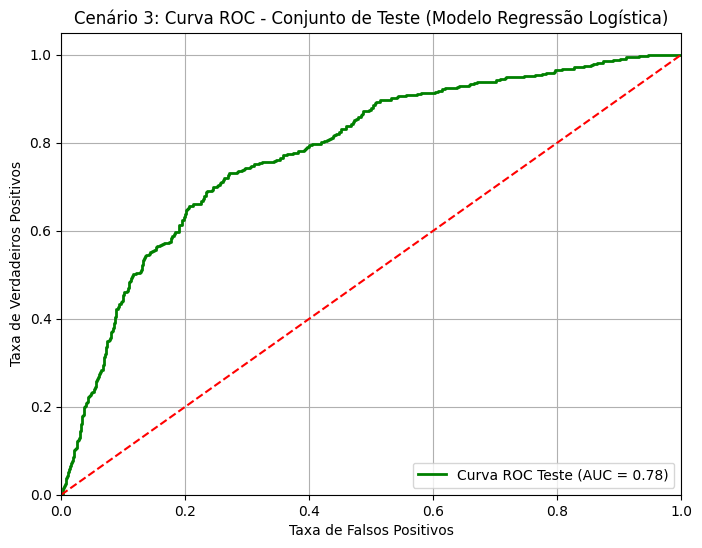

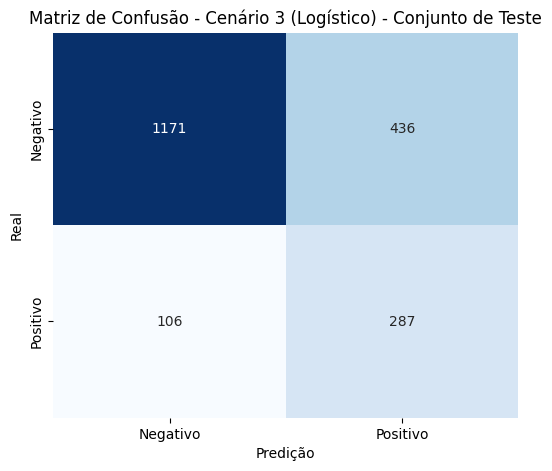

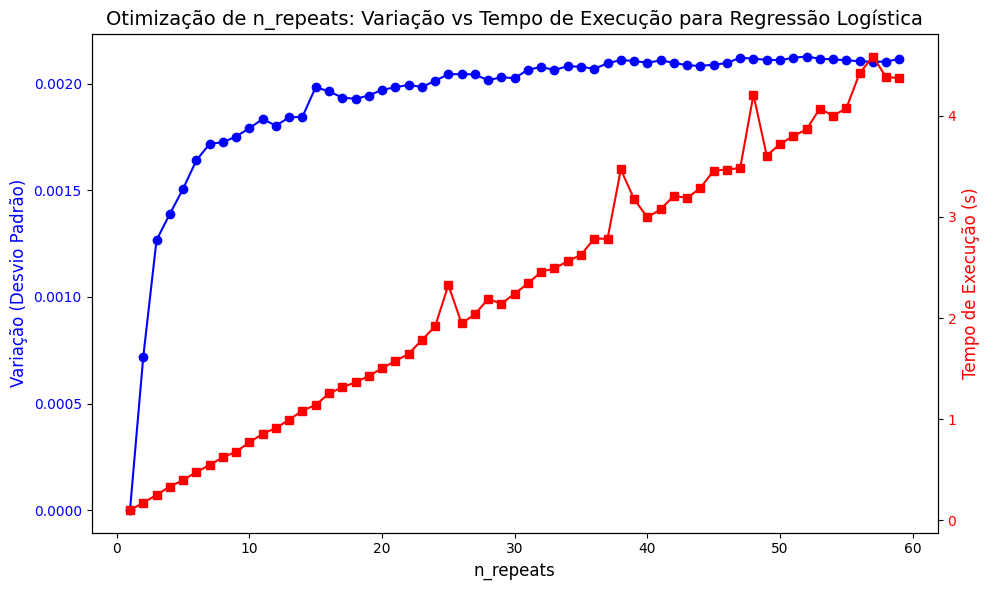

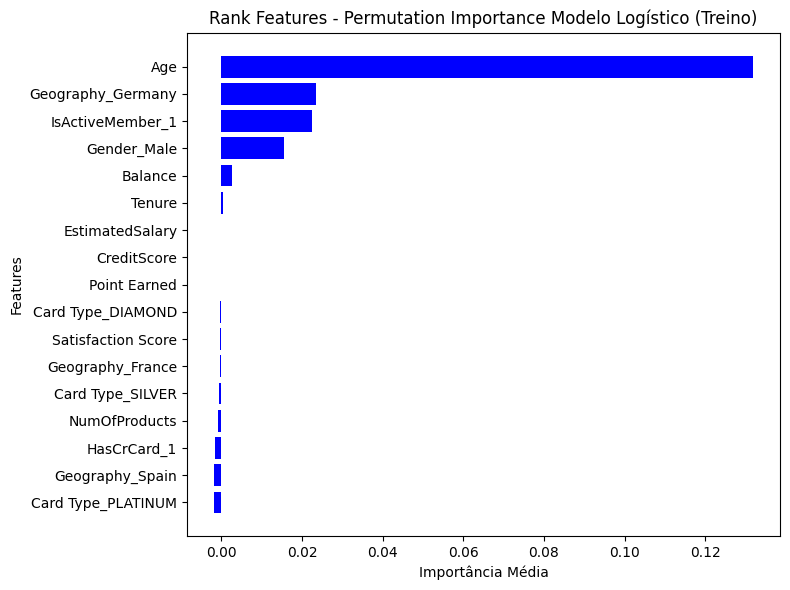

Importância das Features no Conjunto de Teste:
[-2.75166311e-07  1.69812899e-01  4.71175412e-03  2.02922430e-02
  2.60034086e-03  0.00000000e+00  2.58638472e-03  2.02702740e-03
  1.08740547e-03  3.12567624e-02  4.44172636e-03  3.32870928e-02
 -7.72416829e-04  2.11810782e-02  2.65587819e-03 -1.01287225e-03
  1.52386862e-03]


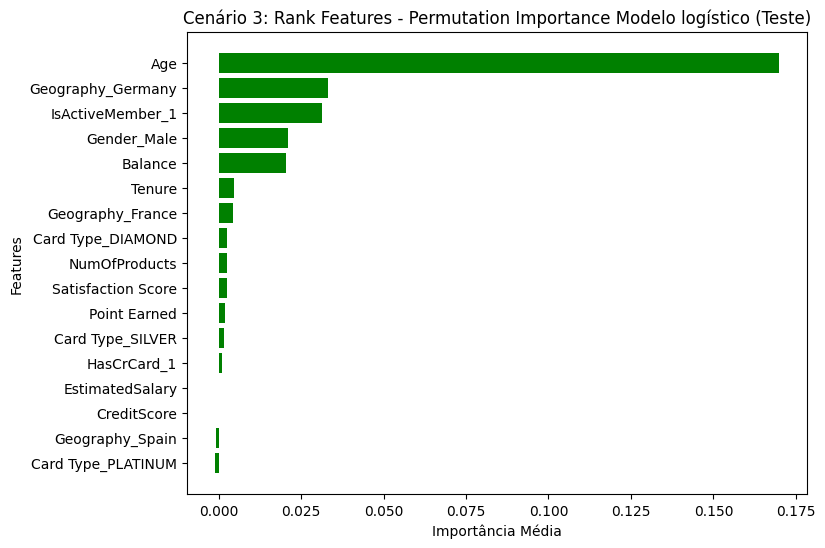

Tempo de Início : 2024-12-16 13:58:45.534546
Tempo de Término: 2024-12-16 15:54:19.390387
Diferença: 01:55


In [53]:
#%%CENÁRIO 3 - MODELOS COM HIPERPARAMETROS MAXIMIZADOS PELO OPTUNA E REMOCAO DE VARIAVEIS <0 NO TEST4 DE PERMUTATION IMPORTANCE DO CENARIO 02

#Instanciando as variaveis de treino e teste noavmente so por precaucao 

df_dummies.dtypes

df_dummies['Exited'] = df_dummies['Exited'].astype('int64')


X = df_dummies .drop('Exited', axis=1)

y =  df_dummies['Exited']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(X_train.isnull().sum())
print(X_train.dtypes)
print(y_train.value_counts())


# removendo para o modelo logistico de acordo com o permutation imporentance desse modelo no cenario 2

X_train=teste_multco_treino.drop(["Exited",
                                  "Card Type_GOLD"], axis=1)
y_train=teste_multco_treino['Exited']

X_test=base_corrige_teste.drop(["Exited",
                                  "Card Type_GOLD"], axis=1)


print(X_train.isnull().sum())
print(X_train.dtypes)
print(y_train.value_counts())


#%% Modelo logístico binário 
#
print("Cenário 3:Modelo Logistico")


#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))


# === Configurações de log do Optuna ===
# Use apenas uma das opções abaixo, descomentando a desejada:

# 1. Mostrar apenas mensagens críticas (mensagens essenciais como erros graves)
optuna.logging.set_verbosity(optuna.logging.CRITICAL)

# 2. Mostrar apenas erros
# optuna.logging.set_verbosity(optuna.logging.ERROR)

# 3. Mostrar apenas avisos (oculta mensagens informativas)
# optuna.logging.set_verbosity(optuna.logging.WARNING)

# 4. Mostrar todas as mensagens informativas (comportamento padrão)
# optuna.logging.set_verbosity(optuna.logging.INFO)

# 5. Mostrar mensagens detalhadas para depuração
# optuna.logging.set_verbosity(optuna.logging.DEBUG)

# === Suprimir todos os warnings === (isso é para deixar o notebook mais limpo, vale tirar quando desejar 
                                    #fazer qualquer diagnostico, aqui sei que esta tudo ok por enquanto ])
warnings.filterwarnings("ignore")

# === Redirecionar saída padrão e erros para evitar mensagens adicionais ===
f = open(os.devnull, 'w')
os.dup2(f.fileno(), 1)  # Redireciona stdout (saída padrão)
os.dup2(f.fileno(), 2)  # Redireciona stderr (saída de erros)




# Função de objetivo para otimizar os parâmetros da regressão logística
def objective(trial):
    max_attempts = 10  # Número máximo de tentativas
    attempt = 0  # Contador de tentativas

    while attempt < max_attempts:
        try:
            # Passo 1: Balancear os Dados com Undersampling
            undersampler = RandomUnderSampler()
            X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

            # Passo 2: Normalizar os Dados de Treinamento
            scaler = StandardScaler()
            X_balanced_scaled = scaler.fit_transform(X_balanced)

            # Passo 3: Definir os parâmetros a serem otimizados
            C = trial.suggest_loguniform('C', 1e-5, 1e2)  # Regularização
            penalty = trial.suggest_categorical('penalty', ['l1', 'l2', 'elasticnet', None])  # Penalização
            solver = trial.suggest_categorical('solver', ['liblinear', 'saga', 'lbfgs'])  # Solver
            
            # Novos parâmetros
            max_iter = trial.suggest_int('max_iter', 50, 2000)  # Número máximo de iterações
            class_weight = trial.suggest_categorical('class_weight', [None, 'balanced'])  # Pesos das classes

            # Ajustar o solver caso a penalização seja 'elasticnet'
            if penalty == 'elasticnet':
                solver = 'saga'  # Forçar o uso do solver 'saga' se a penalização for 'elasticnet'

            # Ajustar para o caso do solver 'liblinear' (não permite penalty=None)
            if solver == 'liblinear' and penalty is None:
                penalty = 'l2'  # Forçar penalização L2 se for 'liblinear'

            # Ajustar para o caso do solver 'lbfgs' (não permite penalty='l1')
            if solver == 'lbfgs' and penalty == 'l1':
                penalty = 'l2'  # Forçar penalização L2 se for 'lbfgs'

            # Definir o valor de l1_ratio para elasticnet
            if penalty == 'elasticnet':
                l1_ratio = trial.suggest_uniform('l1_ratio', 0, 1)  # Novo parâmetro l1_ratio
            else:
                l1_ratio = None  # Não é necessário para L1 ou L2

            # Configurar o modelo com os parâmetros sugeridos
            log_reg = LogisticRegression(C=C, penalty=penalty, solver=solver, l1_ratio=l1_ratio,
                                         max_iter=max_iter, class_weight=class_weight,n_jobs=-1)

            # Validar o modelo usando validação cruzada estratificada
            kf = StratifiedKFold(n_splits=6, shuffle=True)
            cv_results = cross_val_score(log_reg, X_balanced_scaled, y_balanced, cv=kf, scoring='roc_auc', error_score='raise')

            return cv_results.mean()  # Maximizar o AUC

        except Exception as e:
            attempt += 1  # Incrementa o contador de tentativas
            print(f"Erro durante a execução da tentativa: {e}")
            print(f"Tentativa {attempt}/{max_attempts} com os seguintes parâmetros:")
            print(f"Solver: {solver}, Penalty: {penalty}, C: {C}, l1_ratio: {l1_ratio}, max_iter: {max_iter}, class_weight: {class_weight}")

            # Se atingiu o máximo de tentativas, levantar erro e interromper
            if attempt == max_attempts:
                raise RuntimeError(f"Tentativas máximas alcançadas para o modelo: Logistic Regression")

# Passo 4: Criar o estudo Optuna e otimizar os hiperparâmetros
study = optuna.create_study(direction='maximize')  # Maximizar AUC
study.optimize(objective, n_trials=50)  # Executar 20 tentativas


# Exibir os melhores parâmetros
best_params = study.best_params
print(f"Melhores parâmetros encontrados: {best_params}")

# Passo 5: Treinar o modelo final com os melhores parâmetros
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Criar o modelo com os melhores parâmetros obtidos
log_reg = LogisticRegression(C=best_params['C'], penalty=best_params['penalty'], solver=best_params['solver'],n_jobs=-1,
                             l1_ratio=best_params.get('l1_ratio', None))

# Passo 6: Validar o modelo com os dados balanceados usando AUC
kf = StratifiedKFold(n_splits=6, shuffle=True)
cv_results = cross_val_score(log_reg, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')

# Exibir os resultados da validação cruzada (AUC)
print(f'\nAUC por fold: {cv_results}')
print(f'Média da AUC: {cv_results.mean():.4f}')

# Passo 7: Treinar o modelo com os dados balanceados e melhores parâmetros
log_reg.fit(X_balanced_scaled, y_balanced)

# Passo 8: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test = log_reg.predict_proba(X_test_scaled)[:, 1]

# Passo 9: Calcular as métricas no conjunto de treino (validação cruzada OOF)
y_pred_train_oof = log_reg.predict_proba(X_balanced_scaled)[:, 1]
roc_auc_train = roc_auc_score(y_balanced, y_pred_train_oof)
accuracy_train = accuracy_score(y_balanced, log_reg.predict(X_balanced_scaled))
precision_train = precision_score(y_balanced, log_reg.predict(X_balanced_scaled))
recall_train = recall_score(y_balanced, log_reg.predict(X_balanced_scaled))
f1_train = f1_score(y_balanced, log_reg.predict(X_balanced_scaled))
conf_matrix_train = confusion_matrix(y_balanced, log_reg.predict(X_balanced_scaled))

# Exibir as métricas no conjunto de treino (validação cruzada OOF)
print("\nMétricas do Conjunto de Treino (validação cruzada) para o Modelo Logístico:")
print(f"ROC AUC: {roc_auc_train:.4f}")
print(f"Acurácia: {accuracy_train:.4f}")
print(f"Precisão: {precision_train:.4f}")
print(f"Recall: {recall_train:.4f}")
print(f"F1 Score: {f1_train:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_train)

# Passo 10: Calcular as métricas no conjunto de teste
roc_auc_test_cenario3_logit = roc_auc_score(y_test, y_pred_test)
accuracy_test_cenario3_logit = accuracy_score(y_test, log_reg.predict(X_test_scaled))
precision_test_cenario3_logit = precision_score(y_test, log_reg.predict(X_test_scaled))
recall_test_cenario3_logit = recall_score(y_test, log_reg.predict(X_test_scaled))
f1_test_cenario3_logit = f1_score(y_test, log_reg.predict(X_test_scaled))
conf_matrix_test_cenario3_logit = confusion_matrix(y_test, log_reg.predict(X_test_scaled))

# Exibir as métricas no conjunto de teste
print("\nMétricas do Conjunto de Teste para o Modelo Logístico (Cenário 3):")
print(f"ROC AUC: {roc_auc_test_cenario3_logit:.4f}")
print(f"Acurácia: {accuracy_test_cenario3_logit:.4f}")
print(f"Precisão: {precision_test_cenario3_logit:.4f}")
print(f"Recall: {recall_test_cenario3_logit:.4f}")
print(f"F1 Score: {f1_test_cenario3_logit:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_test_cenario3_logit)



# Passo 11: Calcular a curva ROC para o treinamento (validação cruzada OOF)
fpr_train, tpr_train, _ = roc_curve(y_balanced, y_pred_train_oof)
roc_auc_train = auc(fpr_train, tpr_train)

# Passo 12: Calcular a curva ROC para o teste
fpr_test_cenario3_logit, tpr_test_cenario3_logit, _ = roc_curve(y_test, y_pred_test)
roc_auc_test_cenario3_logit = auc(fpr_test_cenario3_logit, tpr_test_cenario3_logit)

# Passo 13: Plotar a curva ROC para o treinamento (OOF)
plt.figure(figsize=(8, 6))
plt.plot(fpr_train, tpr_train, color='blue', lw=2, label='Curva ROC Treinamento (AUC = {:.2f})'.format(roc_auc_train))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 3: Curva ROC - Conjunto de treino OOF (Modelo Regressão Logística)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Passo 14: Plotar a curva ROC para o teste
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_cenario3_logit, tpr_test_cenario3_logit, color='green', lw=2, label='Curva ROC Teste (AUC = {:.2f})'.format(roc_auc_test_cenario3_logit))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 3: Curva ROC - Conjunto de Teste (Modelo Regressão Logística)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cenario3_logit, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 3 (Logístico) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()  # Exibir o gráfico sem salvar a imagem




#######PERMUTATION IMPORTANCE#####################

# Permutation Importance no Conjunto de Treino

#permutation_train = permutation_importance(log_reg, X_balanced_scaled, y_balanced, n_repeats=500, random_state=42,scoring=make_scorer(f1_score))
#importances_train = permutation_train.importances_mean
#print("Importância das Features no Conjunto de Treino:")
#print(importances_train)

# Obter as 5 features mais importantes no treino
#sorted_idx_train = np.argsort(importances_train)[-20:]
#top_features_train = X_test.columns[sorted_idx_train]

# Plotar o gráfico de barra lateral para o conjunto de treino
#plt.figure(figsize=(8, 6))
#plt.barh(top_features_train, importances_train[sorted_idx_train], color='blue')
#plt.xlabel("Importância Média")
#plt.ylabel("Features")
#plt.title("Cenário 3: Rank Features - Permutation Importance Modelo logístico (Treino)")
#plt.show()






# Permutation Importance no Conjunto de Treino com grafico para escolha do melhor numero de repeticoes

# Lista de valores de n_repeats a serem testados
n_repeats_list = range(1, 60, 1)  # Testar de 1 a 60 em passos de 1
variations = []  # Para armazenar a variação (desvio padrão das importâncias)
time_taken = []  # Para armazenar o tempo de execução

# Loop para calcular a estabilidade e o tempo de execução
for n_repeats in n_repeats_list:
    start_time = time.time()
    result = permutation_importance(
        log_reg,
        X_balanced_scaled,
        y_balanced,
        n_repeats=n_repeats,
        random_state=42,
        scoring=make_scorer(f1_score),
    )
    time_taken.append(time.time() - start_time)  # Tempo de execução
    variation = np.std(result.importances, axis=1).mean()  # Desvio padrão das importâncias
    variations.append(variation)

# Criar um gráfico com dois eixos y (dual-axis)
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotar a variação das importâncias
ax1.plot(n_repeats_list, variations, color='blue', marker='o', label='Variação das Importâncias')
ax1.set_xlabel('n_repeats', fontsize=12)
ax1.set_ylabel('Variação (Desvio Padrão)', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Adicionar o segundo eixo y para o tempo de execução
ax2 = ax1.twinx()
ax2.plot(n_repeats_list, time_taken, color='red', marker='s', label='Tempo de Execução')
ax2.set_ylabel('Tempo de Execução (s)', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# Título e ajuste do layout
plt.title('Otimização de n_repeats: Variação vs Tempo de Execução para Regressão Logística', fontsize=14)
fig.tight_layout()
plt.show()

# --- Cálculo da Permutation Importance com n_repeats otimizado (se necessário)
# Com base no gráfico gerado, um número estável foi 50 n_repeats (ajuste conforme necessário)
optimal_n_repeats = 30
permutation_train_log_reg = permutation_importance(
    log_reg,
    X_balanced_scaled,
    y_balanced,
    n_repeats=optimal_n_repeats,
    random_state=42,
    scoring=make_scorer(f1_score),
)
importances_train_log_reg = permutation_train_log_reg.importances_mean

# Se X_balanced_scaled for um numpy.ndarray, reconverta para DataFrame
X_balanced_scaled_df = pd.DataFrame(X_balanced_scaled, columns=X_train.columns)

# Obter as 5 features mais importantes no treino
sorted_idx_train_log_reg = np.argsort(importances_train_log_reg)[-20:]
top_features_train_log_reg = X_balanced_scaled_df.columns[sorted_idx_train_log_reg]

# Plotar o gráfico de barra lateral para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.barh(top_features_train_log_reg, importances_train_log_reg[sorted_idx_train_log_reg], color='blue')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Rank Features - Permutation Importance Modelo Logístico (Treino)")
plt.tight_layout()
plt.show()





# Permutation Importance no Conjunto de Teste
permutation_test = permutation_importance(log_reg, X_test_scaled, y_test, n_repeats=30, random_state=42,scoring=make_scorer(f1_score))
importances_test = permutation_test.importances_mean
print("Importância das Features no Conjunto de Teste:")
print(importances_test)

# Obter as 5 features mais importantes no teste
sorted_idx_test = np.argsort(importances_test)[-20:]
top_features_test = X_test.columns[sorted_idx_test]

# Plotar o gráfico de barra lateral para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.barh(top_features_test, importances_test[sorted_idx_test], color='green')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Cenário 3: Rank Features - Permutation Importance Modelo logístico (Teste)")
plt.show()


#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")


# Cenário 3: XGboost


CreditScore           0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
EstimatedSalary       0
Satisfaction Score    0
Point Earned          0
HasCrCard_1           0
IsActiveMember_1      0
Geography_France      0
Geography_Germany     0
Geography_Spain       0
Gender_Male           0
Card Type_DIAMOND     0
Card Type_GOLD        0
Card Type_PLATINUM    0
Card Type_SILVER      0
dtype: int64
CreditScore             int64
Age                     int64
Tenure                  int64
Balance               float64
NumOfProducts           int64
EstimatedSalary       float64
Satisfaction Score      int64
Point Earned            int64
HasCrCard_1             int64
IsActiveMember_1        int64
Geography_France        int64
Geography_Germany       int64
Geography_Spain         int64
Gender_Male             int64
Card Type_DIAMOND       int64
Card Type_GOLD          int64
Card Type_PLATINUM      int64
Card Type_SILVER        int64
dtype: object
E

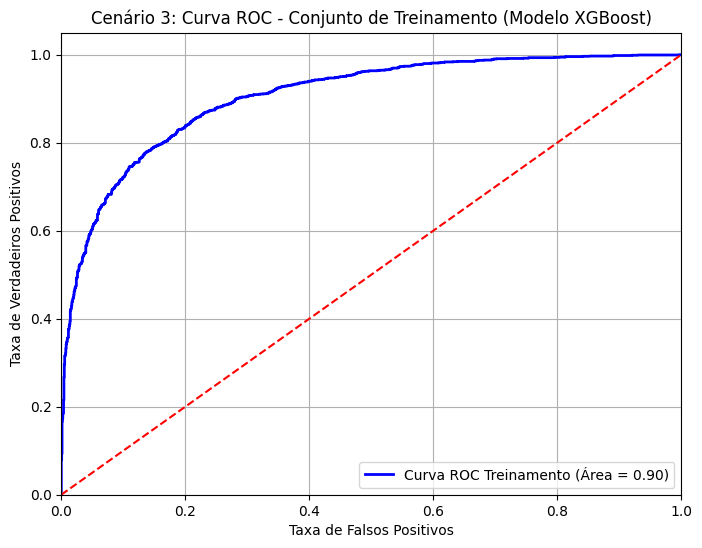

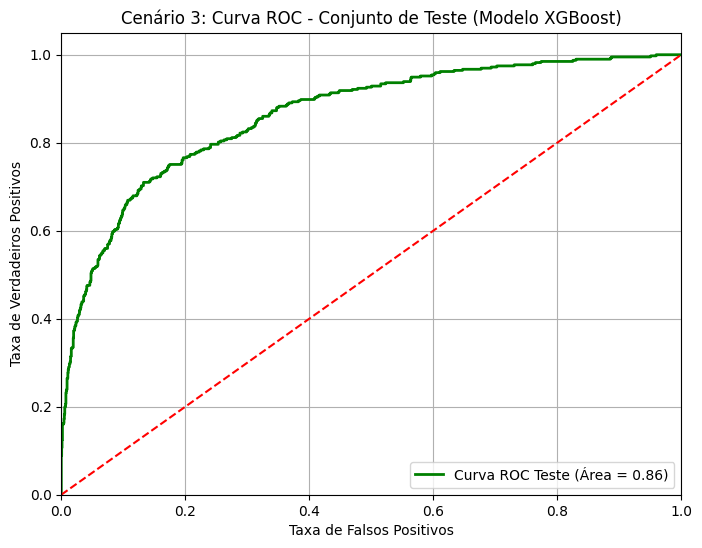

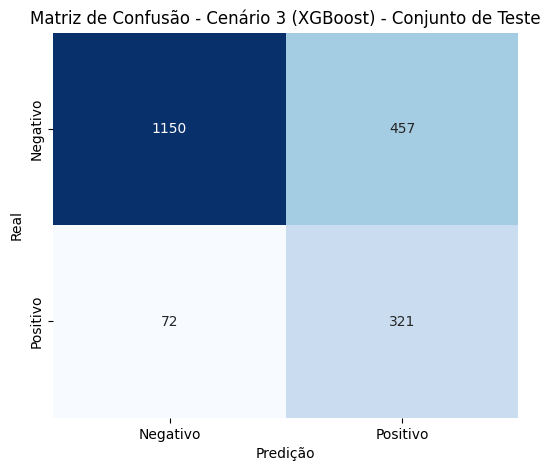

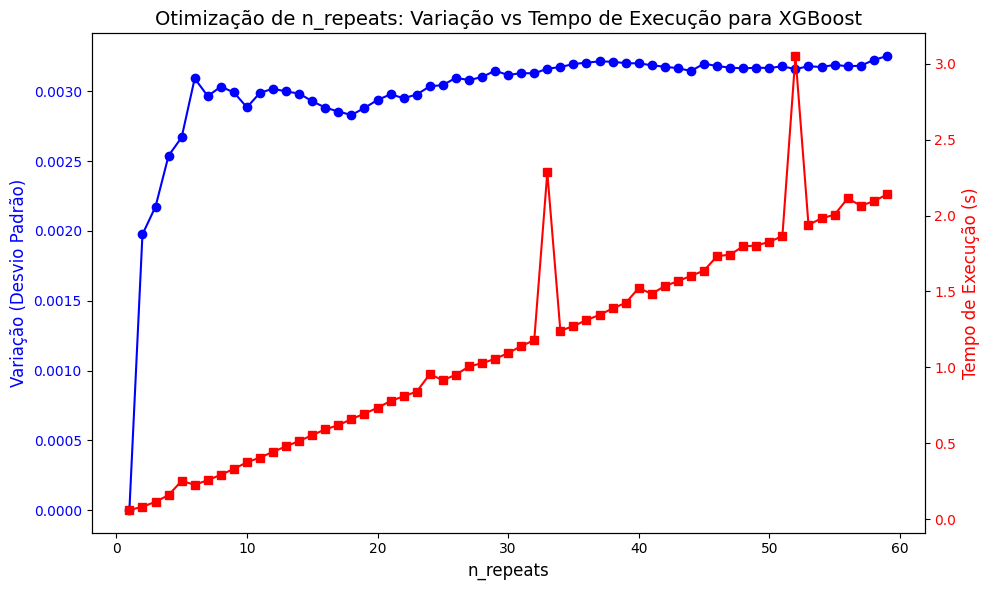

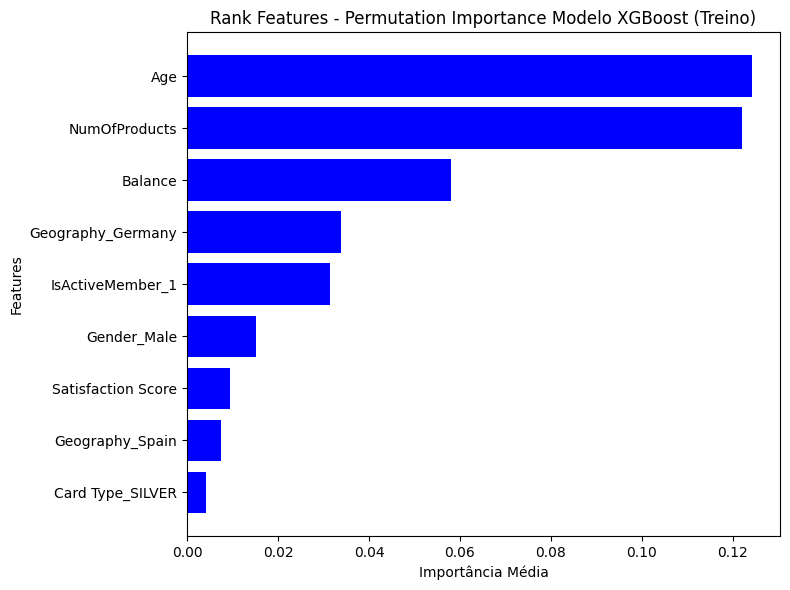

Importância das Features no Conjunto de Teste:
[ 0.10574617  0.03555224  0.11340625 -0.00051524  0.02073505  0.02529996
 -0.002811   -0.00205721 -0.0039919 ]


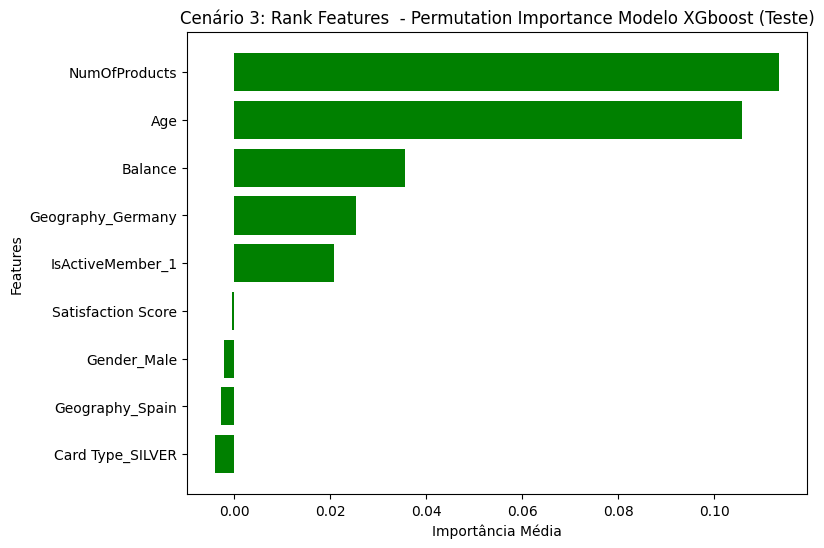

Tempo de Início : 2024-12-16 15:54:19.442897
Tempo de Término: 2024-12-16 15:56:57.458270
Diferença: 00:02


In [54]:
#%% Modelo XGBoost 

#Instanciando as variaveis de treino e teste noavmente so por precaucao 

df_dummies.dtypes

df_dummies['Exited'] = df_dummies['Exited'].astype('int64')


X = df_dummies .drop('Exited', axis=1)

y =  df_dummies['Exited']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(X_train.isnull().sum())
print(X_train.dtypes)
print(y_train.value_counts())


# removendo para o modelo xgboost de acordo com o permutation imporentance desse modelo no cenario 2

X_train=teste_multco_treino.drop(["Exited",
                                  "HasCrCard_1",
                                  "CreditScore",
                                  "Geography_France",
                                  "Point Earned",
                                  "Card Type_PLATINUM",
                                  "EstimatedSalary",
                                  "Card Type_DIAMOND",
                                  "Card Type_GOLD",
                                  "Tenure"], axis=1)
y_train=teste_multco_treino['Exited']




X_test=base_corrige_teste.drop(["Exited",
                                  "HasCrCard_1",
                                  "CreditScore",
                                  "Geography_France",
                                  "Point Earned",
                                  "Card Type_PLATINUM",
                                  "EstimatedSalary",
                                  "Card Type_DIAMOND",
                                  "Card Type_GOLD",
                                  "Tenure"], axis=1)
y_train=teste_multco_treino['Exited']


print(X_train.isnull().sum())
print(X_train.dtypes)
print(y_train.value_counts())


print(len(X_train))
print(len(y_train))


print(len(X_test))
print(len(y_test))

print("Cenário 3:Modelo XGboost")

# === Configurações de log do Optuna ===
# Use apenas uma das opções abaixo, descomentando a desejada:

# 1. Mostrar apenas mensagens críticas (mensagens essenciais como erros graves)
optuna.logging.set_verbosity(optuna.logging.CRITICAL)

# 2. Mostrar apenas erros
# optuna.logging.set_verbosity(optuna.logging.ERROR)

# 3. Mostrar apenas avisos (oculta mensagens informativas)
# optuna.logging.set_verbosity(optuna.logging.WARNING)

# 4. Mostrar todas as mensagens informativas (comportamento padrão)
# optuna.logging.set_verbosity(optuna.logging.INFO)

# 5. Mostrar mensagens detalhadas para depuração
# optuna.logging.set_verbosity(optuna.logging.DEBUG)

# === Suprimir todos os warnings === (isso é para deixar o notebook mais limpo, vale tirar quando desejar 
                                    #fazer qualquer diagnostico, aqui sei que esta tudo ok por enquanto ])
warnings.filterwarnings("ignore")

# === Redirecionar saída padrão e erros para evitar mensagens adicionais ===
f = open(os.devnull, 'w')
os.dup2(f.fileno(), 1)  # Redireciona stdout (saída padrão)
os.dup2(f.fileno(), 2)  # Redireciona stderr (saída de erros)






# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)



# Definir o espaço de busca para os hiperparâmetros do XGBoost
def objective(trial):
    # Hiperparâmetros
    params = {
    'objective': 'binary:logistic',  # Modelo de classificação binária
    'eval_metric': 'auc',  # Métrica de avaliação para maximizar AUC ROC
    'learning_rate': trial.suggest_float('learning_rate', 0.05, 0.1),  # Aumentar o learning rate para acelerar
    'max_depth': trial.suggest_int('max_depth', 5, 8),  # Reduzir a profundidade das árvores
    'n_estimators': trial.suggest_int('n_estimators', 50, 500),  # Menos estimadores para reduzir o tempo de treinamento
    'subsample': trial.suggest_float('subsample', 0.7, 0.9),  # Usar menos dados para acelerar
    'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 1.0),  # Ajustar a amostra de características por árvore
    'gamma': trial.suggest_float('gamma', 0, 0.5),  # Menos regularização (evita overfitting)
    'lambda': trial.suggest_float('lambda', 0.1, 10.0),  # Regularização L2 moderada
    'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),  # Tamanho mínimo das folhas
    'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 5),  # Ajuste para classes desbalanceadas
    'tree_method': 'gpu_hist',  # Usar GPU, se disponível, para acelerar o treinamento
    'verbose': 0  # Desativar verbosidade para evitar sobrecarga de logs

    }
    
    # Passo 1: Balancear os Dados com Undersampling
    undersampler = RandomUnderSampler()
    X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

    # Passo 2: Normalizar os Dados de Treinamento
    scaler = StandardScaler()
    X_balanced_scaled = scaler.fit_transform(X_balanced)
    
    # Passo 3: Rodar a Validação Cruzada e obter predições OOF para o modelo XGBoost
    kf = StratifiedKFold(n_splits=6, shuffle=True)
    xgb_model = xgb.XGBClassifier(**params, device='cuda',n_jobs=-1)
    
    # Obter as predições OOF
    y_pred_oof_xgb = cross_val_score(xgb_model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1',error_score='raise').mean()
    
    return y_pred_oof_xgb  # Maximizar o ROC AUC como métrica de desempenho

# Definir o estudo com Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Número de iterações de otimização

# Melhor conjunto de parâmetros encontrado
best_params = study.best_params
print(f"Melhores parâmetros encontrados: {best_params}")

# Passo 4: Rodar o modelo XGBoost com os melhores parâmetros encontrados
xgb_model = xgb.XGBClassifier(**best_params,tree_method='hist', device='cuda',n_jobs=-1)
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Validar com os dados balanceados
kf = StratifiedKFold(n_splits=6, shuffle=True)
cv_results_xgb = cross_val_score(xgb_model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')

# Exibir os resultados da validação cruzada do modelo XGBoost
print(f'\nAcurácia por fold (Modelo XGBoost): {cv_results_xgb}')
print(f'Média da acurácia (Modelo XGBoost): {cv_results_xgb.mean():.4f}')

# Passo 5: Obter as predições no conjunto de treino (OOF)
y_pred_oof_xgb = xgb_model.fit(X_balanced_scaled, y_balanced).predict_proba(X_balanced_scaled)[:, 1]

# Cálculo das métricas no conjunto de treino (OOF) para o modelo XGBoost
roc_auc_oof_xgb = roc_auc_score(y_balanced, y_pred_oof_xgb)
precision_oof_xgb = precision_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
recall_oof_xgb = recall_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
f1_oof_xgb = f1_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
accuracy_oof_xgb = accuracy_score(y_balanced, (y_pred_oof_xgb > 0.5).astype(int))
conf_matrix_train_xgb = confusion_matrix(y_balanced, xgb_model.predict(X_balanced_scaled))

# Exibir as métricas do conjunto de treino (OOF) para o modelo XGBoost
print("\nMétricas do Conjunto de Treino (OOF) para o Modelo XGBoost:")
print(f"ROC AUC: {roc_auc_oof_xgb:.4f}")
print(f"Precisão: {precision_oof_xgb:.4f}")
print(f"Revocação: {recall_oof_xgb:.4f}")
print(f"F1-Score: {f1_oof_xgb:.4f}")
print(f"Acurácia: {accuracy_oof_xgb:.4f}")
print(conf_matrix_train_xgb)

# Passo 6: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test_xgb = xgb_model.predict_proba(X_test_scaled)[:, 1]

# Cálculo das métricas no conjunto de teste para o modelo XGBoost
roc_auc_test_cenario3_xgb = roc_auc_score(y_test, y_pred_test_xgb)
precision_test_cenario3_xgb = precision_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
recall_test_cenario3_xgb = recall_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
f1_test_cenario3_xgb = f1_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
accuracy_test_cenario3_xgb = accuracy_score(y_test, (y_pred_test_xgb > 0.5).astype(int))
conf_matrix_test_cenario3_xgb = confusion_matrix(y_test, xgb_model.predict(X_test_scaled))

# Exibir as métricas do conjunto de teste para o modelo XGBoost
print("\nMétricas do Conjunto de Teste para o Modelo XGBoost (Cenário 3):")
print(f"ROC AUC: {roc_auc_test_cenario3_xgb:.4f}")
print(f"Acurácia: {accuracy_test_cenario3_xgb:.4f}")
print(f"Precisão: {precision_test_cenario3_xgb:.4f}")
print(f"Revocação: {recall_test_cenario3_xgb:.4f}")
print(f"F1-Score: {f1_test_cenario3_xgb:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_test_cenario3_xgb)



# Passo 7: Plotar a curva ROC usando o conjunto de treino (OOF)
fpr_train_xgb, tpr_train_xgb, _ = roc_curve(y_balanced, y_pred_oof_xgb)
roc_auc_train_xgb = auc(fpr_train_xgb, tpr_train_xgb)

# Curva ROC para o conjunto de teste
fpr_test_cenario3_xgb, tpr_test_cenario3_xgb, _ = roc_curve(y_test, y_pred_test_xgb)
roc_auc_test_cenario3_xgb = auc(fpr_test_cenario3_xgb, tpr_test_cenario3_xgb)

# Gráfico da curva ROC para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.plot(fpr_train_xgb, tpr_train_xgb, color='blue', lw=2, label='Curva ROC Treinamento (Área = {:.2f})'.format(roc_auc_train_xgb))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 3: Curva ROC - Conjunto de Treinamento (Modelo XGBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Gráfico da curva ROC para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_cenario3_xgb, tpr_test_cenario3_xgb, color='green', lw=2, label='Curva ROC Teste (Área = {:.2f})'.format(roc_auc_test_cenario3_xgb))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 3: Curva ROC - Conjunto de Teste (Modelo XGBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cenario3_xgb, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 3 (XGBoost) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()  # Exibir o gráfico sem salvar a imagem

#######PERMUTATION IMPORTANCE#####################


# Permutation Importance no Conjunto de Treino

#permutation_train_xg = permutation_importance(xgb_model, X_balanced_scaled, y_balanced, n_repeats=500, random_state=42,scoring=make_scorer(f1_score))
#importances_train_xg = permutation_train_xg.importances_mean
#print("Importância das Features no Conjunto de Treino:")
#print(importances_train_xg)

# Obter as 5 features mais importantes no treino
#sorted_idx_train_xg = np.argsort(importances_train_xg)[-20:]
#top_features_train_xg = X_test.columns[sorted_idx_train_xg]

# Plotar o gráfico de barra lateral para o conjunto de treino
#plt.figure(figsize=(8, 6))
#plt.barh(top_features_train_xg, importances_train_xg[sorted_idx_train_xg], color='blue')
#plt.xlabel("Importância Média")
#plt.ylabel("Features")
#plt.title("Cenário 3: Rank Features - Permutation Importance Modelo XGboost (Treino)")
#plt.show()





# Permutation Importance no Conjunto de Treino com grafico para escolha do melhor numero de repeticoes

# Lista de valores de n_repeats a serem testados
n_repeats_list = range(1, 60, 1)  # Testar de 1 a 60 em passos de 1
variations = []  # Para armazenar a variação (desvio padrão das importâncias)
time_taken = []  # Para armazenar o tempo de execução

# Loop para calcular a estabilidade e o tempo de execução
for n_repeats in n_repeats_list:
    start_time = time.time()
    result = permutation_importance(
        xgb_model,
        X_balanced_scaled,
        y_balanced,
        n_repeats=n_repeats,
        random_state=42,
        scoring=make_scorer(f1_score),
    )
    time_taken.append(time.time() - start_time)  # Tempo de execução
    variation = np.std(result.importances, axis=1).mean()  # Desvio padrão das importâncias
    variations.append(variation)

# Criar um gráfico com dois eixos y (dual-axis)
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotar a variação das importâncias
ax1.plot(n_repeats_list, variations, color='blue', marker='o', label='Variação das Importâncias')
ax1.set_xlabel('n_repeats', fontsize=12)
ax1.set_ylabel('Variação (Desvio Padrão)', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Adicionar o segundo eixo y para o tempo de execução
ax2 = ax1.twinx()
ax2.plot(n_repeats_list, time_taken, color='red', marker='s', label='Tempo de Execução')
ax2.set_ylabel('Tempo de Execução (s)', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# Título e ajuste do layout
plt.title('Otimização de n_repeats: Variação vs Tempo de Execução para XGBoost', fontsize=14)
fig.tight_layout()
plt.show()

# --- Cálculo da Permutation Importance com n_repeats otimizado (se necessário)
# Com base no gráfico gerado, um número estável foi 50 n_repeats (ajuste conforme necessário)
optimal_n_repeats = 30
permutation_train_xgb = permutation_importance(
    xgb_model,
    X_balanced_scaled,
    y_balanced,
    n_repeats=optimal_n_repeats,
    random_state=42,
    scoring=make_scorer(f1_score),
)
importances_train_xgb = permutation_train_xgb.importances_mean

# Se X_balanced_scaled for um numpy.ndarray, reconverta para DataFrame
X_balanced_scaled_df = pd.DataFrame(X_balanced_scaled, columns=X_train.columns)

# Obter as 5 features mais importantes no treino
sorted_idx_train_xgb = np.argsort(importances_train_xgb)[-20:]
top_features_train_xgb = X_balanced_scaled_df.columns[sorted_idx_train_xgb]

# Plotar o gráfico de barra lateral para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.barh(top_features_train_xgb, importances_train_xgb[sorted_idx_train_xgb], color='blue')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Rank Features - Permutation Importance Modelo XGBoost (Treino)")
plt.tight_layout()
plt.show()





# Permutation Importance no Conjunto de Teste
permutation_test_xg = permutation_importance(xgb_model, X_test_scaled, y_test, n_repeats=30, random_state=42,scoring=make_scorer(f1_score))
importances_test_xg = permutation_test_xg.importances_mean
print("Importância das Features no Conjunto de Teste:")
print(importances_test_xg)

# Obter as 5 features mais importantes no teste
sorted_idx_test_xg = np.argsort(importances_test_xg)[-20:]
top_features_test_xg = X_test.columns[sorted_idx_test_xg]

# Plotar o gráfico de barra lateral para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.barh(top_features_test_xg, importances_test_xg[sorted_idx_test_xg], color='green')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Cenário 3: Rank Features  - Permutation Importance Modelo XGboost (Teste)")
plt.show()



#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

# Cenário 3: Catboost

In [ ]:
#%% Modelo CatBoost

#Instanciando as variaveis de treino e teste noavmente so por precaucao 

df_dummies.dtypes

df_dummies['Exited'] = df_dummies['Exited'].astype('int64')


X = df_dummies .drop('Exited', axis=1)

y =  df_dummies['Exited']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


print(X_train.isnull().sum())
print(X_train.dtypes)
print(y_train.value_counts())


# removendo para o modelo catboost de acordo com o permutation imporentance desse modelo no cenario 2

X_train=teste_multco_treino.drop(["Exited",
                                  "Geography_France",
                                  "Tenure",
                                  "Card Type_DIAMOND",
                                  "CreditScore",
                                  "Card Type_SILVER"], axis=1)
y_train=teste_multco_treino['Exited']



X_test=base_corrige_teste.drop(["Exited",
                                  "Geography_France",
                                  "Tenure",
                                  "Card Type_DIAMOND",
                                  "CreditScore",
                                  "Card Type_SILVER"], axis=1)
y_test=base_corrige_teste['Exited']


print(X_train.isnull().sum())
print(X_train.dtypes)
print(y_train.value_counts())




print("Cenário 3:Modelo CATboost")

# === Configurações de log do Optuna ===
# Use apenas uma das opções abaixo, descomentando a desejada:

# 1. Mostrar apenas mensagens críticas (mensagens essenciais como erros graves)
optuna.logging.set_verbosity(optuna.logging.CRITICAL)

# 2. Mostrar apenas erros
# optuna.logging.set_verbosity(optuna.logging.ERROR)

# 3. Mostrar apenas avisos (oculta mensagens informativas)
# optuna.logging.set_verbosity(optuna.logging.WARNING)

# 4. Mostrar todas as mensagens informativas (comportamento padrão)
# optuna.logging.set_verbosity(optuna.logging.INFO)

# 5. Mostrar mensagens detalhadas para depuração
# optuna.logging.set_verbosity(optuna.logging.DEBUG)

# === Suprimir todos os warnings === (isso é para deixar o notebook mais limpo, vale tirar quando desejar 
                                    #fazer qualquer diagnostico, aqui sei que esta tudo ok por enquanto ])
warnings.filterwarnings("ignore")

# === Redirecionar saída padrão e erros para evitar mensagens adicionais ===
f = open(os.devnull, 'w')
os.dup2(f.fileno(), 1)  # Redireciona stdout (saída padrão)
os.dup2(f.fileno(), 2)  # Redireciona stderr (saída de erros)



# início
start_time_utc = datetime.utcnow() - timedelta(hours=3)
print("Tempo de Início:", start_time_utc)


# Passo 1: Balancear os Dados com Undersampling
undersampler = RandomUnderSampler()
X_balanced, y_balanced = undersampler.fit_resample(X_train, y_train)

# Passo 2: Normalizar os Dados de Treinamento
scaler = StandardScaler()
X_balanced_scaled = scaler.fit_transform(X_balanced)

# Função de objetivo para otimização com Optuna
def objective(trial):
    # Definindo os hiperparâmetros do modelo CatBoost para a otimização
    params = {
        'iterations': trial.suggest_int('iterations', 500, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.05, 0.1),
        'depth': trial.suggest_int('depth', 5, 8),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1, 10),
        'border_count': trial.suggest_int('border_count', 32, 100),
        'random_strength': trial.suggest_float('random_strength', 0.1, 1.0),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bernoulli', 'Poisson']),
        'verbose': 0,
        'early_stopping_rounds': 50,
    }
    
    # Adiciona subsample somente se o bootstrap_type for Bernoulli ou Poisson
    if params['bootstrap_type'] in ['Bernoulli', 'Poisson']:
        params['subsample'] = trial.suggest_float('subsample', 0.7, 0.9)
    
    # Inicializar o modelo CatBoost com os hiperparâmetros sugeridos
    model = CatBoostClassifier(**params, task_type='GPU', thread_count=-1)
    
    # Configurar a validação cruzada
    kf = StratifiedKFold(n_splits=6, shuffle=True, random_state=42)
    cv_results = cross_val_score(model, X_balanced_scaled, y_balanced, cv=kf, scoring='f1')
    
    return cv_results.mean()

# Passo 3: Otimização com Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Exibir os melhores hiperparâmetros encontrados
print("Melhores hiperparâmetros encontrados:", study.best_params)

# Passo 4: Treinar o modelo CatBoost com os melhores hiperparâmetros encontrados
best_params = study.best_params
catboost_model = CatBoostClassifier(**best_params, verbose=0, task_type='GPU', thread_count=-1)

# Treinar o modelo com os dados balanceados
catboost_model.fit(X_balanced_scaled, y_balanced)

# Passo 5: Obter as predições no conjunto de teste
X_test_scaled = scaler.transform(X_test)  # Normalizar os dados de teste
y_pred_test_catboost = catboost_model.predict_proba(X_test_scaled)[:, 1]
y_pred_train_catboost = catboost_model.predict_proba(X_balanced_scaled)[:, 1]


# Cálculo das métricas no conjunto de treino para o modelo CatBoost
roc_auc_train_catboost = roc_auc_score(y_balanced, y_pred_train_catboost)
precision_train_catboost = precision_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
recall_train_catboost = recall_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
f1_train_catboost = f1_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
accuracy_train_catboost = accuracy_score(y_balanced, (y_pred_train_catboost > 0.5).astype(int))
conf_matrix_train_cat = confusion_matrix(y_balanced, (y_pred_train_catboost > 0.5).astype(int))

# Exibir as métricas do conjunto de treino para o modelo CatBoost
print("\nMétricas do Conjunto de Treinamento para o Modelo CatBoost(Cenário 3):")
print(f"ROC AUC: {roc_auc_train_catboost:.4f}")
print(f"Precisão: {precision_train_catboost:.4f}")
print(f"Revocação: {recall_train_catboost:.4f}")
print(f"F1-Score: {f1_train_catboost:.4f}")
print(f"Acurácia: {accuracy_train_catboost:.4f}")
print("Matriz de Confusão (Treinamento):")
print(conf_matrix_train_cat)



# Cálculo das métricas no conjunto de teste para o modelo CatBoost
roc_auc_test_cenario3_cat = roc_auc_score(y_test, y_pred_test_catboost)
precision_test_cenario3_cat = precision_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
recall_test_cenario3_cat = recall_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
f1_test_cenario3_cat = f1_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
accuracy_test_cenario3_cat = accuracy_score(y_test, (y_pred_test_catboost > 0.5).astype(int))
conf_matrix_test_cenario3_cat = confusion_matrix(y_test, (y_pred_test_catboost > 0.5).astype(int))

# Exibir as métricas do conjunto de teste para o modelo CatBoost
print("\nMétricas do Conjunto de Teste para o Modelo CatBoost (Cenário 3):")
print(f"ROC AUC: {roc_auc_test_cenario3_cat:.4f}")
print(f"Acurácia: {accuracy_test_cenario3_cat:.4f}")
print(f"Precisão: {precision_test_cenario3_cat:.4f}")
print(f"Revocação: {recall_test_cenario3_cat:.4f}")
print(f"F1-Score: {f1_test_cenario3_cat:.4f}")
print("Matriz de Confusão:")
print(conf_matrix_test_cenario3_cat)

# Passo 7: Calcular e plotar a curva ROC usando o conjunto de treino para o modelo CatBoost
fpr_train_catboost, tpr_train_catboost, thresholds_train_catboost = roc_curve(y_balanced, y_pred_train_catboost)
roc_auc_train_catboost = auc(fpr_train_catboost, tpr_train_catboost)

# Passo 6: Calcular e plotar a curva ROC usando o conjunto de teste para o modelo CatBoost
fpr_test_denario3_cat, tpr_test_denario3_cat, thresholds_test_catboost = roc_curve(y_test, y_pred_test_catboost)
roc_auc_test_denario3_cat = auc(fpr_test_denario3_cat, tpr_test_denario3_cat)


# Curva ROC para o Conjunto de Treinamento
plt.figure(figsize=(8, 6))
plt.plot(fpr_train_catboost, tpr_train_catboost, color='blue', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_train_catboost))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 3: Curva ROC - Conjunto de Treinamento (Modelo CatBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


# Curva ROC para o Conjunto de Teste
plt.figure(figsize=(8, 6))
plt.plot(fpr_test_denario3_cat, tpr_test_denario3_cat, color='green', lw=2, label='Curva ROC (Área = {:.2f})'.format(roc_auc_test_denario2_cat))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.title('Cenário 3: Curva ROC - Conjunto de Teste (Modelo CatBoost)')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Plotar a Matriz de Confusão
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix_test_cenario3_cat, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negativo', 'Positivo'], yticklabels=['Negativo', 'Positivo'])
plt.title("Matriz de Confusão - Cenário 3 (CatBoost) - Conjunto de Teste")
plt.xlabel("Predição")
plt.ylabel("Real")
plt.show()  # Exibir o gráfico sem salvar a imagem



#######PERMUTATION IMPORTANCE#####################

# Permutation Importance no Conjunto de Treino

#permutation_train_cat = permutation_importance(catboost_model, X_balanced_scaled, y_balanced, n_repeats=500, random_state=42,scoring=make_scorer(f1_score))
#importances_train_cat = permutation_train_cat.importances_mean
#print("Importância das Features no Conjunto de Treino:")
#print(importances_train_cat)

# Obter as 5 features mais importantes no treino
#sorted_idx_train_cat = np.argsort(importances_train_cat)[-20:]
#top_features_train_cat = X_test.columns[sorted_idx_train_cat]

# Plotar o gráfico de barra lateral para o conjunto de treino
#plt.figure(figsize=(8, 6))
#plt.barh(top_features_train_cat, importances_train_cat[sorted_idx_train_cat], color='blue')
#plt.xlabel("Importância Média")
#plt.ylabel("Features")
#plt.title("Cenário 3: Rank Features - Permutation Importance Modelo CATboost (Treino)")
#plt.show()


# Permutation Importance no Conjunto de Treino com grafico para escolha do melhor numero de repeticoes

# Lista de valores de n_repeats a serem testados
n_repeats_list = range(1, 60, 1)  # Testar de 1 a 60 em passos de 1
variations = []  # Para armazenar a variação (desvio padrão das importâncias)
time_taken = []  # Para armazenar o tempo de execução

# Loop para calcular a estabilidade e o tempo de execução
for n_repeats in n_repeats_list:
    start_time = time.time()
    result = permutation_importance(
        catboost_model,
        X_balanced_scaled,
        y_balanced,
        n_repeats=n_repeats,
        random_state=42,
        scoring=make_scorer(f1_score),
    )
    time_taken.append(time.time() - start_time)  # Tempo de execução
    variation = np.std(result.importances, axis=1).mean()  # Desvio padrão das importâncias
    variations.append(variation)

# Criar um gráfico com dois eixos y (dual-axis)
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotar a variação das importâncias
ax1.plot(n_repeats_list, variations, color='blue', marker='o', label='Variação das Importâncias')
ax1.set_xlabel('n_repeats', fontsize=12)
ax1.set_ylabel('Variação (Desvio Padrão)', color='blue', fontsize=12)
ax1.tick_params(axis='y', labelcolor='blue')

# Adicionar o segundo eixo y para o tempo de execução
ax2 = ax1.twinx()
ax2.plot(n_repeats_list, time_taken, color='red', marker='s', label='Tempo de Execução')
ax2.set_ylabel('Tempo de Execução (s)', color='red', fontsize=12)
ax2.tick_params(axis='y', labelcolor='red')

# Título e ajuste do layout
plt.title('Otimização de n_repeats: Variação vs Tempo de Execução para CatBoost', fontsize=14)
fig.tight_layout()
plt.show()

# --- Cálculo da Permutation Importance com n_repeats otimizado (se necessário)
# Com base no gráfico gerado, um número estável foi 50 n_repeats (ajuste conforme necessário)
optimal_n_repeats = 30
permutation_train_cat = permutation_importance(
    catboost_model,
    X_balanced_scaled,
    y_balanced,
    n_repeats=optimal_n_repeats,
    random_state=42,
    scoring=make_scorer(f1_score),
)
importances_train_cat = permutation_train_cat.importances_mean

# Se X_balanced_scaled for um numpy.ndarray, reconverta para DataFrame
X_balanced_scaled_df = pd.DataFrame(X_balanced_scaled, columns=X_train.columns)

# Obter as 5 features mais importantes no treino
sorted_idx_train_cat = np.argsort(importances_train_cat)[-5:]
top_features_train_cat = X_balanced_scaled_df.columns[sorted_idx_train_cat]

# Plotar o gráfico de barra lateral para o conjunto de treino
plt.figure(figsize=(8, 6))
plt.barh(top_features_train_cat, importances_train_cat[sorted_idx_train_cat], color='blue')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Rank Features - Permutation Importance Modelo CatBoost (Treino)")
plt.tight_layout()
plt.show()



# Permutation Importance no Conjunto de Teste
permutation_test_cat = permutation_importance(catboost_model, X_test_scaled, y_test, n_repeats=30, random_state=42,scoring=make_scorer(f1_score))
importances_test_cat = permutation_test_cat.importances_mean
print("Importância das Features no Conjunto de Teste:")
print(importances_test_cat)

# Obter as 5 features mais importantes no teste
sorted_idx_test_cat = np.argsort(importances_test_cat)[-20:]
top_features_test_cat = X_test.columns[sorted_idx_test_cat]

# Plotar o gráfico de barra lateral para o conjunto de teste
plt.figure(figsize=(8, 6))
plt.barh(top_features_test_cat, importances_test_cat[sorted_idx_test_cat], color='green')
plt.xlabel("Importância Média")
plt.ylabel("Features")
plt.title("Cenário 3: Rank Features - Permutation Importance Modelo CATboost (Teste)")
plt.show()





#Inicio
print("Tempo de Início :", start_time_utc- timedelta(hours=3))

# término 
end_time_utc = datetime.utcnow()- timedelta(hours=3)
print("Tempo de Término:", end_time_utc- timedelta(hours=3))

# diferença 
time_difference = end_time_utc - start_time_utc

# Extraindo horas e minutos
total_seconds = time_difference.total_seconds()
hours = int(total_seconds // 3600)
minutes = int((total_seconds % 3600) // 60)

# Exibindo o resultado
print(f"Diferença: {hours:02}:{minutes:02}")

CreditScore           0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
EstimatedSalary       0
Satisfaction Score    0
Point Earned          0
HasCrCard_1           0
IsActiveMember_1      0
Geography_France      0
Geography_Germany     0
Geography_Spain       0
Gender_Male           0
Card Type_DIAMOND     0
Card Type_GOLD        0
Card Type_PLATINUM    0
Card Type_SILVER      0
dtype: int64
CreditScore             int64
Age                     int64
Tenure                  int64
Balance               float64
NumOfProducts           int64
EstimatedSalary       float64
Satisfaction Score      int64
Point Earned            int64
HasCrCard_1             int64
IsActiveMember_1        int64
Geography_France        int64
Geography_Germany       int64
Geography_Spain         int64
Gender_Male             int64
Card Type_DIAMOND       int64
Card Type_GOLD          int64
Card Type_PLATINUM      int64
Card Type_SILVER        int64
dtype: object
E

In [ ]:
#%% graficos do cenario 3

# Criar uma única figura para as três curvas ROC
plt.figure(figsize=(8, 6))

# Curva ROC para Regressão Logística
plt.plot(fpr_test_cenario3_logit, tpr_test_cenario3_logit, color='green', lw=2, label='Curva ROC Logística (AUC = {:.2f})'.format(roc_auc_test_cenario3_logit))

# Curva ROC para XGBoost
plt.plot(fpr_test_cenario3_xgb, tpr_test_cenario3_xgb, color='blue', lw=2, label='Curva ROC XGBoost (AUC = {:.2f})'.format(roc_auc_test_cenario3_xgb))

# Curva ROC para CatBoost
plt.plot(fpr_test_denario3_cat, tpr_test_denario3_cat, color='orange', lw=2, label='Curva ROC CatBoost (AUC = {:.2f})'.format(roc_auc_test_denario3_cat))

# Linha diagonal (linha de referência)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Linha diagonal

# Ajustar os limites dos eixos
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

# Adicionar rótulos e título
plt.xlabel('Taxa de Falsos Positivos (FPR)')  # FPR = False Positive Rate
plt.ylabel('Taxa de Verdadeiros Positivos (TPR)')  # TPR = True Positive Rate
plt.title('Cenário 3: Curva ROC - Conjunto de Teste (Todos Modelos)')


# Adicionar legenda
plt.legend(loc='lower right')

# Exibir o gráfico
plt.grid()
plt.show()